# <span style='color:SteelBlue'>P7 - Implémentez un modèle de scoring</span>

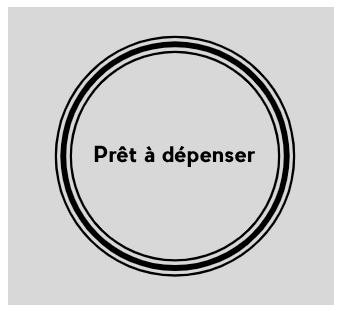

 # <span class='bg-primary'>P7_01_04 - FEATURES SELECTION</span>

Ce notebook traite de la 'feature sélection' des jeux de données des dataframes **train_set** et **test_set** composés des pré-processing (nettoyage, feature engineering)/aggrégations de tous les fichiers mis à notre disposition:

- **bureau.csv**,
- **bureau_balance.csv**,
- **credit_card_balance.csv**,
- **installments_payments.csv**,
- **POS_CASH_balance.csv**,
- **previous_application.csv**

En particulier :

- **Feature selection** : outre la génération de caractéristiques importantes/utiles, il est également essentiel de supprimer les caractéristiques redondantes et bruyantes. Si nous introduisons des déchets/bruits dans notre modèle d'apprentissage automatique, il retournera des déchets/bruits. Nous devons donc trouver de bonnes techniques de sélection des caractéristiques les plus importantes et discriminantes pour notre problématique.

***
Sources
***
Kernel Kaggle sur Home Credit :
- Feature sélection avec Lightgbm : [Source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
- Feature sélection avec BORUTA : [Source](https://www.kaggle.com/rsmits/feature-selection-with-boruta).
- Feature sélection avec BOOSTAROOTA : [Source](https://github.com/Murfin/nn_project/blob/master/NN%20project%20notebook%20ver.%202.ipynb)

## Sommaire du notebook</span> 

## 1. Introduction</span>

*****
**Mission**
*****
**Développer un modèle de scoring de la probabilité de défaut de paiement du client** pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...).

*****
**Objectifs**
*****
- analyser le jeu de données,
- Construire **un modèle de scoring** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
- réaliser un **dashboard interactif** permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit

*****
**Sources**
*****
- [Jeu de données](https://www.kaggle.com/c/home-credit-default-risk/data)

Le **Kernel Kaggle** utilisé pour l'analyse exploratoire ayant l'EDA le plus de commentaires et effectuant une analyse exploratoire complète sur toutes les fichiers csv mis à notre disposition a été livré par **Rishabh Rao** (Student at -Jaipur, Rajasthan, India).
- [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda)

Ce travail est complété par l'auteur par une présentation sur le site medium.com :
[Explications](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

Les fonctions python utilisées pour l'EDA sont extraites du [github](https://github.com/rishabhrao1997/Home-Credit-Default-Risk) et stockées dans la librairie *EDA_KERNEL_FONCTIONS.py*.

In [14]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings

import numpy as np
import pandas as pd
import os
import outils_data
import outils_preprocessing
import outils_model
import eda_kernel_fonctions
import pickle

import matplotlib.pyplot as plt

# Modelisation
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Features selection
from boruta import BorutaPy
from BorutaShap import BorutaShap
from collections import Counter

# Warnings
warnings.filterwarnings('ignore')


# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Lightgbm              : ' + lgb.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils pré-processing : ' + outils_preprocessing.__version__)
print('Outils model          : ' + outils_model.__version__)
print('EDA Kernel fonctions  : ' + eda_kernel_fonctions.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.21.5
Pandas                : 1.4.2
Lightgbm              : 3.3.0
Outils dataframe      : 0.0.4
Outils pré-processing : 0.0.0
Outils model          : 0.0.1
EDA Kernel fonctions  : 0.0.0
Lancé le           : 2022-07-01T14:27:24.123869


In [15]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 4,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## 2. Chargement des jeux de données</span>

**Chargement des dataframes nettoyés**

In [358]:
fic_sav_train_set = \
    'sauvegarde/pre-processing/train_set_preproc.pickle'
# Chargement de train_set
with open(fic_sav_train_set, 'rb') as df_appli_train_set:
    train_set = pickle.load(df_appli_train_set)
train_set.shape

(307507, 615)

In [359]:
fic_sav_appli_train_imp1 = \
    'sauvegarde/pre-processing/train_imp1_set_preproc.pickle'
# Chargement de train_imp1_set
with open(fic_sav_appli_train_imp1, 'rb') as df_appli_train_imp1_set:
    train_imp1_set = pickle.load(df_appli_train_imp1_set)
train_imp1_set.shape

(307507, 622)

In [360]:
fic_sav_appli_train_imp2 = \
    'sauvegarde/pre-processing/train_imp2_set_preproc.pickle'
# Chargement de train_imp2_set
with open(fic_sav_appli_train_imp2, 'rb') as df_appli_train_imp2_set:
    train_imp2_set = pickle.load(df_appli_train_imp2_set)
train_imp2_set.shape

(307507, 617)

In [361]:
fic_sav_test_set = \
    'sauvegarde/pre-processing/test_set_preproc.pickle'
# Chargement de test_set
with open(fic_sav_test_set, 'rb') as df_appli_test_set:
    test_set = pickle.load(df_appli_test_set)
test_set.shape

(48744, 614)

In [362]:
fic_sav_appli_test_imp1 = \
    'sauvegarde/pre-processing/test_imp1_set_preproc.pickle'
# Chargement de test_imp1_set
with open(fic_sav_appli_test_imp1, 'rb') as df_appli_test_imp1_set:
    test_imp1_set = pickle.load(df_appli_test_imp1_set)
test_imp1_set.shape

(48744, 621)

In [363]:
fic_sav_appli_test_imp2 = \
    'sauvegarde/pre-processing/test_imp2_set_preproc.pickle'
# Chargement de test_imp2_set
with open(fic_sav_appli_test_imp2, 'rb') as df_appli_test_imp2_set:
    test_imp2_set = pickle.load(df_appli_test_imp2_set)
test_imp2_set.shape

(48744, 618)

## 3. Features selection</span> 

### 3.1. Features selection : avec LIGHTGBM</span>

- Extrait du Kernel Kaggle : [Source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
- Le but est de conserver uniquement les variables les plus pertinentes en utilisant les features importance déterminée par un modèle, Lightgbm dans notre cas.

**Train_set/test_set**</span>

- La variable magique TARGET_NEIGHBORS_500_MEAN peut être controverser par un client sur le recueil des données des autres clients et difficile à expliquer facilement à un client donc nous allons tester avec ou sans cette variable.

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation des dataframes de travail**

In [22]:
# Résumé des variables qualitatives
desc_train_set = outils_data.description_variables(train_set)
desc_train_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,NAME_INCOME_TYPE_STATE_SERVANT,NAME_INCOME_TYPE_STUDENT,NAME_INCOME_TYPE_UNEMPLOYED,NAME_INCOME_TYPE_WORKING,...,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM,BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SU

In [364]:
# Dataframes de travail
train_sans_fs_lgbm = train_set.copy()
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                             axis=1)
print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
test_sans_fs_lgbm = test_set.copy()
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                           axis=1)
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307507, 614)
test_sans_fs_lgbm : (48744, 613)


In [24]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_sans_fs_lgbm_labels = train_sans_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_sans_fs_lgbm_ids = train_sans_fs_lgbm['SK_ID_CURR']
test_sans_fs_lgbm_ids = test_sans_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_sans_fs_lgbm, test_sans_fs_lgbm = \
    train_sans_fs_lgbm.align(test_sans_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_fs_lgbm : (307507, 612)
test_fs_lgbm : (48744, 612)


**Modélisation**

***Premier passage***

In [25]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_sans = np.zeros(train_sans_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [26]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_sans_features, valid_sans_features, train_sans_y, valid_sans_y = \
        train_test_split(train_sans_fs_lgbm, train_sans_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_sans_features, train_sans_y,
              early_stopping_rounds=100,
              eval_set=[(valid_sans_features, valid_sans_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_sans += model.feature_importances_

[200]	valid_0's auc: 0.79147	valid_0's binary_logloss: 0.507301
[200]	valid_0's auc: 0.786173	valid_0's binary_logloss: 0.505428


In [27]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_sans = feature_importances_sans / 2
df_fs_sans_lightgbm = \
    pd.DataFrame({'feature': list(train_sans_fs_lgbm.columns),
                  'importance': feature_importances_sans}) \
    .sort_values('importance', ascending=False)

df_fs_sans_lightgbm.head()

,feature,importance
69,CREDIT_ANNUITY_RATIO,131.0
78,EXT_SOURCE_SUM,102.5
253,INST_PAY_DAYS_PAYMENT_RATIO_MAX,86.5
9,DAYS_BIRTH,75.5
541,PREV_APP_INTEREST_SHARE_MAX,65.5


In [28]:
# Exploration des variables avec zéro importance
zero_features_sans = \
    list(df_fs_sans_lightgbm[df_fs_sans_lightgbm['importance'] == 0.0][
        'feature'])
print(f'{len(zero_features_sans)} variables avec 0.0 importance :\n')
zero_features_sans

214 variables avec 0.0 importance :



['NAME_HOUSING_TYPE_WITH_PARENTS',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_SUM',
 'OCCUPATION_TYPE_ACCOUNTANTS',
 'OCCUPATION_TYPE_HR_STAFF',
 'OCCUPATION_TYPE_IT_STAFF',
 'OCCUPATION_TYPE_COOKING_STAFF',
 'OCCUPATION_TYPE_CLEANING_STAFF',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_12',
 'OCCUPATION_TYPE_PRIVATE_SERVICE_STAFF',
 'ORGANIZATION_TYPE_CLEANING',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_11',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_10',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_1',
 'PREV_APP_PRODUCT_COMBINATION_POS_OTHER_WITH_INTEREST_SUM',
 'ORGANIZATION_TYPE_EMERGENCY',
 'ORGANIZATION_TYPE_CULTURE',
 'PREV_APP_NFLAG_LAST_APPL_IN_DAY_MEAN',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_13',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_2',
 'OCCUPATION_TYPE_REALTY_AGENTS',
 'NAME_HOUSING_TYPE_CO_OP_APARTMENT',
 'ORGANIZATION_TYPE_AGRICULTURE',
 'ORGANIZATION_TYPE_ADVERTISING',
 'PREV_APP_PRODUCT_COMBINATION_POS_OTHERS_WITHOUT_INTEREST_SUM',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_2',
 'OCCUPATION_TYPE_WAITE

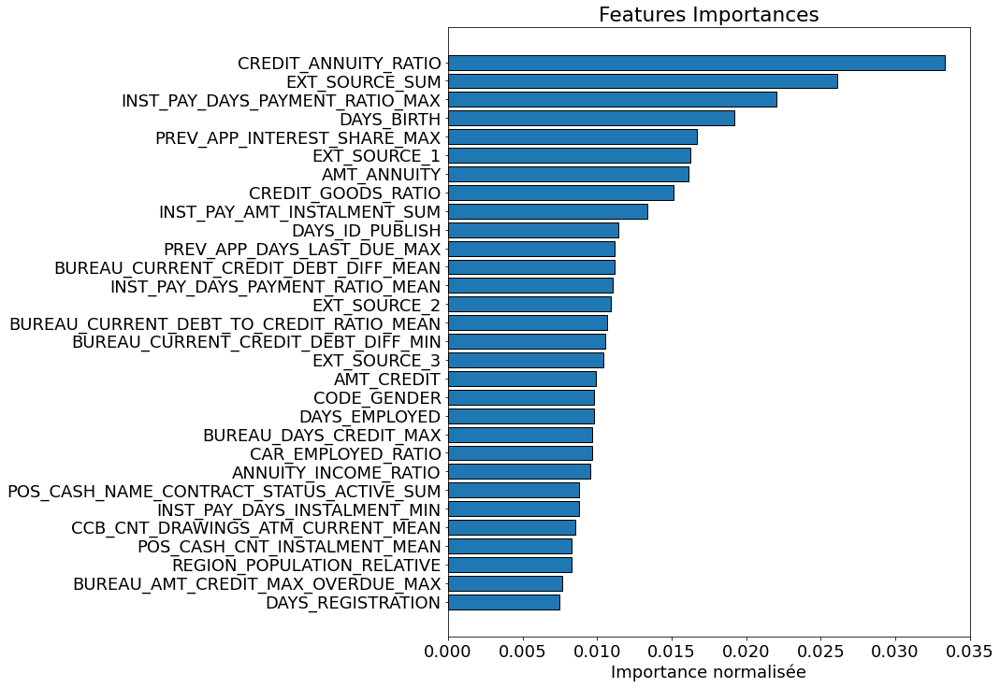

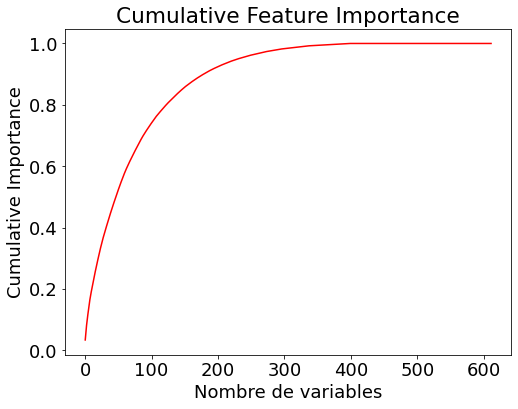

180 variables nécessaires pour 0.90 de cumulative importance


In [29]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_sans_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_sans_lightgbm)

In [30]:
# Suppression des variables avec zéro importance
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=zero_features_sans)
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=zero_features_sans)

print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307507, 398)
test_sans_fs_lgbm : (48744, 398)


***Second passage***

In [31]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2_sans, df_fs_sans_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_sans_fs_lgbm,
                                       train_sans_fs_lgbm_labels)

[200]	valid_0's auc: 0.792242	valid_0's binary_logloss: 0.506136
[200]	valid_0's auc: 0.786304	valid_0's binary_logloss: 0.504963

There are 0 features with 0.0 importance


**Sauvegarde**

In [32]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_sans_lightgbm = \
    'sauvegarde/features-selection/fs_sans_lightgbm.pickle'
with open(fic_sav_fs_sans_lightgbm, 'wb') as f:
    pickle.dump(df_fs_sans_lightgbm_2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [33]:
# Chargement des features importance de ligthgbm
fic_sav_fs_sans_lightgbm = \
    'sauvegarde/features-selection/fs_sans_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_lightgbm, 'rb') as df_fs_sans_lightgbm:
    df_fs_sans_lightgbm = pickle.load(df_fs_sans_lightgbm)
df_fs_sans_lightgbm.shape

(398, 2)

In [34]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = pd.DataFrame({})
df_fs_sans_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_sans_lightgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'lightgbm')

train_sans_set - lightgbm : 398 variables importantes conservées


<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation des dataframes de travail**

In [35]:
# Résumé des variables qualitatives
desc_train_set = outils_data.description_variables(train_set)
desc_train_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,NAME_INCOME_TYPE_STATE_SERVANT,NAME_INCOME_TYPE_STUDENT,NAME_INCOME_TYPE_UNEMPLOYED,NAME_INCOME_TYPE_WORKING,...,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM,BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SU

In [36]:
# Dataframes de travail
train_fs_lgbm = train_set.copy()
print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
test_fs_lgbm = test_set.copy()
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 615)
test_fs_lgbm : (48744, 614)


In [37]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_fs_lgbm_labels = train_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_fs_lgbm_ids = train_fs_lgbm['SK_ID_CURR']
test_fs_lgbm_ids = test_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_fs_lgbm, test_fs_lgbm = train_fs_lgbm.align(test_fs_lgbm,
                                                  join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_lgbm = train_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_fs_lgbm = test_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 613)
test_fs_lgbm : (48744, 613)


**Modélisation**

***Premier passage***

In [38]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances = np.zeros(train_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [39]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_features, valid_features, train_y, valid_y = \
        train_test_split(train_fs_lgbm, train_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_features, train_y,
              early_stopping_rounds=100,
              eval_set=[(valid_features, valid_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances += model.feature_importances_

[200]	valid_0's auc: 0.797097	valid_0's binary_logloss: 0.502357
[200]	valid_0's auc: 0.791248	valid_0's binary_logloss: 0.500058


In [40]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances = feature_importances / 2
df_fs_lightgbm = \
    pd.DataFrame({'feature': list(train_fs_lgbm.columns),
                  'importance': feature_importances}) \
    .sort_values('importance', ascending=False)

df_fs_lightgbm.head()

,feature,importance
85,TARGET_NEIGHBORS_500_MEAN,162.5
9,DAYS_BIRTH,90.0
254,INST_PAY_DAYS_PAYMENT_RATIO_MAX,87.0
78,EXT_SOURCE_SUM,73.0
7,AMT_ANNUITY,71.0


In [41]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features = \
    list(df_fs_lightgbm[df_fs_lightgbm['importance'] == 0.0]['feature'])
print(f'{len(zero_features)} variables avec 0.0 importance :\n')
zero_features

189 variables avec 0.0 importance :



['BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN',
 'FLAG_DOCUMENT_20',
 'FLAG_CONT_MOBILE',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'BUREAU_CREDIT_TYPE_CAR_LOAN_SUM',
 'BUREAU_FLAG_OVERDUE_RECENT_SUM',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'FLAG_DOCUMENT_21',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM',
 'FLAG_DOCUMENT_17',
 'PREV_APP_PRODUCT_COMBINATION_POS_MOBILE_WITHOUT_INTEREST_SUM',
 'FLAG_DOCUMENT_12',
 'FLAG_MOBIL',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_14',
 'OCCUPATION_TYPE_WAITERS_BARMEN_STAFF',
 'BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM',
 'NAME_HOUSING_TYPE_CO_OP_APARTMENT',
 'PREV_APP_PRODUCT_COMBINATION_POS_OTHERS_WITHOUT_INTEREST_SUM',
 'FLAG_DOCUMENT_10',
 'BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM',
 'OCCUPATION_TYPE_IT_STAFF',
 'FLAG_DOCUMENT_5'

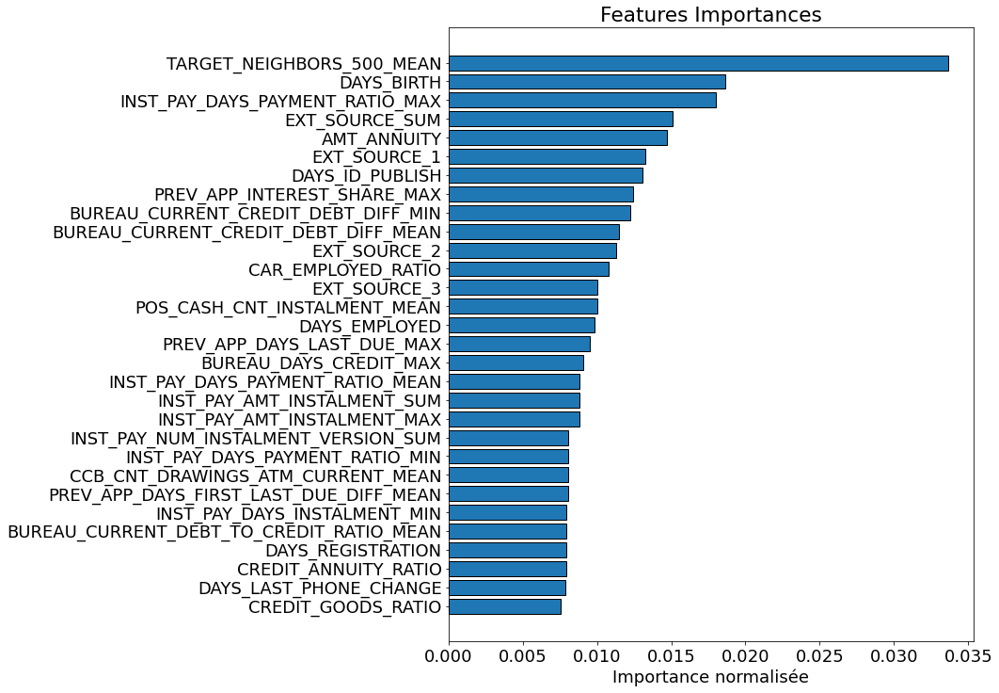

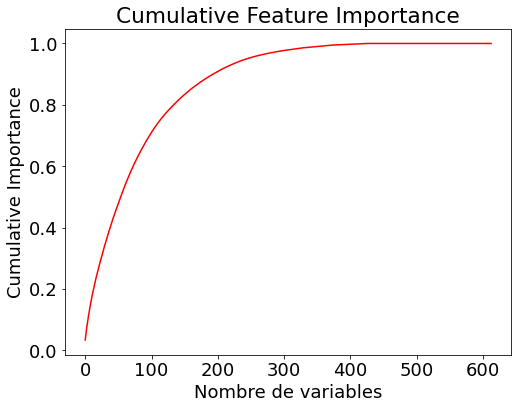

194 variables nécessaires pour 0.90 de cumulative importance


In [42]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm)

In [43]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 424)
test_fs_lgbm : (48744, 424)


***Second passage***

In [44]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2, df_fs_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.797306	valid_0's binary_logloss: 0.501554
[200]	valid_0's auc: 0.791769	valid_0's binary_logloss: 0.499823

There are 21 features with 0.0 importance


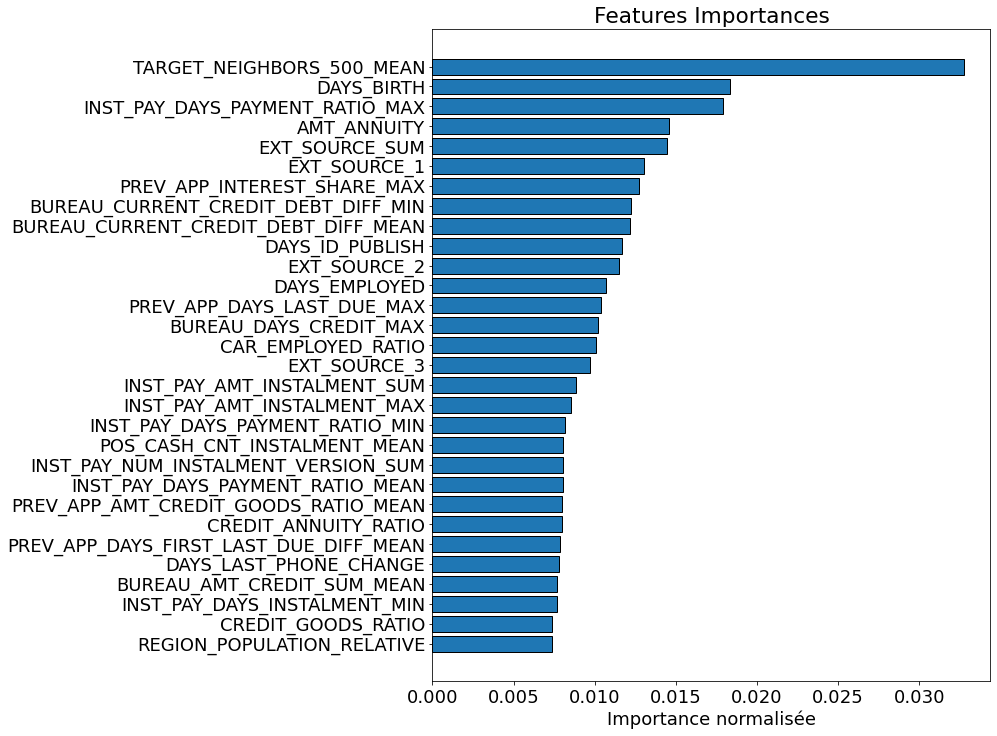

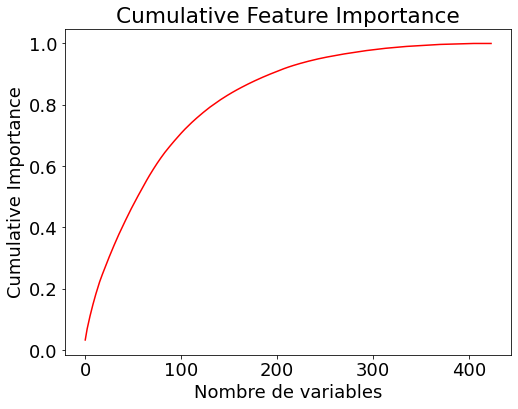

194 variables nécessaires pour 0.90 de cumulative importance


In [45]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_2 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm_2)

In [46]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features_2)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features_2)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 403)
test_fs_lgbm : (48744, 403)


***Troisième passage***

In [47]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_3, df_fs_lightgbm_3 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.797701	valid_0's binary_logloss: 0.501664
[200]	valid_0's auc: 0.791846	valid_0's binary_logloss: 0.499469

There are 0 features with 0.0 importance


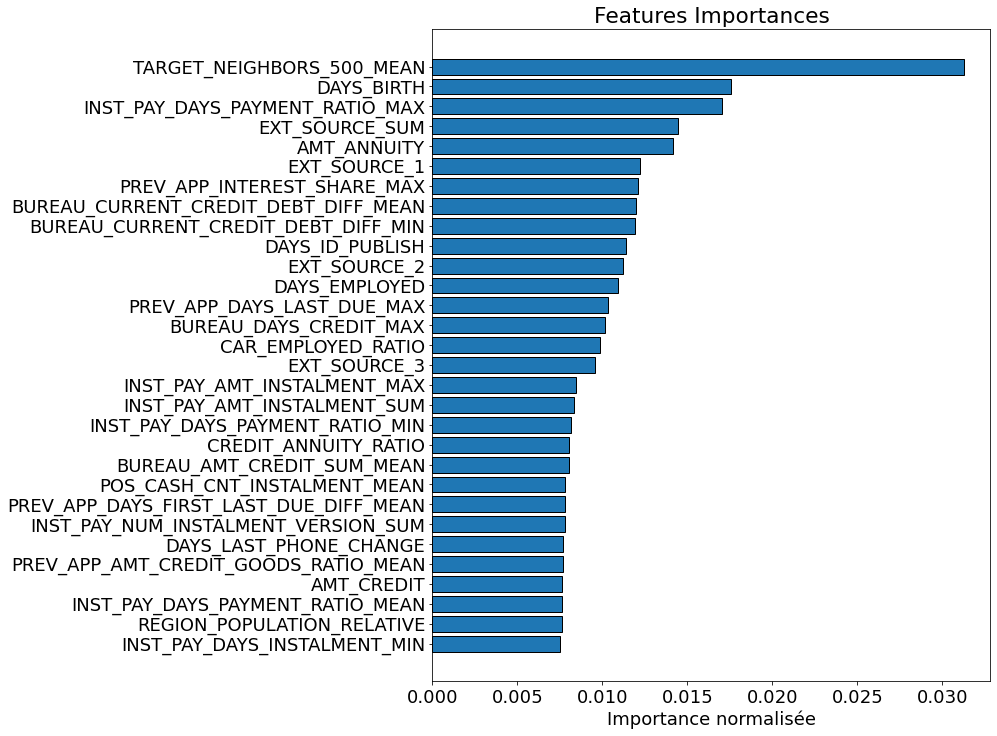

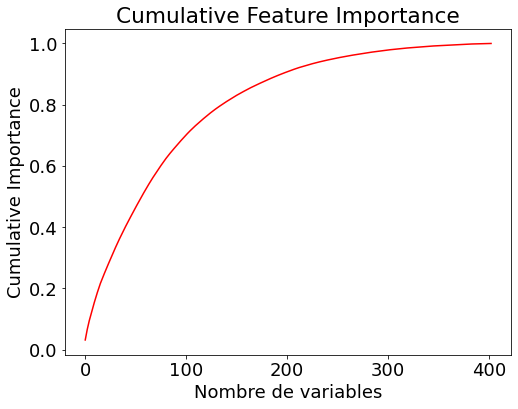

196 variables nécessaires pour 0.90 de cumulative importance


In [48]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_3 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm_3)

In [49]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features_3)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features_3)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 403)
test_fs_lgbm : (48744, 403)


***Quatrième passage***

In [50]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_4, df_fs_lightgbm_4 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.797701	valid_0's binary_logloss: 0.501664
[200]	valid_0's auc: 0.791846	valid_0's binary_logloss: 0.499469

There are 0 features with 0.0 importance


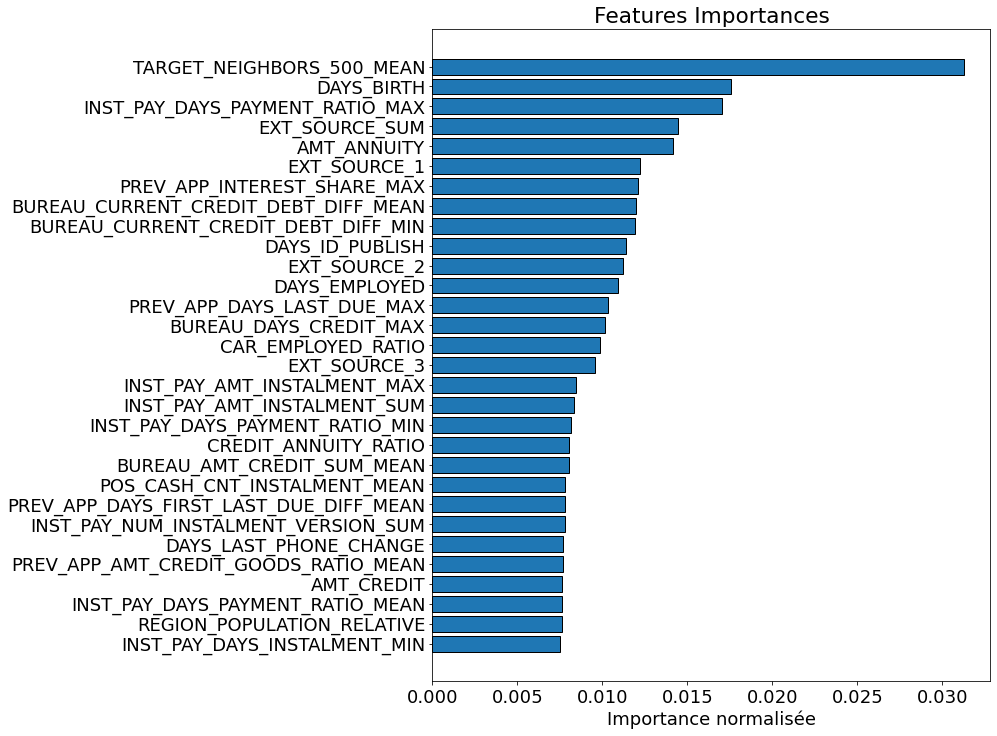

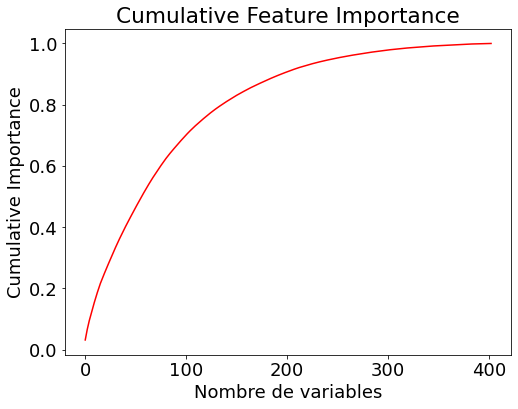

196 variables nécessaires pour 0.90 de cumulative importance


In [51]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_4 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_lightgbm_4)

**Reconstitution des dataframes**

In [52]:
train_fs_lgbm['TARGET'] = train_fs_lgbm_labels
train_fs_lgbm['SK_ID_CURR'] = train_fs_lgbm_ids
print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
test_fs_lgbm['SK_ID_CURR'] = test_fs_lgbm_ids
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307507, 405)
test_fs_lgbm : (48744, 404)


**Sauvegarde**

In [53]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_lightgbm = \
    'sauvegarde/features-selection/fs_lightgbm.pickle'
with open(fic_sav_fs_lightgbm, 'wb') as f:
    pickle.dump(df_fs_lightgbm_4, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [54]:
# Chargement des features importance de ligthgbm
fic_sav_fs_train_set = \
    'sauvegarde/features-selection/fs_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_train_set, 'rb') as df_fs_train_set:
    df_fs_lightgbm = pickle.load(df_fs_train_set)
df_fs_lightgbm.shape

(403, 2)

In [55]:
# Sauvegarde du nombre de features importance
df_fs_train_set = pd.DataFrame({})
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_lightgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'lightgbm')

train_set - lightgbm : 403 variables importantes conservées


**Train_imp1_set/test_imp1_set**</span>

**Préparation des dataframes de travail**

In [56]:
# Résumé des variables qualitatives
desc_train_imp1_set = outils_data.description_variables(train_imp1_set)
desc_train_imp1_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,CREDIT_EXT_RATIO,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MUL,EXT_SOURCE_MAX,EXT_SOURCE_VAR,INCOME_APARTMENT_AVG_MUL,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_XNA,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,...,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM,BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM,BUREAU_CREDIT_TYPE_L

In [57]:
# Dataframes de travail
train_imp1_fs_lgbm = train_imp1_set.copy()
print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
test_imp1_fs_lgbm = test_imp1_set.copy()
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 622)
test_imp1_fs_lgbm : (48744, 621)


In [58]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_imp1_fs_lgbm_labels = train_imp1_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_imp1_fs_lgbm_ids = train_imp1_fs_lgbm['SK_ID_CURR']
test_imp1_fs_lgbm_ids = test_imp1_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_imp1_fs_lgbm, test_imp1_fs_lgbm = \
    train_imp1_fs_lgbm.align(test_imp1_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp1_fs_lgbm = train_imp1_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_imp1_fs_lgbm = test_imp1_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 620)
test_imp1_fs_lgbm : (48744, 620)


**Modélisation**

***Premier passage***

In [59]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_imp1 = np.zeros(train_imp1_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [60]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_imp1_features, valid_imp1_features, train_imp1_y, valid_imp1_y = \
        train_test_split(train_imp1_fs_lgbm, train_imp1_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_imp1_features, train_imp1_y,
              early_stopping_rounds=100,
              eval_set=[(valid_imp1_features, valid_imp1_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_imp1 += model.feature_importances_

[200]	valid_0's auc: 0.795857	valid_0's binary_logloss: 0.503251
[200]	valid_0's auc: 0.79153	valid_0's binary_logloss: 0.499962


In [61]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_imp1 = feature_importances_imp1 / 2
df_fs_imp1_lightgbm = \
    pd.DataFrame({'feature': list(train_imp1_fs_lgbm.columns),
                  'importance': feature_importances_imp1}) \
    .sort_values('importance', ascending=False)

df_fs_imp1_lightgbm.head()

,feature,importance
87,TARGET_NEIGHBORS_500_MEAN,183.5
9,DAYS_BIRTH,108.5
27,EXT_SOURCE_2,97.0
261,INST_PAY_DAYS_PAYMENT_RATIO_MAX,91.5
10,DAYS_EMPLOYED,75.5


In [62]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features_imp1 = \
    list(df_fs_imp1_lightgbm[df_fs_imp1_lightgbm['importance'] == 0.0][
    'feature'])
print(f'{len(zero_features_imp1)} variables avec 0.0 importance :\n')
zero_features_imp1

182 variables avec 0.0 importance :



['BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'BUREAU_CREDIT_TYPE_MOBILE_OPERATOR_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_PURCHASE_OF_SHARES_MARGIN_LENDING__SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_SUM',
 'BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'FLAG_CONT_MOBILE',
 'BUREAU_FLAG_OVERDUE_RECENT_SUM',
 'BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_BUSINESS_DEVELOPMENT_SUM',
 'FLAG_EMP_PHONE',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_SUM',
 'FLAG_MOBIL',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITHOUT_INTEREST_SUM',
 'BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM',
 'FLAG_DOCUMENT_2',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM',
 'FLAG_DOCUMENT_10',
 'BUREAU_CREDIT_ACTIVE_SOLD_SUM',
 'BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM',

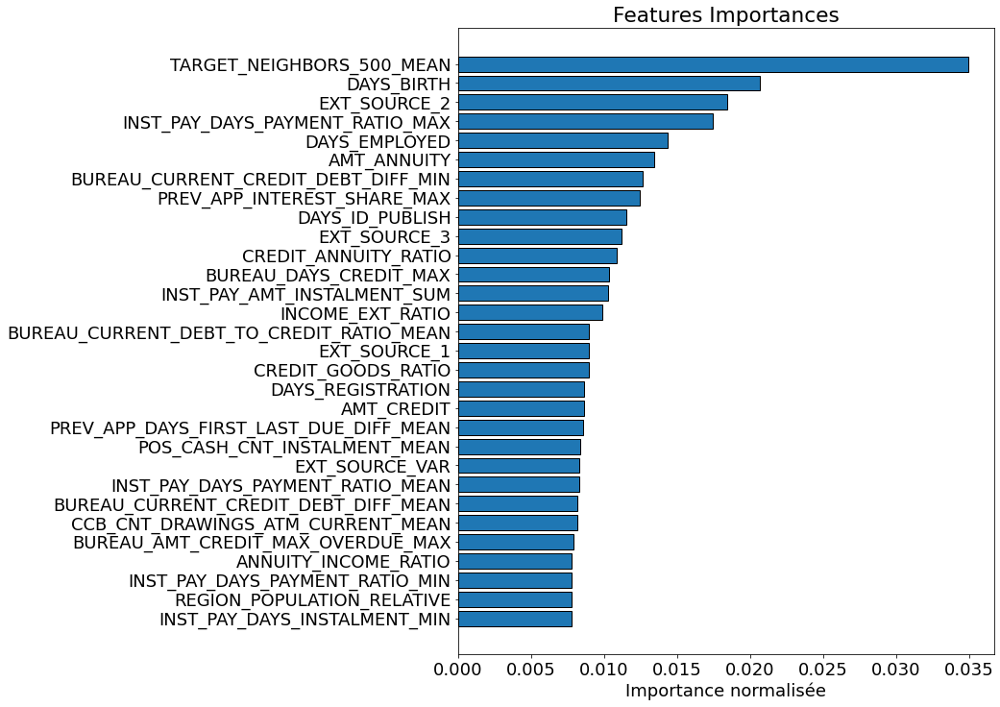

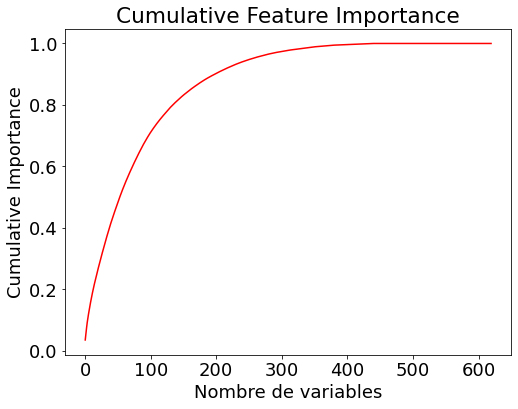

199 variables nécessaires pour 0.90 de cumulative importance


In [63]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp1_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp1_lightgbm)

In [64]:
# Suppression des variables avec zéro importance
train_imp1_fs_lgbm = train_imp1_fs_lgbm.drop(columns=zero_features_imp1)
test_imp1_fs_lgbm = test_imp1_fs_lgbm.drop(columns=zero_features_imp1)

print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 438)
test_imp1_fs_lgbm : (48744, 438)


***Second passage***

In [65]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp1_2, df_fs_imp1_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp1_fs_lgbm,
                                       train_imp1_fs_lgbm_labels)

[200]	valid_0's auc: 0.796518	valid_0's binary_logloss: 0.503217
[200]	valid_0's auc: 0.790017	valid_0's binary_logloss: 0.500404

There are 43 features with 0.0 importance


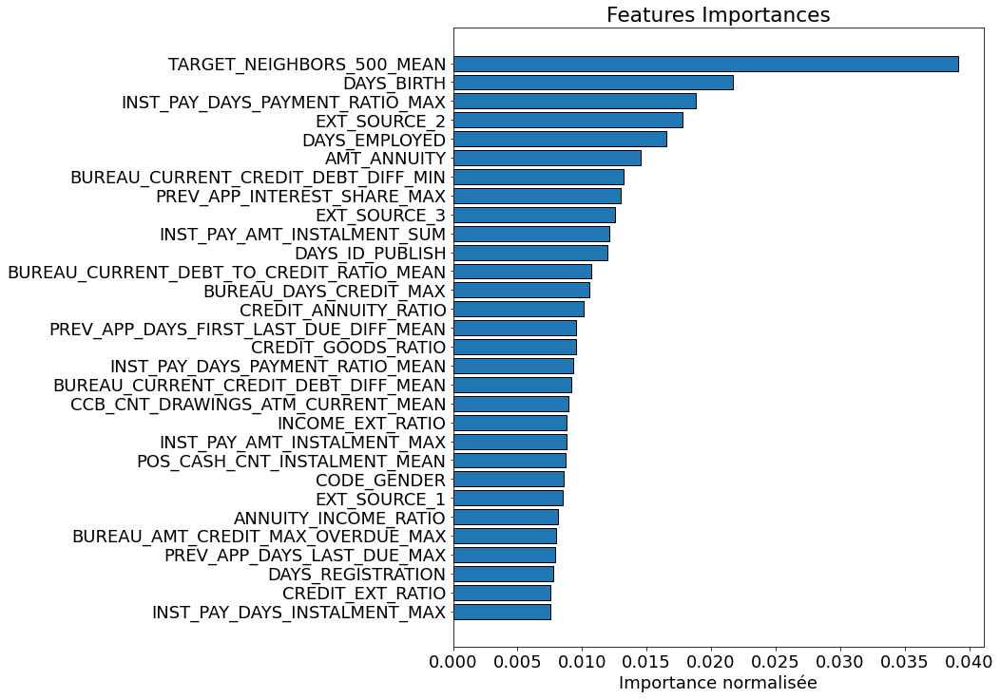

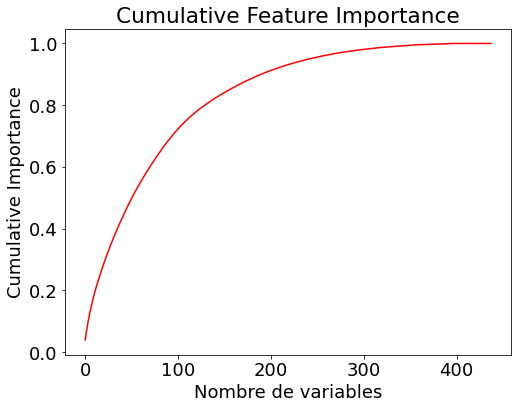

191 variables nécessaires pour 0.90 de cumulative importance


In [66]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp1_lightgbm_norm_2 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp1_lightgbm_2)

In [67]:
# Suppression des variables avec zéro importance
train_imp1_fs_lgbm = train_imp1_fs_lgbm.drop(columns=zero_features_imp1_2)
test_imp1_fs_lgbm = test_imp1_fs_lgbm.drop(columns=zero_features_imp1_2)

print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 395)
test_imp1_fs_lgbm : (48744, 395)


***Troisième passage***

In [68]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp1_3, df_fs_imp1_lightgbm_3 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp1_fs_lgbm,
                                       train_imp1_fs_lgbm_labels)

[200]	valid_0's auc: 0.796699	valid_0's binary_logloss: 0.502889
[200]	valid_0's auc: 0.790695	valid_0's binary_logloss: 0.500886

There are 0 features with 0.0 importance


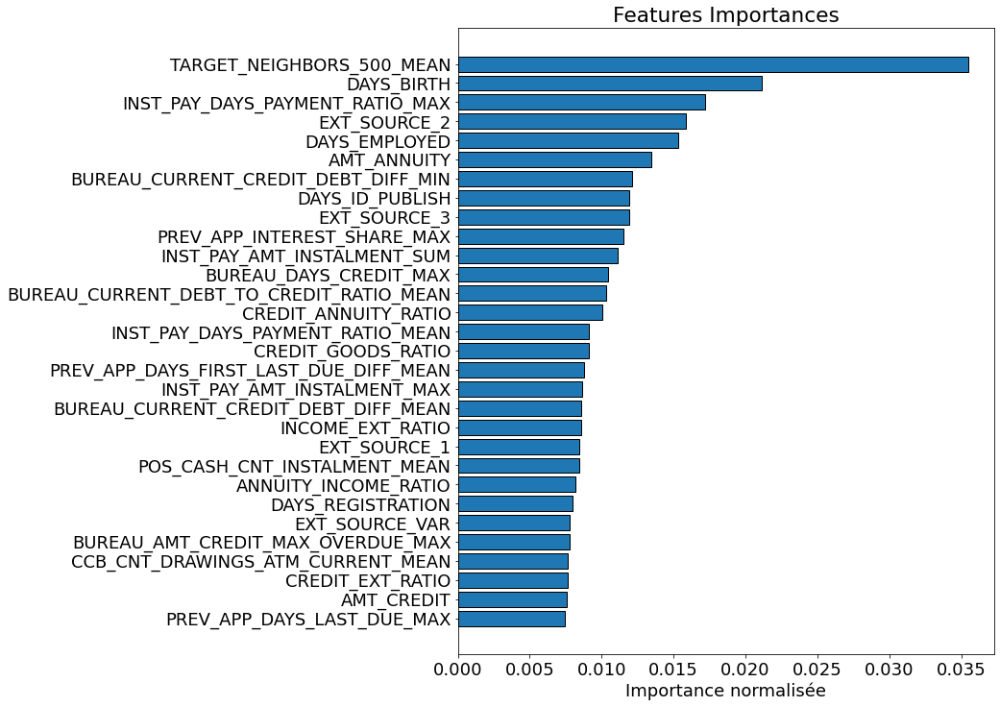

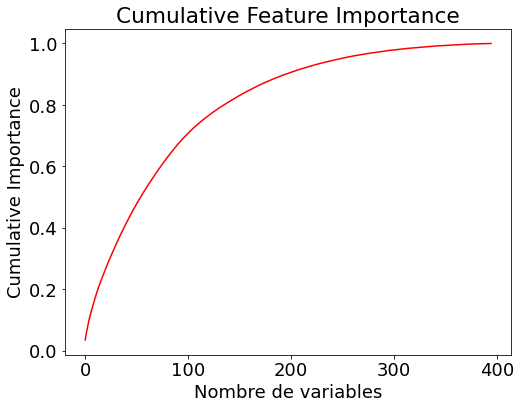

196 variables nécessaires pour 0.90 de cumulative importance


In [69]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp1_lightgbm_norm_3 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp1_lightgbm_3)

**Reconstitution des dataframes**

In [70]:
train_imp1_fs_lgbm['TARGET'] = train_imp1_fs_lgbm_labels
train_imp1_fs_lgbm['SK_ID_CURR'] = train_imp1_fs_lgbm_ids
print(f'train_imp1_fs_lgbm : {train_imp1_fs_lgbm.shape}')
test_imp1_fs_lgbm['SK_ID_CURR'] = test_imp1_fs_lgbm_ids
print(f'test_imp1_fs_lgbm : {test_imp1_fs_lgbm.shape}')

train_imp1_fs_lgbm : (307507, 397)
test_imp1_fs_lgbm : (48744, 396)


**Sauvegarde**

In [71]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_imp1_lightgbm = \
    'sauvegarde/features-selection/fs_imp1_lightgbm.pickle'
with open(fic_sav_fs_imp1_lightgbm, 'wb') as f:
    pickle.dump(df_fs_imp1_lightgbm_3, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [72]:
# Chargement des features importance de ligthgbm
fic_sav_fs_train_imp1_set = \
    'sauvegarde/features-selection/fs_imp1_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_train_imp1_set, 'rb') as df_fs_train_imp1_set:
    df_fs_imp1_lightgbm = pickle.load(df_fs_train_imp1_set)
df_fs_imp1_lightgbm.shape

(395, 2)

In [73]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = pd.DataFrame({})
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_lightgbm,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'lightgbm')

train_imp1_set - lightgbm : 395 variables importantes conservées


**Train_imp2_set/test_imp2_set**</span>

**Préparation des dataframes de travail**

In [74]:
# Résumé des variables qualitatives
desc_train_imp2_set = outils_data.description_variables(train_imp2_set)
desc_train_imp2_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,ANNUITY_INCOME_RATIO,CREDIT_GOODS_RATIO,INCOME_GOODS_DIFF,INCOME_EXT_RATIO,AGE_EMPLOYED_DIFF,LAST_PHONE_EMPLOYED_RATIO,CAR_EMPLOYED_RATIO,FLAG_CONTACTS_SUM,CNT_NON_CHILDREN,EXT_SOURCE_SUM,EXT_SOURCE_MEAN,EXT_SOURCE_VAR,OBS_DEF_30_MUL,OBS_30_CREDIT_RATIO,FLAGS_DOCUMENTS_SUM,ENQ_CREDIT_RATIO,TARGET_NEIGHBORS_500_MEAN,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUP_OF_PEOPLE,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSE_PARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_XNA,NAME_INCOME_TYPE_BUSINESSMAN,NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE,NAME_INCOME_TYPE_STATE_SERVANT,...,PREV_APP_NAME_CONTRACT_STATUS_LAST,PREV_APP_DAYS_DECISION_MEAN,PREV_APP_DAYS_DECISION_MAX,PREV_APP_SELLERPLACE_AREA_MEAN,PREV_APP_SELLERPLACE_AREA_MIN,PREV_APP_CNT_PAYMENT_MEAN,PREV_APP_NAME_YIELD_GROUP_MEAN,PREV_APP_NAME_YIELD_GROUP_LAST,PREV_APP_DAYS_FIRST_DUE_SUM,PREV_APP_DAYS_LAST_DUE_MAX,PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM,PREV_APP_AMT_DECLINED_MEAN,PREV_APP_AMT_DECLINED_SUM,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM,PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN,PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN,PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN,PREV_APP_ANNUITY_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,PREV_APP_LOAN_RATE_MAX,PREV_APP_LOAN_RATE_MEAN,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MAX,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN,BUREAU_CREDIT_ACTIVE_ACTIVE_SUM,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM,BUREAU_CREDIT_ACTIVE_SOLD_SUM,BUREAU_CREDIT_ACTIVE_SOLD_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_2_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM,BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN,BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_SUM,BUREAU_CREDIT_TYPE_ANOTHER_TYPE_OF_LOAN_MEAN,BUREAU_CREDIT_TYPE_CAR_LOAN_SUM,BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN,BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM,BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN,BUREAU_CREDIT_TYPE_

In [75]:
# Dataframes de travail
train_imp2_fs_lgbm = train_imp2_set.copy()
print(f'train_fs_lgbm : {train_imp2_fs_lgbm.shape}')
test_imp2_fs_lgbm = test_imp2_set.copy()
print(f'test_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_fs_lgbm : (307507, 617)
test_fs_lgbm : (48744, 618)


In [76]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_imp2_fs_lgbm_labels = train_imp2_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_imp2_fs_lgbm_ids = train_imp2_fs_lgbm['SK_ID_CURR']
test_imp2_fs_lgbm_ids = test_imp2_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_imp2_fs_lgbm, test_im2_fs_lgbm = \
    train_imp2_fs_lgbm.align(test_imp2_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp2_fs_lgbm = train_imp2_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_imp2_fs_lgbm = test_imp2_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 615)
test_imp2_fs_lgbm : (48744, 617)


**Modélisation**

***Premier passage***

In [77]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_imp2 = np.zeros(train_imp2_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [78]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_imp2_features, valid_imp2_features, train_imp2_y, valid_imp2_y = \
        train_test_split(train_imp2_fs_lgbm, train_imp2_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_imp2_features, train_imp2_y,
              early_stopping_rounds=100,
              eval_set=[(valid_imp2_features, valid_imp2_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_imp2 += model.feature_importances_

[200]	valid_0's auc: 0.796597	valid_0's binary_logloss: 0.502171
[200]	valid_0's auc: 0.790005	valid_0's binary_logloss: 0.499567


In [79]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_imp2 = feature_importances_imp2 / 2
df_fs_imp2_lightgbm = \
    pd.DataFrame({'feature': list(train_imp2_fs_lgbm.columns),
                  'importance': feature_importances_imp2}) \
    .sort_values('importance', ascending=False)

df_fs_imp2_lightgbm.head()

,feature,importance
86,TARGET_NEIGHBORS_500_MEAN,160.0
80,EXT_SOURCE_MEAN,90.0
260,INST_PAY_DAYS_PAYMENT_RATIO_MAX,85.5
592,BUREAU_DAYS_CREDIT_MAX,72.0
9,DAYS_BIRTH,71.5


In [80]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features_imp2 = \
    list(df_fs_imp2_lightgbm[df_fs_imp2_lightgbm['importance'] == 0.0][
    'feature'])
print(f'{len(zero_features_imp2)} variables avec 0.0 importance :\n')
zero_features_imp2

184 variables avec 0.0 importance :



['FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_17',
 'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_SUM',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_14',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_SUM',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_5',
 'BUREAU_CREDIT_ACTIVE_BAD_DEBT_SUM',
 'ORGANIZATION_TYPE_MOBILE',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'ORGANIZATION_TYPE_POSTAL',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'FLAG_DOCUMENT_20',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICAL_SUPPLIES_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_13',
 'NAME_INCOME_TYPE_COMMERCIAL_ASSOCIATE',
 'ORGANIZATION_TYPE_HOUSING',
 'NAME_INCOME_TYPE_BUSINESSMAN',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_1',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_10',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_11',
 'NAME_TYPE_SUITE_OTHER_B',
 'PREV_APP_NAME_GOODS_CATEGORY_EDUCAT

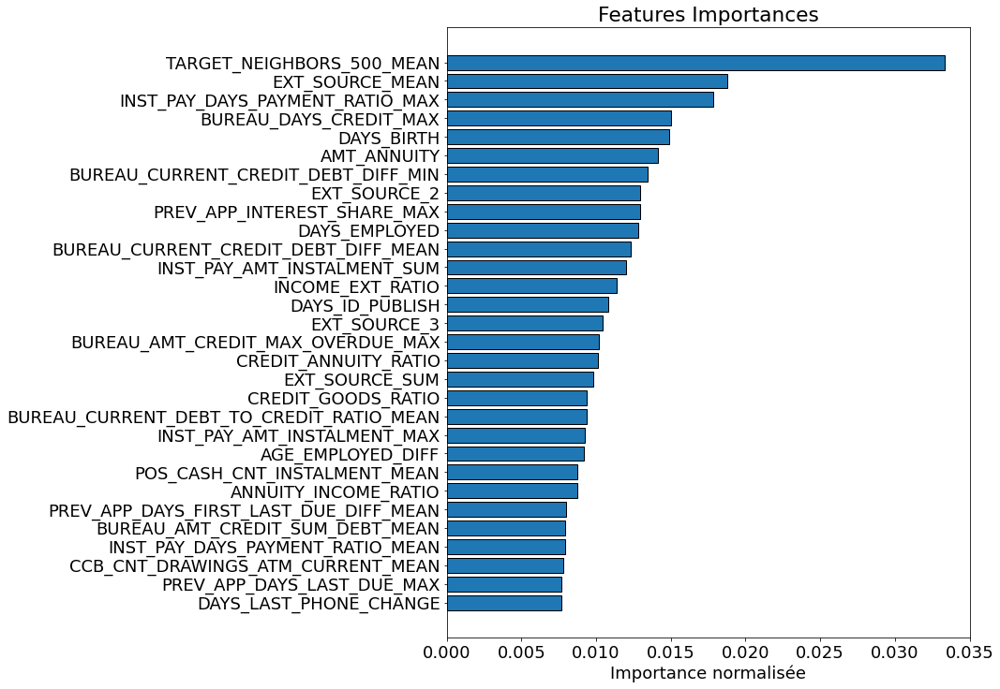

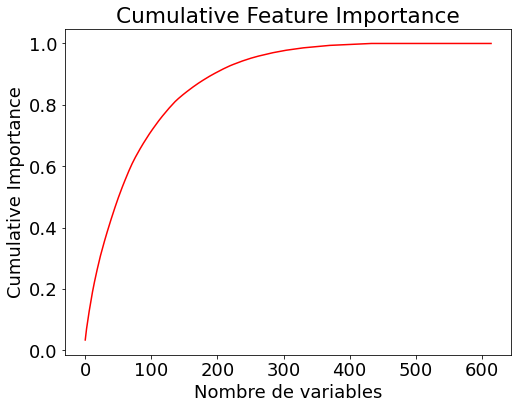

195 variables nécessaires pour 0.90 de cumulative importance


In [81]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp2_lightgbm_norm = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp2_lightgbm)

In [82]:
# Suppression des variables avec zéro importance
train_imp2_fs_lgbm = train_imp2_fs_lgbm.drop(columns=zero_features_imp2)
test_imp2_fs_lgbm = test_imp2_fs_lgbm.drop(columns=zero_features_imp2)

print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 431)
test_imp2_fs_lgbm : (48744, 433)


***Second passage***

In [83]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp2_2, df_fs_imp2_lightgbm_2 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp2_fs_lgbm,
                                       train_imp2_fs_lgbm_labels)

[200]	valid_0's auc: 0.795389	valid_0's binary_logloss: 0.502111
[200]	valid_0's auc: 0.790287	valid_0's binary_logloss: 0.499773

There are 62 features with 0.0 importance


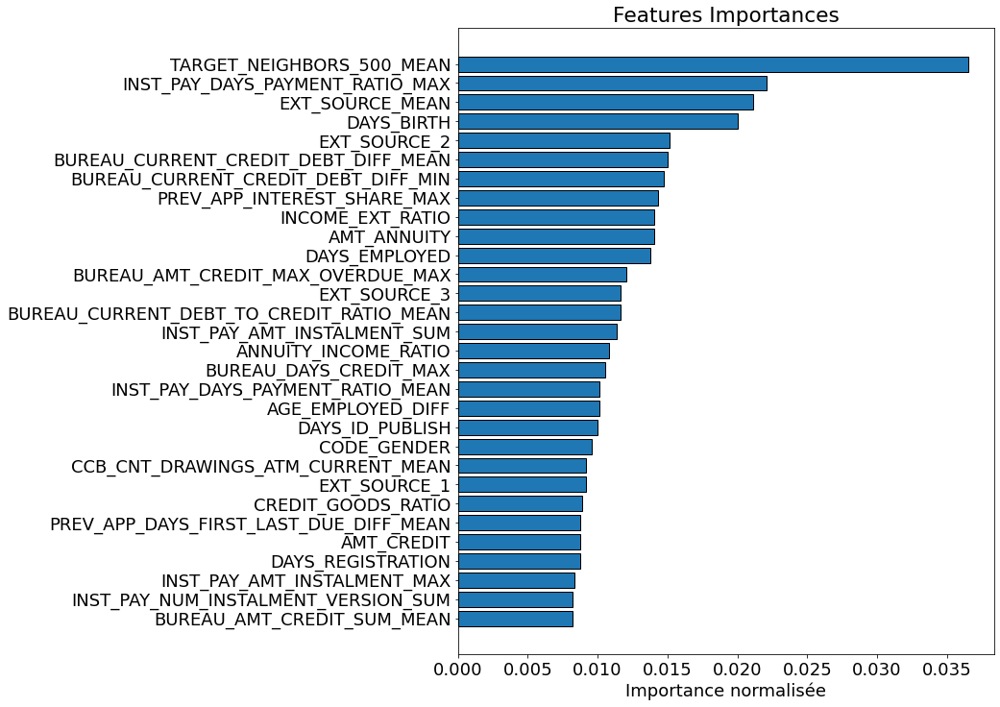

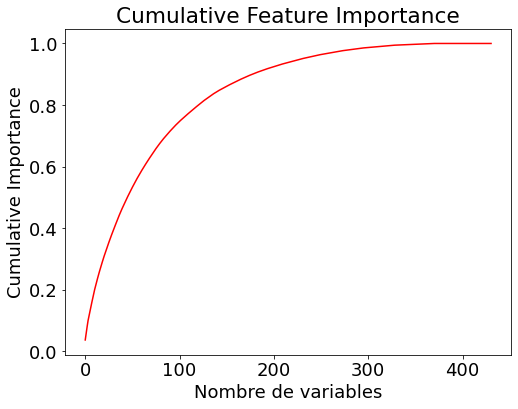

179 variables nécessaires pour 0.90 de cumulative importance


In [84]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp2_lightgbm_norm_2 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp2_lightgbm_2)

In [85]:
# Suppression des variables avec zéro importance
train_imp2_fs_lgbm = train_imp2_fs_lgbm.drop(columns=zero_features_imp2_2)
test_imp2_fs_lgbm = test_imp2_fs_lgbm.drop(columns=zero_features_imp2_2)

print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 369)
test_imp2_fs_lgbm : (48744, 371)


***Troisième passage***

In [86]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_imp2_3, df_fs_imp2_lightgbm_3 = eda_kernel_fonctions \
    .identify_zero_importance_features(train_imp2_fs_lgbm,
                                       train_imp2_fs_lgbm_labels)

[200]	valid_0's auc: 0.796603	valid_0's binary_logloss: 0.501747
[200]	valid_0's auc: 0.790756	valid_0's binary_logloss: 0.499913

There are 0 features with 0.0 importance


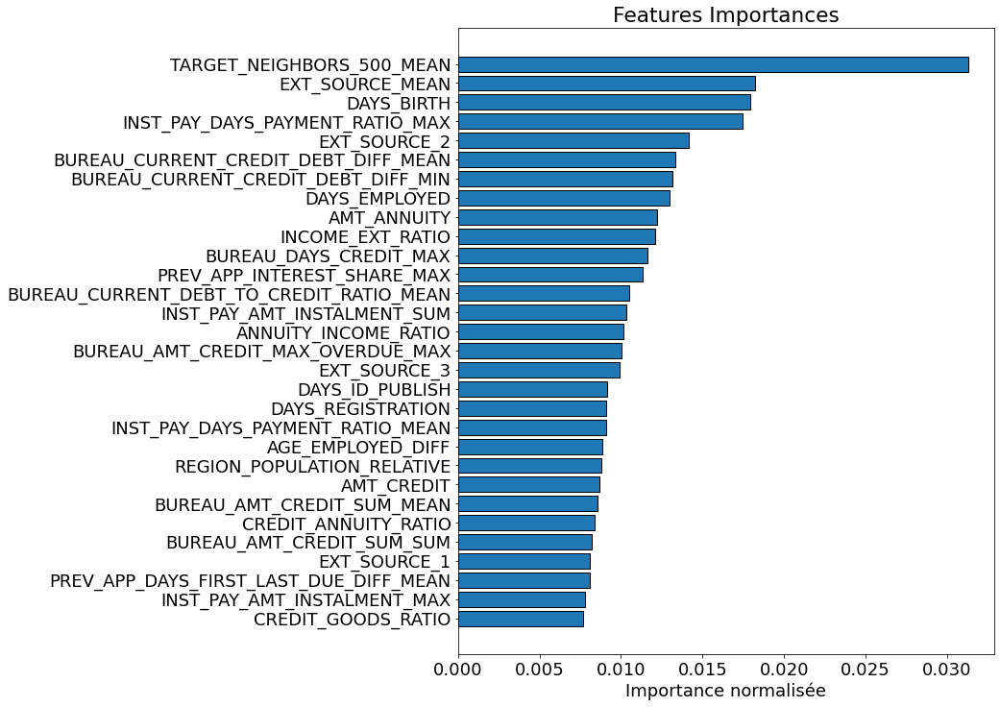

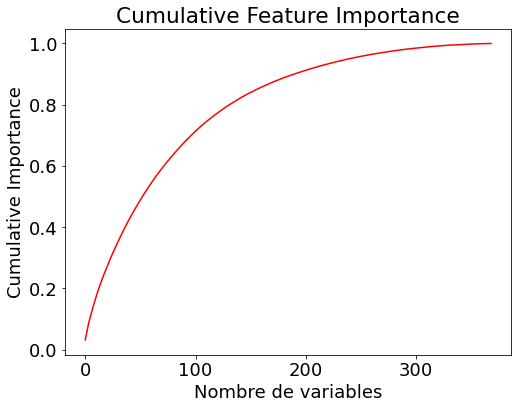

191 variables nécessaires pour 0.90 de cumulative importance


In [87]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_imp2_lightgbm_norm_3 = \
    eda_kernel_fonctions.plot_feature_importances(df_fs_imp2_lightgbm_3)

**Reconstitution des dataframes**

In [88]:
train_imp2_fs_lgbm['TARGET'] = train_imp2_fs_lgbm_labels
train_imp2_fs_lgbm['SK_ID_CURR'] = train_imp2_fs_lgbm_ids
print(f'train_imp2_fs_lgbm : {train_imp2_fs_lgbm.shape}')
test_imp2_fs_lgbm['SK_ID_CURR'] = test_imp2_fs_lgbm_ids
print(f'test_imp2_fs_lgbm : {test_imp2_fs_lgbm.shape}')

train_imp2_fs_lgbm : (307507, 371)
test_imp2_fs_lgbm : (48744, 372)


**Sauvegarde**

In [89]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_imp2_lightgbm = \
    'sauvegarde/features-selection/fs_imp2_lightgbm.pickle'
with open(fic_sav_fs_imp2_lightgbm, 'wb') as f:
    pickle.dump(df_fs_imp2_lightgbm_3, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [90]:
# Chargement des features importance de ligthgbm
fic_sav_fs_train_imp2_set = \
    'sauvegarde/features-selection/fs_imp2_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_train_imp2_set, 'rb') as df_fs_train_imp2_set:
    df_fs_imp2_lightgbm = pickle.load(df_fs_train_imp2_set)
df_fs_imp2_lightgbm.shape

(369, 2)

In [91]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = pd.DataFrame({})
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_lightgbm,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'lightgbm')

train_imp2_set - lightgbm : 369 variables importantes conservées


### 3.2. Features selection : avec BORUTA</span>

- Extrait du Kernel Kaggle de Robert Smith : [Source](https://www.kaggle.com/rsmits/feature-selection-with-boruta)

Boruta, comme RFE, est une technique de sélection de caractéristiques basée sur des enveloppes. Elle est moins connue mais tout aussi puissante. L'idée derrière Boruta est très simple. Étant donné un ensemble de données tabulaires, nous ajustons itérativement un algorithme supervisé (généralement un modèle basé sur un arbre) sur une version étendue des données. La version étendue, à chaque itération, est composée des données d'origine avec, attachée horizontalement, une copie des colonnes mélangées. Nous ne conservons que les caractéristiques qui, dans chaque itération :
ont une plus grande importance que la meilleure des caractéristiques mélangées ;
sont meilleures que prévu par rapport au hasard (en utilisant une distribution binomiale).

- Boruta : [Source](https://towardsdatascience.com/boruta-explained-the-way-i-wish-someone-explained-it-to-me-4489d70e154a) [Source](https://towardsdatascience.com/boruta-and-shap-for-better-feature-selection-20ea97595f4a) [Source](https://blog.exploratory.io/finding-variable-importance-with-random-forest-boruta-28badd116197) [Source](https://towardsdatascience.com/simple-example-using-boruta-feature-selection-in-python-8b96925d5d7a)

**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

***Avec model RandomForestClassifier***

**Préparation du dataframe de travail**

In [92]:
# Dataframes de travail
train_fs_boruta = train_set.copy()
print(f'train_fs_boruta : {train_fs_boruta.shape}')

train_fs_boruta : (307507, 615)


In [93]:
# Sauvegarde des étiquettes
train_fs_boruta_labels = train_fs_boruta['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_boruta = train_fs_boruta.drop(columns=['SK_ID_CURR'])
train_fs_boruta = train_fs_boruta.drop(columns=['TARGET'])

print(f'train_fs_boruta : {train_fs_boruta.shape}')

train_fs_boruta : (307507, 613)


In [94]:
# Initialisation des variables
X = train_fs_boruta.values
y = train_fs_boruta_labels.values.ravel()

- Ensuite, nous configurons le RandomForestClassifier comme estimateur
à utiliser pour Boruta.
- Le max_depth de l'arbre est conseillé sur la page Github de Boruta pour
être entre 3 et 7.

In [95]:
rf = RandomForestClassifier(n_jobs=-1,
                            class_weight='balanced',
                            max_depth=5)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [96]:
# Initialisation de Boruta
boruta_feature_selector = BorutaPy(rf,
                                   n_estimators='auto',
                                   verbose=2,
                                   random_state=21,
                                   max_iter=50,
                                   perc=90)
# Entraînement
boruta_feature_selector.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	9 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	10 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	11 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	12 / 50
Confirmed: 	228
Tentative: 	74
Rejected: 	311
Iteration: 	13 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	14 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	15 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	16 / 50
Confirmed: 	229
Tent

BorutaPy(estimator=RandomForestClassifier(class_weight='balanced', max_depth=5,
                                          n_estimators=448, n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x21D776B1E40),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x21D776B1E40, verbose=2)

In [97]:
# On applique le modèle sur le dataset
X_filtered = boruta_feature_selector.transform(X)
X_filtered.shape

(307507, 229)

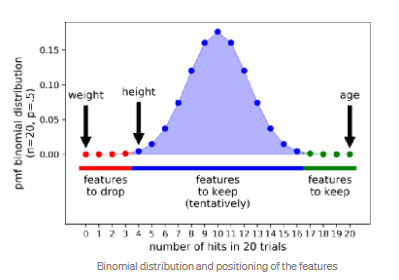

In [99]:
# Liste des variables confirmées avec une haute importance

fs_boruta = list()
features = [f for f in train_fs_boruta.columns]
indexes = np.where(boruta_feature_selector.support_ == True)
for x in np.nditer(indexes):
    fs_boruta.append(features[x])
display(f'fs_boruta : {fs_boruta}')


"fs_boruta : ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'NONLIVINGAREA_AVG', 'EMERGENCYSTATE_MODE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_6', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'INCOME_EXT_RATIO', 'LAST_PHONE_EMPLOYED_RATIO', 'CAR_EMPLOYED_RATIO', 'FLAG_CONTACTS_SUM', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'OBS_DEF_30_MUL', 'OBS_30_CRE

In [100]:
# Dataframe de features importance avec boruta
df_fs_boruta = pd.DataFrame(fs_boruta)

**Sauvegarde**

In [101]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_boruta = \
    'sauvegarde/features-selection/fs_boruta.pickle'
with open(fic_sav_fs_boruta, 'wb') as f:
    pickle.dump(df_fs_boruta, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [102]:
# Chargement des features importance de boruta
fic_sav_fs_boruta = \
    'sauvegarde/features-selection/fs_boruta.pickle'
# Chargement des features importance
with open(fic_sav_fs_boruta, 'rb') as df_fs_boruta:
    df_fs_boruta = pickle.load(df_fs_boruta)
df_fs_boruta.shape

(229, 1)

In [103]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_boruta,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'boruta-RandomForest')

train_set - boruta-RandomForest : 229 variables importantes conservées


***Avec model Lightgbm***

- En utilisant une classe spécifique suite à l'erreur 'num_boost_round' ne peut pas être nulle.

**Préparation du dataframe de travail**

In [104]:
# Dataframes de travail
train_fs_boruta_lgbm = train_set.copy()
print(f'train_fs_boruta_lgbm : {train_fs_boruta_lgbm.shape}')

train_fs_boruta_lgbm : (307507, 615)


In [105]:
# Sauvegarde des étiquettes
train_fs_boruta_lgbm_labels = train_fs_boruta_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_boruta_lgbm = train_fs_boruta_lgbm.drop(columns=['SK_ID_CURR'])
train_fs_boruta_lgbm = train_fs_boruta_lgbm.drop(columns=['TARGET'])

print(f'train_fs_boruta_lgbm : {train_fs_boruta_lgbm.shape}')

train_fs_boruta_lgbm : (307507, 613)


In [106]:
# Initialisation des variables
X = train_fs_boruta_lgbm.values
y = train_fs_boruta_lgbm_labels.values.ravel()

In [107]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced',
                          num_boost_round=100)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [108]:
# Initialisation de Boruta
boruta_feature_selector_lgbm = \
    outils_preprocessing.BorutaPyForLGB(lgbm,
                                        n_estimators='auto',
                                        verbose=2,
                                        random_state=21,
                                        max_iter=50,
                                        perc=90)
# Entraînement
boruta_feature_selector_lgbm.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	99
Tentative: 	101
Rejected: 	413
Iteration: 	9 / 50
Confirmed: 	99
Tentative: 	101
Rejected: 	413
Iteration: 	10 / 50
Confirmed: 	99
Tentative: 	101
Rejected: 	413
Iteration: 	11 / 50
Confirmed: 	99
Tentative: 	101
Rejected: 	413
Iteration: 	12 / 50
Confirmed: 	102
Tentative: 	74
Rejected: 	437
Iteration: 	13 / 50
Confirmed: 	102
Tentative: 	74
Rejected: 	437
Iteration: 	14 / 50
Confirmed: 	102
Tentative: 	74
Rejected: 	437
Iteration: 	15 / 50
Confirmed: 	102
Tentative: 	74
Rejected: 	437
Iteration: 	16 / 50
Confirmed: 	102
Tent

BorutaPyForLGB(estimator=LGBMClassifier(boosting_type='goss',
                                        class_weight='balanced',
                                        n_estimators=-1581, num_boost_round=100,
                                        objective='binary', random_state=7284),
               max_iter=50, n_estimators='auto', perc=90,
               random_state=RandomState(MT19937) at 0x21D76425340, verbose=2)

In [109]:
# On applique le modèle sur le dataset
X_filtered_lgbm = boruta_feature_selector_lgbm.transform(X)
X_filtered_lgbm.shape

(307507, 105)

In [110]:
# Liste des variables confirmées avec une haute importance

fs_boruta_lgbm = list()
features_lgbm = [f for f in train_fs_boruta_lgbm.columns]
indexes_lgbm = np.where(boruta_feature_selector_lgbm.support_ == True)
for x in np.nditer(indexes_lgbm):
    fs_boruta_lgbm.append(features_lgbm[x])
display(f'fs_boruta_lgbm : {fs_boruta_lgbm}')


"fs_boruta_lgbm : ['CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'INCOME_EXT_RATIO', 'CAR_EMPLOYED_RATIO', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'ENQ_CREDIT_RATIO', 'TARGET_NEIGHBORS_500_MEAN', 'NAME_INCOME_TYPE_WORKING', 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION', 'NAME_FAMILY_STATUS_MARRIED', 'OCCUPATION_TYPE_DRIVERS', 'ORGANIZATION_TYPE_SELF_EMPLOYED', 'CCB_AMT_BALANCE_MEAN', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'CCB_BALANCE_LIMIT_RATIO_MEAN', 'CCB_MIN_PAYMENT_RATIO_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN', 'IN

In [111]:
# Dataframe de features importance avec boruta
df_fs_boruta_lgbm = pd.DataFrame(fs_boruta_lgbm)

**Sauvegarde**

In [112]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_boruta_lgbm = \
    'sauvegarde/features-selection/fs_boruta_lgbm.pickle'
with open(fic_sav_fs_boruta_lgbm, 'wb') as f:
    pickle.dump(df_fs_boruta_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [113]:
# Chargement des features importance de boruta
fic_sav_fs_boruta_lgbm = \
    'sauvegarde/features-selection/fs_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_boruta_lgbm, 'rb') as df_fs_boruta_lgbm:
    df_fs_boruta_lgbm = pickle.load(df_fs_boruta_lgbm)
df_fs_boruta_lgbm.shape

(105, 1)

In [114]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_boruta_lgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'boruta-LightGbm-1')

train_set - boruta-LightGbm-1 : 105 variables importantes conservées


***Avec model Lightgbm***

- En utilisant la classe non spécifique BorutaPy, en ajoutant 'num_boost_round' au modèle LightGbm, un warning est affiché mais plus l'erreur fatale.

**Préparation du dataframe de travail**

In [115]:
# Dataframes de travail
train_fs_boruta_lgbm2 = train_set.copy()
print(f'train_fs_boruta_lgbm2 : {train_fs_boruta_lgbm2.shape}')

train_fs_boruta_lgbm2 : (307507, 615)


In [116]:
# Sauvegarde des étiquettes
train_fs_boruta_lgbm2_labels = train_fs_boruta_lgbm2['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_boruta_lgbm2 = train_fs_boruta_lgbm2.drop(columns=['SK_ID_CURR'])
train_fs_boruta_lgbm2 = train_fs_boruta_lgbm2.drop(columns=['TARGET'])

print(f'train_fs_boruta_lgbm2 : {train_fs_boruta_lgbm2.shape}')

train_fs_boruta_lgbm2 : (307507, 613)


In [117]:
# Initialisation des variables
X = train_fs_boruta_lgbm2.values
y = train_fs_boruta_lgbm2_labels.values.ravel()

In [118]:
# Create the model with several hyperparameters
lgbm2 = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced',
                           num_boost_round=100)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [119]:
# Initialisation de Boruta
boruta_feature_selector_lgbm2 = BorutaPy(lgbm2,
                                         n_estimators='auto',
                                         verbose=2,
                                         random_state=21,
                                         max_iter=50,
                                         perc=90)
# Entraînement
boruta_feature_selector_lgbm2.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	99
Tentative: 	92
Rejected: 	422
Iteration: 	9 / 50
Confirmed: 	99
Tentative: 	92
Rejected: 	422
Iteration: 	10 / 50
Confirmed: 	99
Tentative: 	92
Rejected: 	422
Iteration: 	11 / 50
Confirmed: 	99
Tentative: 	92
Rejected: 	422
Iteration: 	12 / 50
Confirmed: 	100
Tentative: 	77
Rejected: 	436
Iteration: 	13 / 50
Confirmed: 	100
Tentative: 	77
Rejected: 	436
Iteration: 	14 / 50
Confirmed: 	100
Tentative: 	77
Rejected: 	436
Iteration: 	15 / 50
Confirmed: 	100
Tentative: 	77
Rejected: 	436
Iteration: 	16 / 50
Confirmed: 	100
Tentativ

BorutaPy(estimator=LGBMClassifier(boosting_type='goss', class_weight='balanced',
                                  n_estimators=-1568, num_boost_round=100,
                                  objective='binary',
                                  random_state=RandomState(MT19937) at 0x21D76425440),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x21D76425440, verbose=2)

In [120]:
# On applique le modèle sur le dataset
X_filtered_lgbm2 = boruta_feature_selector_lgbm2.transform(X)
X_filtered_lgbm2.shape

(307507, 104)

In [121]:
# Liste des variables confirmées avec une haute importance

fs_boruta_lgbm2 = list()
features_lgbm2 = [f for f in train_fs_boruta_lgbm2.columns]
indexes_lgbm2 = np.where(boruta_feature_selector_lgbm2.support_ == True)
for x in np.nditer(indexes_lgbm2):
    fs_boruta_lgbm2.append(features_lgbm2[x])
display(f'fs_boruta_lgbm : {fs_boruta_lgbm2}')


"fs_boruta_lgbm : ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'CAR_EMPLOYED_RATIO', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'ENQ_CREDIT_RATIO', 'TARGET_NEIGHBORS_500_MEAN', 'NAME_INCOME_TYPE_WORKING', 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION', 'NAME_FAMILY_STATUS_MARRIED', 'OCCUPATION_TYPE_CORE_STAFF', 'ORGANIZATION_TYPE_SELF_EMPLOYED', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'CCB_BALANCE_LIMIT_RATIO_MEAN', 'CCB_MIN_PAYMENT_RATIO_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_SUM', '

In [122]:
# Dataframe de features importance avec boruta
df_fs_boruta_lgbm2 = pd.DataFrame(fs_boruta_lgbm2)

**Sauvegarde**

In [123]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_boruta_lgbm2 = \
    'sauvegarde/features-selection/fs_boruta_lgbm2.pickle'
with open(fic_sav_fs_boruta_lgbm2, 'wb') as f:
    pickle.dump(df_fs_boruta_lgbm2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [124]:
# Chargement des features importance de boruta
fic_sav_fs_boruta_lgbm2 = \
    'sauvegarde/features-selection/fs_boruta_lgbm2.pickle'
# Chargement des features importance
with open(fic_sav_fs_boruta_lgbm2, 'rb') as df_fs_boruta_lgbm2:
    df_fs_boruta_lgbm2 = pickle.load(df_fs_boruta_lgbm2)
df_fs_boruta_lgbm2.shape

(104, 1)

In [125]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_boruta_lgbm2,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'boruta-LightGbm-2')

train_set - boruta-LightGbm-2 : 104 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [126]:
# Dataframes de travail
train_fs_sans_boruta_lgbm = train_set.copy()
train_fs_sans_boruta_lgbm = \
    train_fs_sans_boruta_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_fs_sans_boruta_lgbm : {train_fs_sans_boruta_lgbm.shape}')

train_fs_sans_boruta_lgbm : (307507, 614)


In [127]:
# Sauvegarde des étiquettes
train_fs_sans_boruta_lgbm_labels = train_fs_sans_boruta_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_sans_boruta_lgbm =\
    train_fs_sans_boruta_lgbm.drop(columns=['SK_ID_CURR'])
train_fs_sans_boruta_lgbm = train_fs_sans_boruta_lgbm.drop(columns=['TARGET'])

print(f'train_fs_sans_boruta_lgbm : {train_fs_sans_boruta_lgbm.shape}')

train_fs_sans_boruta_lgbm : (307507, 612)


In [128]:
# Initialisation des variables
X = train_fs_sans_boruta_lgbm.values
y = train_fs_sans_boruta_lgbm_labels.values.ravel()

In [129]:
# Create the model with several hyperparameters
lgbm_sans = lgb.LGBMClassifier(objective='binary',
                               boosting_type='goss',
                               n_estimators=10000,
                               class_weight='balanced',
                               num_boost_round=100)

- Ensuite, nous configurons Boruta.
    - Il utilise l'interface scikit-learn autant que possible, donc nous pouvons utiliser fit(X, y), transform(X), fit_transform(X, y).
    - Je le laisse tourner pour un maximum de max_iter = 50 itérations.
    - Avec perc = 90, un seuil est spécifié.
    - Plus le seuil est bas, plus de caractéristiques seront sélectionnées.
    - J'utilise généralement un pourcentage entre 80 et 90.

In [130]:
# Initialisation de Boruta
boruta_feature_selector_sans_lgbm = BorutaPy(lgbm_sans,
                                             n_estimators='auto',
                                             verbose=2,
                                             random_state=21,
                                             max_iter=50,
                                             perc=90)
# Entraînement
boruta_feature_selector_sans_lgbm.fit(X, y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	612
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	106
Tentative: 	92
Rejected: 	414
Iteration: 	9 / 50
Confirmed: 	106
Tentative: 	92
Rejected: 	414
Iteration: 	10 / 50
Confirmed: 	106
Tentative: 	92
Rejected: 	414
Iteration: 	11 / 50
Confirmed: 	106
Tentative: 	92
Rejected: 	414
Iteration: 	12 / 50
Confirmed: 	108
Tentative: 	68
Rejected: 	436
Iteration: 	13 / 50
Confirmed: 	108
Tentative: 	68
Rejected: 	436
Iteration: 	14 / 50
Confirmed: 	108
Tentative: 	68
Rejected: 	436
Iteration: 	15 / 50
Confirmed: 	108
Tentative: 	68
Rejected: 	436
Iteration: 	16 / 50
Confirmed: 	108
Tent

BorutaPy(estimator=LGBMClassifier(boosting_type='goss', class_weight='balanced',
                                  n_estimators=-1661, num_boost_round=100,
                                  objective='binary',
                                  random_state=RandomState(MT19937) at 0x21D76425640),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x21D76425640, verbose=2)

In [131]:
# On applique le modèle sur le dataset
X_filtered_lgbm_sans = boruta_feature_selector_sans_lgbm.transform(X)
X_filtered_lgbm_sans.shape

(307507, 108)

In [132]:
# Liste des variables confirmées avec une haute importance

fs_boruta_sans_lgbm = list()
features_lgbm_sans = [f for f in train_fs_sans_boruta_lgbm.columns]
indexes_lgbm_sans = np.where(boruta_feature_selector_sans_lgbm.support_ == True)
for x in np.nditer(indexes_lgbm_sans):
    fs_boruta_sans_lgbm.append(features_lgbm_sans[x])
display(f'fs_boruta_sans_lgbm : {fs_boruta_sans_lgbm}')


"fs_boruta_sans_lgbm : ['CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'AMT_REQ_CREDIT_BUREAU_QRT', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO', 'ANNUITY_INCOME_RATIO', 'CREDIT_GOODS_RATIO', 'INCOME_GOODS_DIFF', 'INCOME_EXT_RATIO', 'CAR_EMPLOYED_RATIO', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'FLAGS_DOCUMENTS_SUM', 'ENQ_CREDIT_RATIO', 'NAME_INCOME_TYPE_WORKING', 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION', 'NAME_FAMILY_STATUS_MARRIED', 'OCCUPATION_TYPE_CORE_STAFF', 'OCCUPATION_TYPE_DRIVERS', 'ORGANIZATION_TYPE_SELF_EMPLOYED', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'CCB_CNT_DRAWINGS_CURRENT_SUM', 'CCB_BALANCE_LIMIT

In [133]:
# Dataframe de features importance avec boruta
df_fs_boruta_sans_lgbm = pd.DataFrame(fs_boruta_sans_lgbm)

**Sauvegarde**

In [134]:
# Sauvegarde des features importances avec boruta
fic_sav_fs_sans_boruta_lgbm = \
    'sauvegarde/features-selection/fs_sans_boruta_lgbm.pickle'
with open(fic_sav_fs_sans_boruta_lgbm, 'wb') as f:
    pickle.dump(df_fs_boruta_sans_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [135]:
# Chargement des features importance de boruta
fic_sav_fs_sans_boruta_lgbm = \
    'sauvegarde/features-selection/fs_sans_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_boruta_lgbm, 'rb') as df_fs_sans_boruta_lgbm:
    df_fs_sans_boruta_lgbm = pickle.load(df_fs_sans_boruta_lgbm)
df_fs_sans_boruta_lgbm.shape

(108, 1)

In [136]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_sans_boruta_lgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'boruta-LightGbm')

train_sans_set - boruta-LightGbm : 108 variables importantes conservées


**Train_imp1_set/test_imp1_set**</span>

***Avec RandomForest***

**Préparation du dataframe de travail**

In [137]:
# Dataframes de travail
train_imp1_fs_boruta = train_imp1_set.copy()
print(f'train_imp1_fs_boruta : {train_imp1_fs_boruta.shape}')

train_imp1_fs_boruta : (307507, 622)


In [138]:
# Gestion des valeurs infinies
train_imp1_fs_boruta = train_imp1_fs_boruta.replace([np.inf, -np.inf],
                                                    np.nan)
train_imp1_fs_boruta = train_imp1_fs_boruta.fillna(0)

**Feature sélection avec boruta**

In [139]:
df_fs_imp1_boruta =\
    outils_preprocessing.features_selection_boruta(train_imp1_fs_boruta,
                                                   'fs_imp1_boruta')

train_fs_boruta : (307507, 620)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	238
Tentative: 	69
Rejected: 	313
Iteration: 	9 / 50
Confirmed: 	238
Tentative: 	69
Rejected: 	313
Iteration: 	10 / 50
Confirmed: 	238
Tentative: 	69
Rejected: 	313
Iteration: 	11 / 50
Confirmed: 	238
Tentative: 	69
Rejected: 	313
Iteration: 	12 / 50
Confirmed: 	239
Tentative: 	68
Rejected: 	313
Iteration: 	13 / 50
Confirmed: 	239
Tentative: 	68
Rejected: 	313
Iteration: 	14 / 50
Confirmed: 	239
Tentative: 	58
Rejected: 	323
Iteration: 	15 / 50
Confirmed: 	239
Tentative: 	58
Rejected: 	323
Iteratio

**Chargement du dataframe sauvegardé**

In [140]:
# Chargement des features importance de boruta
fic_sav_fs_imp1_boruta = \
    'sauvegarde/features-selection/fs_imp1_boruta.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp1_boruta, 'rb') as df_fs_imp1_boruta:
    df_fs_imp1_boruta = pickle.load(df_fs_imp1_boruta)
df_fs_imp1_boruta.shape

(239, 1)

In [141]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_boruta,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'boruta-RandomForest')

train_imp1_set - boruta-RandomForest : 239 variables importantes conservées


***Avec Lightgbm***

**Préparation du dataframe de travail**

In [142]:
# Dataframes de travail
train_imp1_fs_boruta_lgbm = train_imp1_set.copy()
print(f'train_imp1_fs_boruta_lgbm : {train_imp1_fs_boruta_lgbm.shape}')

train_imp1_fs_boruta_lgbm : (307507, 622)


In [143]:
# Gestion des valeurs infinies
train_imp1_fs_boruta_lgbm = \
    train_imp1_fs_boruta_lgbm.replace([np.inf, -np.inf], np.nan)
train_imp1_fs_boruta_lgbm = train_imp1_fs_boruta_lgbm.fillna(0)

**Feature sélection avec boruta**

In [144]:
df_fs_imp1_boruta_lgbm = outils_preprocessing \
    .features_selection_boruta_lgbm(train_imp1_fs_boruta_lgbm,
                                    'fs_imp1_boruta_lgbm')

train_fs_boruta : (307507, 620)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	620
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	98
Tentative: 	94
Rejected: 	428
Iteration: 	9 / 50
Confirmed: 	98
Tentative: 	94
Rejected: 	428
Iteration: 	10 / 50
Confirmed: 	98
Tentative: 	94
Rejected: 	428
Iteration: 	11 / 50
Confirmed: 	98
Tentative: 	94
Rejected: 	428
Iteration: 	12 / 50
Confirmed: 	100
Tentative: 	74
Rejected: 	446
Iteration: 	13 / 50
Confirmed: 	100
Tentative: 	74
Rejected: 	446
Iteration: 	14 / 50
Confirmed: 	100
Tentative: 	74
Rejected: 	446
Iteration: 	15 / 50
Confirmed: 	100
Tentative: 	74
Rejected: 	446
Iteration: 	

**Chargement du dataframe sauvegardé**

In [145]:
# Chargement des features importance de boruta
fic_sav_fs_imp1_boruta_lgbm = \
    'sauvegarde/features-selection/fs_imp1_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp1_boruta_lgbm, 'rb') as df_fs_imp1_boruta_lgbm:
    df_fs_imp1_boruta_lgbm = pickle.load(df_fs_imp1_boruta_lgbm)
df_fs_imp1_boruta_lgbm.shape

(103, 1)

In [146]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_boruta_lgbm,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'boruta-LightGbm')

train_imp1_set - boruta-LightGbm : 103 variables importantes conservées


**Train_imp2_set/test_imp2_set**</span>

***Avec RandomForest***

**Préparation du dataframe de travail**

In [147]:
# Dataframes de travail
train_imp2_fs_boruta = train_set.copy()
print(f'train_imp2_fs_boruta : {train_imp2_fs_boruta.shape}')

train_imp2_fs_boruta : (307507, 615)


**Feature sélection avec boruta**

In [148]:
df_fs_imp2_boruta =\
    outils_preprocessing.features_selection_boruta(train_imp2_fs_boruta,
                                                   'fs_imp2_boruta')

train_fs_boruta : (307507, 613)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	613
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	9 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	10 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	11 / 50
Confirmed: 	227
Tentative: 	75
Rejected: 	311
Iteration: 	12 / 50
Confirmed: 	228
Tentative: 	74
Rejected: 	311
Iteration: 	13 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	14 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteration: 	15 / 50
Confirmed: 	228
Tentative: 	58
Rejected: 	327
Iteratio

**Chargement du dataframe sauvegardé**

In [149]:
# Chargement des features importance de boruta
fic_sav_fs_imp2_boruta = \
    'sauvegarde/features-selection/fs_imp2_boruta.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp2_boruta, 'rb') as df_fs_imp2_boruta:
    df_fs_imp2_boruta = pickle.load(df_fs_imp2_boruta)
df_fs_imp2_boruta.shape

(229, 1)

In [150]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_boruta,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'boruta-RandomForest')

train_imp2_set - boruta-RandomForest : 229 variables importantes conservées


***Avec Lightgbm***

**Préparation du dataframe de travail**

In [151]:
# Dataframes de travail
train_imp2_fs_boruta_lgbm = train_imp2_set.copy()
print(f'train_imp2_fs_boruta_lgbm : {train_imp2_fs_boruta_lgbm.shape}')

train_imp2_fs_boruta_lgbm : (307507, 617)


In [154]:
train_imp2_fs_boruta_lgbm=train_imp2_fs_boruta_lgbm.dropna()

In [155]:
print(f'train_imp2_fs_boruta_lgbm : {train_imp2_fs_boruta_lgbm.shape}')

train_imp2_fs_boruta_lgbm : (54216, 617)


**Feature sélection avec boruta**

In [156]:
df_fs_imp2_boruta_lgbm = outils_preprocessing \
    .features_selection_boruta_lgbm(train_imp2_fs_boruta_lgbm,
                                    'fs_imp2_boruta_lgbm')

train_fs_boruta : (54216, 615)
Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	615
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	0
Tentative: 	112
Rejected: 	503
Iteration: 	9 / 50
Confirmed: 	30
Tentative: 	82
Rejected: 	503
Iteration: 	10 / 50
Confirmed: 	30
Tentative: 	82
Rejected: 	503
Iteration: 	11 / 50
Confirmed: 	30
Tentative: 	82
Rejected: 	503
Iteration: 	12 / 50
Confirmed: 	30
Tentative: 	66
Rejected: 	519
Iteration: 	13 / 50
Confirmed: 	30
Tentative: 	66
Rejected: 	519
Iteration: 	14 / 50
Confirmed: 	30
Tentative: 	66
Rejected: 	519
Iteration: 	15 / 50
Confirmed: 	30
Tentative: 	66
Rejected: 	519
Iteration: 	16 / 

**Chargement du dataframe sauvegardé**

In [159]:
# Chargement des features importance de boruta
fic_sav_fs_imp2_boruta_lgbm = \
    'sauvegarde/features-selection/fs_imp2_boruta_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp2_boruta_lgbm, 'rb') as df_fs_imp2_boruta_lgbm:
    df_fs_imp2_boruta_lgbm = pickle.load(df_fs_imp2_boruta_lgbm)
df_fs_imp2_boruta_lgbm.shape

(30, 1)

In [160]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_boruta_lgbm,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'boruta-LightGbm')

train_imp2_set - boruta-LightGbm : 30 variables importantes conservées


### 3.3. Features selection : avec BORUTASHAP</span>

- Librairie : [Source](https://pypi.org/project/BorutaShap/)
- La librairie BorutaShap, comme son nom l'indique, combine l'algorithme de sélection de caractéristiques Boruta avec la technique SHAP (SHapley Additive exPlanations).
- L'algorithme Boruta (du nom d'un dieu de la forêt dans la mythologie slave) a pour tâche de trouver un ensemble de caractéristiques optimal minimal plutôt que de trouver toutes les caractéristiques pertinentes pour la variable cible. 
- Cela conduit à une sélection non biaisée et stable des attributs importants et non importants. 
- La librairie BorutaShap a été écrit par Eoghan Keany, qui a également écrit un article d'introduction "Is this the Best Feature Selection Algorithm 'BorutaShap' ?" fournissant une vue d'ensemble du fonctionnement de BorutaShap : [Source](https://medium.com/analytics-vidhya/is-this-the-best-feature-selection-algorithm-borutashap-8bc238aa1677) - [Source](https://github.com/Ekeany/Boruta-Shap).

**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [161]:
# Dataframes de travail
train_fs_borshap_lgbm = train_set.copy()
print(f'train_fs_borshap_lgbm : {train_fs_borshap_lgbm.shape}')

train_fs_borshap_lgbm : (307507, 615)


In [162]:
# Sauvegarde des étiquettes
train_fs_borshap_lgbm_labels = train_fs_borshap_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_borshap_lgbm = train_fs_borshap_lgbm.drop(columns=['SK_ID_CURR'])
train_fs_borshap_lgbm = train_fs_borshap_lgbm.drop(columns=['TARGET'])

print(f'train_fs_borshap_lgbm : {train_fs_borshap_lgbm.shape}')

train_fs_borshap_lgbm : (307507, 613)


In [163]:
# Initialisation des variables
X = train_fs_borshap_lgbm
y = train_fs_borshap_lgbm_labels

In [164]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced',
                          num_boost_round=100)

In [165]:
# Initialisation de BorutaShap
Feature_Selector = BorutaShap(model=lgbm,
                              importance_measure='shap',
                              classification=True)

# Entraînement
Feature_Selector.fit(X=X, y=y, n_trials=100, random_state=0)

  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

In [166]:
# Liste des variables avec une haute importance
fs_borshap_lgbm = Feature_Selector.accepted
fs_borshap_lgbm

['BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
 'DAYS_BIRTH',
 'EXT_SOURCE_MAX',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'FLAG_OWN_CAR',
 'NAME_INCOME_TYPE_WORKING',
 'AMT_CREDIT',
 'REGION_RATING_CLIENT',
 'PREV_APP_INTEREST_SHARE_MAX',
 'TARGET_NEIGHBORS_500_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'DAYS_EMPLOYED',
 'CODE_GENDER',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'NAME_INCOME_TYPE_STATE_SERVANT',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'EXT_SOURCE_2',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'EXT_SOURCE_3',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'ANNUITY_INCOME_RATIO',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'NAME_EDUCATION_TYPE_HIGHER

In [167]:
# Dataframe
df_fs_borshap_lgbm = pd.DataFrame(fs_borshap_lgbm)
df_fs_borshap_lgbm.shape

(70, 1)

In [168]:
# Liste des variables à ne pas conserver
cols_to_supp_borutashap = Feature_Selector.features_to_remove
cols_to_supp_borutashap

array(['NAME_CONTRACT_TYPE', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'DAYS_REGISTRATION', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_WORK_CITY', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BUILD_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG',
       'FLOORSMIN_AVG', 'LANDAREA_AVG', 'NONLIVINGAREA_AVG',
       'EMERGENCYSTATE_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4',
       'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7',
       'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
       'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
       'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
       'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19',
       'FLAG_DOCUMENT_20', 'FLAG_DOCU

**Sauvegarde**

In [169]:
# Sauvegarde du feature selector avec borutashap
fic_sav_fSelector_borshap_lgbm = \
    'sauvegarde/features-selection/features_selector_borshap_lgbm.pickle'
with open(fic_sav_fSelector_borshap_lgbm, 'wb') as f:
    pickle.dump(Feature_Selector, f, pickle.HIGHEST_PROTOCOL)

In [170]:
# Sauvegarde des features importances avec borutashap
fic_sav_fs_borshap_lgbm = \
    'sauvegarde/features-selection/fs_borshap_lgbm.pickle'
with open(fic_sav_fs_borshap_lgbm, 'wb') as f:
    pickle.dump(df_fs_borshap_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [171]:
# Chargement des features importance de borutashap
fic_sav_fs_borshap_lgbm = \
    'sauvegarde/features-selection/fs_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_borshap_lgbm, 'rb') as df_fs_borshap_lgbm:
    df_fs_borshap_lgbm = pickle.load(df_fs_borshap_lgbm)
df_fs_borshap_lgbm.shape

(70, 1)

In [172]:
# Sauvegarde du nombre de features importance
df_fs_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_borshap_lgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'borutashap-LightGbm')

train_set - borutashap-LightGbm : 70 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [173]:
# Dataframes de travail
train_sans_fs_borshap_lgbm = train_set.copy()
train_sans_fs_borshap_lgbm = \
    train_sans_fs_borshap_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_sans_fs_borshap_lgbm : {train_sans_fs_borshap_lgbm.shape}')

train_sans_fs_borshap_lgbm : (307507, 614)


In [174]:
# Sauvegarde des étiquettes
train_sans_fs_borshap_lgbm_labels = train_sans_fs_borshap_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_borshap_lgbm = \
    train_sans_fs_borshap_lgbm.drop(columns=['SK_ID_CURR'])
train_sans_fs_borshap_lgbm = \
    train_sans_fs_borshap_lgbm.drop(columns=['TARGET'])

print(f'train_sans_fs_borshap_lgbm : {train_sans_fs_borshap_lgbm.shape}')

train_sans_fs_borshap_lgbm : (307507, 612)


In [175]:
# Initialisation des variables
X = train_sans_fs_borshap_lgbm
y = train_sans_fs_borshap_lgbm_labels

In [176]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced',
                          num_boost_round=100)

In [177]:
# Initialisation de BorutaShap
Feature_Selector_sans = BorutaShap(model=lgbm,
                                   importance_measure='shap',
                                   classification=True)

# Entraînement
Feature_Selector_sans.fit(X=X, y=y, n_trials=100, random_state=0)

  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

In [178]:
# Liste des variables avec une haute importance
fs_sans_borshap_lgbm = Feature_Selector_sans.accepted
fs_sans_borshap_lgbm

['BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'EXT_SOURCE_MAX',
 'AMT_CREDIT',
 'PREV_APP_INTEREST_SHARE_MAX',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'OCCUPATION_TYPE_CORE_STAFF',
 'BUREAU_DAYS_CREDIT_MEAN',
 'NAME_INCOME_TYPE_STATE_SERVANT',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'EXT_SOURCE_3',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'BUREAU_DAYS_CREDIT_MAX',
 'CREDIT_GOODS_RATIO',
 'FLAG_DOCUMENT_3',
 'FLAG_OWN_CAR',
 'NAME_INCOME_TYPE_WORKING',
 'REG_CITY_NOT_LIVE_CITY',
 'DAYS_EMPLOYED',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOO

In [179]:
# Dataframe
df_fs_sans_borshap_lgbm = pd.DataFrame(fs_sans_borshap_lgbm)
df_fs_sans_borshap_lgbm.shape

(77, 1)

In [180]:
# Liste des variables à ne pas conserver
cols_to_supp_sans_borutashap = Feature_Selector_sans.features_to_remove
cols_to_supp_sans_borutashap

array(['NAME_CONTRACT_TYPE', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_WORK_CITY',
       'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BUILD_AVG',
       'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'NONLIVINGAREA_AVG', 'EMERGENCYSTATE_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_4',
       'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7',
       'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
       'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
       'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
       'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19',
       'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUR

**Sauvegarde**

In [181]:
# Sauvegarde du feature selector avec borutashap
fic_sav_fSelector_sans_borshap_lgbm = \
    'sauvegarde/features-selection/features_selector_sans_borshap_lgbm.pickle'
with open(fic_sav_fSelector_sans_borshap_lgbm, 'wb') as f:
    pickle.dump(Feature_Selector_sans, f, pickle.HIGHEST_PROTOCOL)

In [182]:
# Sauvegarde des features importances avec borutashap
fic_sav_fs_sans_borshap_lgbm = \
    'sauvegarde/features-selection/fs_sans_borshap_lgbm.pickle'
with open(fic_sav_fs_sans_borshap_lgbm, 'wb') as f:
    pickle.dump(df_fs_sans_borshap_lgbm, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [183]:
# Chargement des features importance de borutashap
fic_sav_fs_sans_borshap_lgbm = \
    'sauvegarde/features-selection/fs_sans_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_borshap_lgbm, 'rb') as df_fs_sans_borshap_lgbm:
    df_fs_sans_borshap_lgbm = pickle.load(df_fs_sans_borshap_lgbm)
df_fs_sans_borshap_lgbm.shape

(77, 1)

In [184]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = \
    outils_preprocessing.tracer_features_importance(df_fs_sans_borshap_lgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'borutashap-LightGbm')

train_sans_set - borutashap-LightGbm : 77 variables importantes conservées


**Train_imp1_set/test_imp1_set**</span>

**Préparation du dataframe de travail**

In [185]:
# Dataframes de travail
train_imp1_fs_borshap = train_imp1_set.copy()
print(f'train_imp1_fs_borshap : {train_imp1_fs_borshap.shape}')

train_imp1_fs_borshap : (307507, 622)


In [186]:
# Gestion des valeurs infinies
train_imp1_fs_borshap = train_imp1_fs_borshap.replace([np.inf, -np.inf],
                                                      np.nan)
train_imp1_fs_borshap = train_imp1_fs_borshap.fillna(0)

**Feature sélection avec borutashap**

In [187]:
df_fs_imp1_borshap_lgbm = outils_preprocessing \
    .features_selection_borutashap_lgbm(train_imp1_fs_borshap,
                                        'fs_imp1_borshap_lgbm')

train_fs_borutashap : (307507, 620)


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

**Chargement du dataframe sauvegardé**

In [188]:
# Chargement des features importance de boruta
fic_sav_fs_imp1_borshap_lgbm = \
    'sauvegarde/features-selection/fs_imp1_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp1_borshap_lgbm, 'rb') as df_fs_imp1_borshap_lgbm:
    df_fs_imp1_borshap_lgbm = pickle.load(df_fs_imp1_borshap_lgbm)
df_fs_imp1_borshap_lgbm.shape

(68, 1)

In [189]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp1_borshap_lgbm,
                                                    df_fs_train_imp1_set,
                                                    'train_imp1_set',
                                                    'borutashap-LightGbm')

train_imp1_set - borutashap-LightGbm : 68 variables importantes conservées


**Train_imp2_set/test_imp2_set**</span>

**Préparation du dataframe de travail**

In [190]:
# Dataframes de travail
train_imp2_fs_borshap = train_set.copy()
print(f'train_imp2_fs_borshap : {train_imp2_fs_borshap.shape}')

train_imp2_fs_borshap : (307507, 615)


**Feature sélection avec borutashap**

In [191]:
df_fs_imp2_borshap_lgbm = outils_preprocessing \
    .features_selection_borutashap_lgbm(train_imp2_fs_borshap,
                                        'fs_imp2_borshap_lgbm')

train_fs_borutashap : (307507, 613)


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, num_boost_round=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_iterations is set=100, 

**Chargement du dataframe sauvegardé**

In [192]:
# Chargement des features importance de borutashap
fic_sav_fs_imp2_borshap_lgbm = \
    'sauvegarde/features-selection/fs_imp2_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_imp2_borshap_lgbm, 'rb') as df_fs_imp2_borshap_lgbm:
    df_fs_imp2_borshap_lgbm = pickle.load(df_fs_imp2_borshap_lgbm)
df_fs_imp2_borshap_lgbm.shape

(70, 1)

In [193]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = \
    outils_preprocessing.tracer_features_importance(df_fs_imp2_borshap_lgbm,
                                                    df_fs_train_imp2_set,
                                                    'train_imp2_set',
                                                    'borutashap-LightGbm')

train_imp2_set - borutashap-LightGbm : 70 variables importantes conservées


### 3.4. Features selection : avec permutation importance</span>

**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [194]:
# Dataframes de travail
train_fs_perm = train_set.copy()
print(f'train_fs_perm : {train_fs_perm.shape}')

train_fs_perm : (307507, 615)


In [195]:
# Sauvegarde des étiquettes
train_fs_perm_labels = train_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_perm = train_fs_perm.drop(columns=['SK_ID_CURR'])
train_fs_perm = train_fs_perm.drop(columns=['TARGET'])

print(f'train_fs_perm : {train_fs_perm.shape}')

train_fs_perm : (307507, 613)


In [196]:
# Initialisation des variables
X = train_fs_perm
y = train_fs_perm_labels

In [197]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [198]:
# Split en jeux d'entraînement et de validation
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train, y_train,
         early_stopping_rounds=100,
         eval_set=[(X_test, y_test)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.794575	valid_0's binary_logloss: 0.500593


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

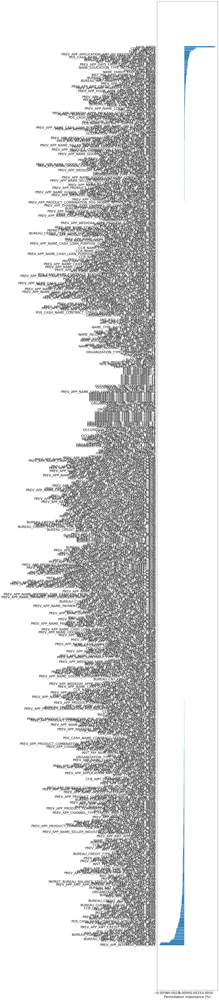

In [199]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test, y_test, figsize=(6, 100))

In [200]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn = \
    pd.DataFrame({'Variables': X_test.columns,
                  'Importance': perm_imp_sklearn.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn.importances_mean)})

In [201]:
# Variables sans zéros importances
fs_perm_imp_sklearn = df_fs_perm_imp_sklearn[df_fs_perm_imp_sklearn[
    'Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn.shape[0]} variables sans zéro importance')

353 variables sans zéro importance


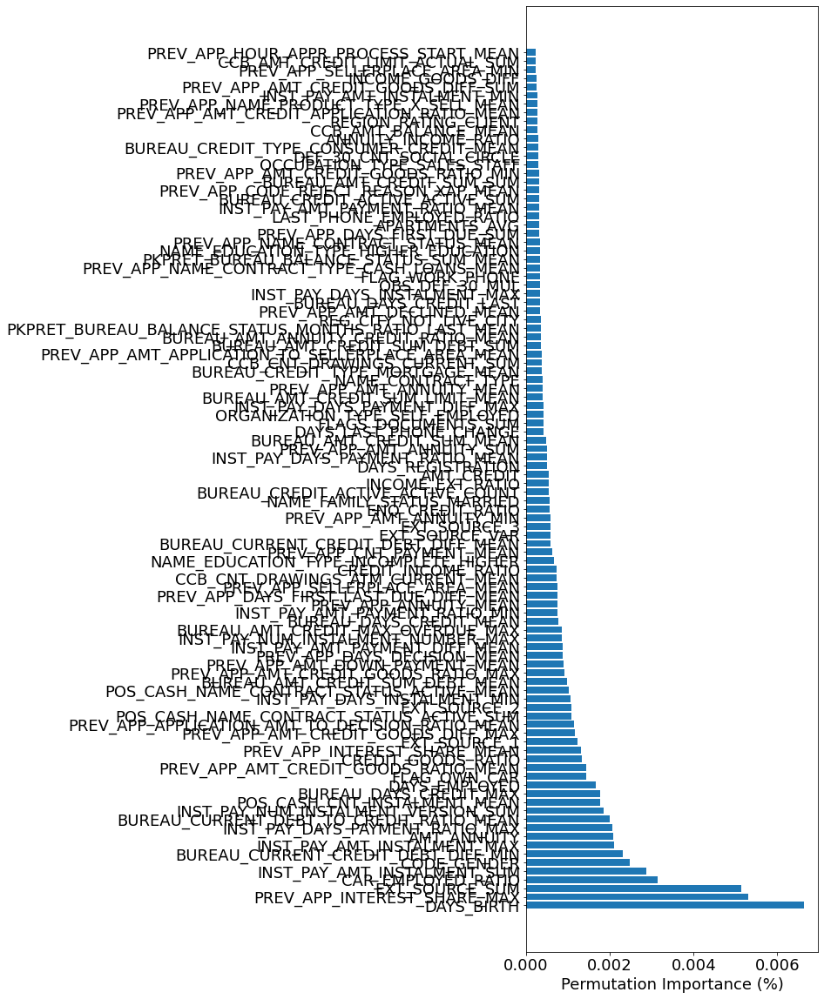

In [202]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot = \
    df_fs_perm_imp_sklearn.sort_values(by='Importance_abs',
                                       ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [203]:
df_fs_perm_imp_sklearn = pd.DataFrame(fs_perm_imp_sklearn['Variables'])
df_fs_perm_imp_sklearn.shape[0]

353

**Sauvegarde**

In [204]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm = \
    'sauvegarde/features-selection/perm_imp_sklearn.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm, 'wb') as f:
    pickle.dump(perm_imp_sklearn, f, pickle.HIGHEST_PROTOCOL)

In [205]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm = \
    'sauvegarde/features-selection/fs_perm_imp_sklearn.pickle'
with open(fic_sav_fs_perm_imp_sklearn_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [206]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sklearn = \
    'sauvegarde/features-selection/fs_perm_imp_sklearn.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn, 'rb') as df_fs_perm_imp_sklearn:
    df_fs_perm_imp_sklearn = pickle.load(df_fs_perm_imp_sklearn)
df_fs_perm_imp_sklearn.shape

(353, 1)

In [207]:
# Sauvegarde du nombre de features importance
df_fs_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sklearn,
                                df_fs_train_set,
                                'train_set',
                                'permutation-importance-LightGbm')

train_set - permutation-importance-LightGbm : 353 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [208]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm, X_test,
                                                          y_test)

Weight,Feature
0.0070 ± 0.0004,DAYS_BIRTH
0.0026 ± 0.0008,CODE_GENDER
0.0020 ± 0.0010,AMT_ANNUITY
0.0016 ± 0.0007,FLAG_OWN_CAR
0.0013 ± 0.0005,EXT_SOURCE_1
0.0012 ± 0.0002,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN
0.0011 ± 0.0004,INST_PAY_DAYS_INSTALMENT_MIN
0.0010 ± 0.0005,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN
0.0008 ± 0.0001,INST_PAY_AMT_PAYMENT_RATIO_MIN
0.0008 ± 0.0006,NAME_FAMILY_STATUS_MARRIED


In [209]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5 = \
    pd.DataFrame({'Variables': X_test.columns,
                  'Importance': perm_imp_eli5.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5.feature_importances_)})

In [210]:
# Variables sans zéros importances
fs_perm_imp_eli5 = df_fs_perm_imp_eli5[df_fs_perm_imp_eli5[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5.shape[0]} variables sans zéro importance')

353 variables sans zéro importance


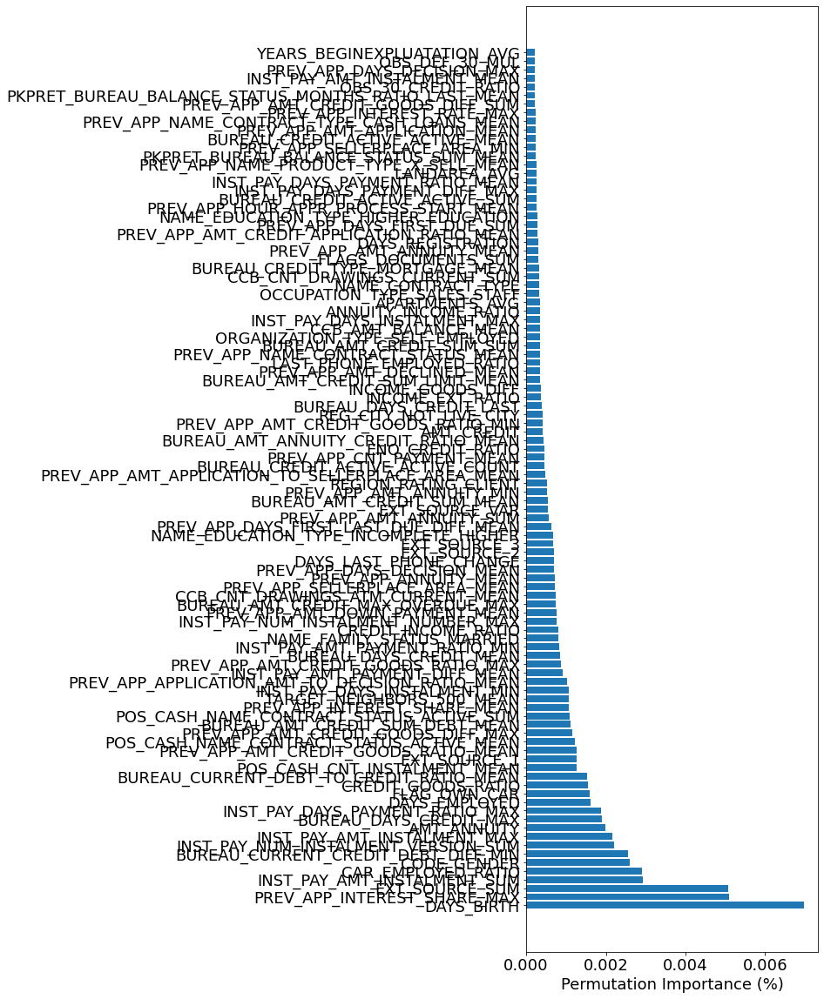

In [211]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot = \
    df_fs_perm_imp_eli5.sort_values(by='Importance_abs',
                                    ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot['Variables'].head(100),
         df_fs_perm_imp_eli5_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [212]:
df_fs_perm_imp_eli5 = pd.DataFrame(fs_perm_imp_eli5['Variables'])
df_fs_perm_imp_eli5.shape[0]

353

**Sauvegarde**

In [213]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm = \
    'sauvegarde/features-selection/fs_perm_imp_eli5.pickle'
with open(fic_sav_fs_perm_imp_eli5_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [214]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_eli5 = \
    'sauvegarde/features-selection/fs_perm_imp_eli5.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5, 'rb') as df_fs_perm_imp_eli5:
    df_fs_perm_imp_eli5 = pickle.load(df_fs_perm_imp_eli5)
df_fs_perm_imp_eli5.shape

(353, 1)

In [215]:
# Sauvegarde du nombre de features importance
df_fs_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_eli5,
                                df_fs_train_set,
                                'train_set',
                                'permutation-importance-eli5')

train_set - permutation-importance-eli5 : 353 variables importantes conservées


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [216]:
# Dataframes de travail
train_sans_fs_perm = train_set.copy()
train_sans_fs_perm = \
    train_sans_fs_perm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_sans_fs_perm : {train_sans_fs_perm.shape}')

train_sans_fs_perm : (307507, 614)


In [217]:
# Sauvegarde des étiquettes
train_sans_fs_perm_labels = train_sans_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_perm = train_sans_fs_perm.drop(columns=['SK_ID_CURR'])
train_sans_fs_perm = train_sans_fs_perm.drop(columns=['TARGET'])

print(f'train_sans_fs_perm : {train_sans_fs_perm.shape}')

train_sans_fs_perm : (307507, 612)


In [218]:
# Initialisation des variables
X = train_sans_fs_perm
y = train_sans_fs_perm_labels

In [219]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [220]:
# Split en jeux d'entraînement et de validation
X_train_sans, X_test_sans, y_train_sans, y_test_sans = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train_sans, y_train_sans,
         early_stopping_rounds=100,
         eval_set=[(X_test_sans, y_test_sans)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.786786	valid_0's binary_logloss: 0.50574


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

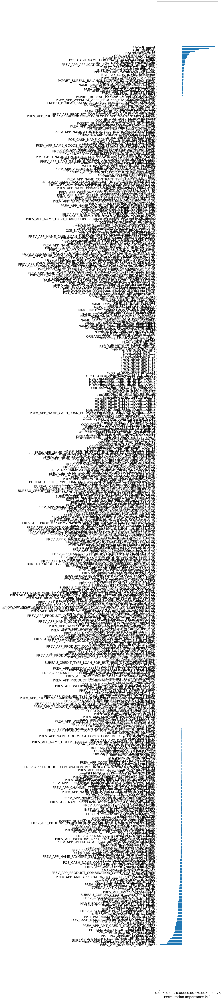

In [221]:
# Feature importance par permutation importance avec sklearn
perm_imp_sans_sklearn = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test_sans, y_test_sans,
                                 figsize=(6, 100))

In [222]:
# Constitution du dataframe de travail
df_fs_perm_imp_sans_sklearn = \
    pd.DataFrame({'Variables': X_test_sans.columns,
                  'Importance': perm_imp_sans_sklearn.importances_mean,
                  'Importance_abs':
                      np.abs(perm_imp_sans_sklearn.importances_mean)})

In [223]:
# Variables sans zéros importances
fs_perm_imp_sans_sklearn = df_fs_perm_imp_sans_sklearn[
    df_fs_perm_imp_sans_sklearn['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sans_sklearn.shape[0]} variables sans zéro importance')

317 variables sans zéro importance


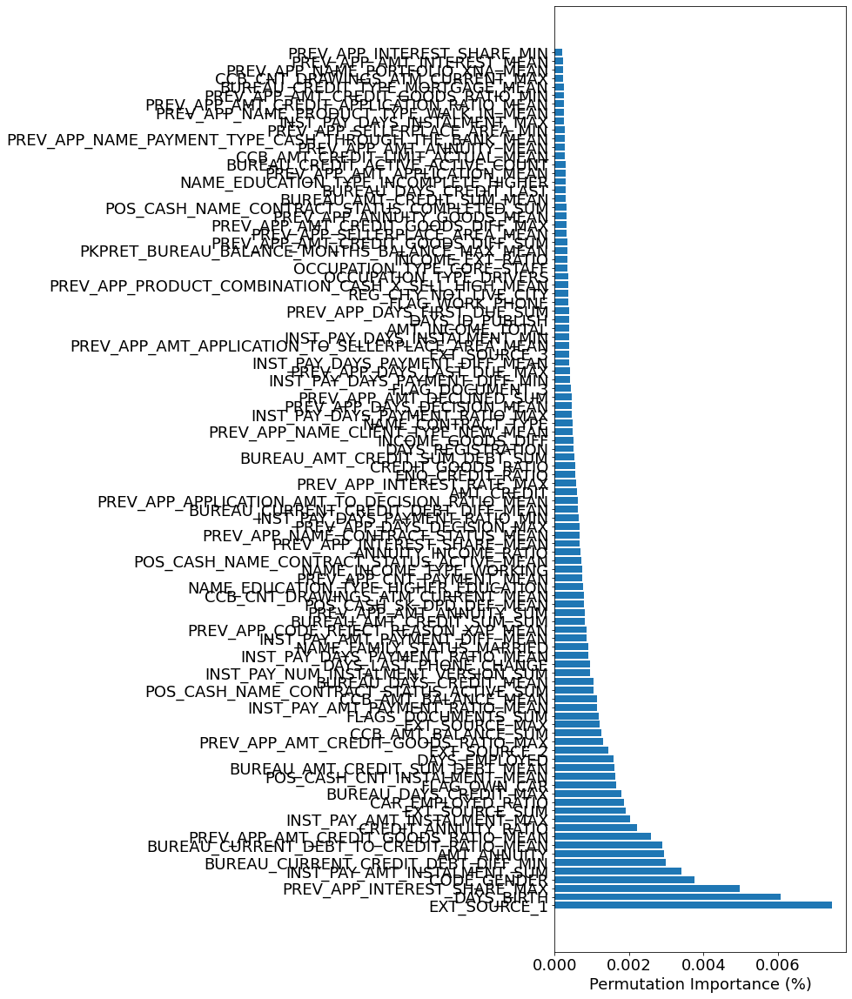

In [224]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sans_sklearn_plot = \
    df_fs_perm_imp_sans_sklearn.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sans_sklearn_plot['Variables'].head(100),
         df_fs_perm_imp_sans_sklearn_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [225]:
df_fs_perm_imp_sans_sklearn = \
    pd.DataFrame(fs_perm_imp_sans_sklearn['Variables'])
df_fs_perm_imp_sans_sklearn.shape[0]

317

**Sauvegarde**

In [226]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sans_sklearn_lgbm = \
    'sauvegarde/features-selection/perm_imp_sans_sklearn.pickle'
with open(fic_sav_perm_imp_sans_sklearn_lgbm, 'wb') as f:
    pickle.dump(perm_imp_sans_sklearn, f, pickle.HIGHEST_PROTOCOL)

In [227]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sans_sklearn_lgbm = \
    'sauvegarde/features-selection/fs_perm_imp_sans_sklearn.pickle'
with open(fic_sav_fs_perm_imp_sans_sklearn_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sans_sklearn, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [228]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sans_sklearn = \
    'sauvegarde/features-selection/fs_perm_imp_sans_sklearn.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sans_sklearn, 'rb') as df_fs_perm_imp_ss_sklearn:
    df_fs_perm_imp_sans_sklearn = pickle.load(df_fs_perm_imp_ss_sklearn)
df_fs_perm_imp_sans_sklearn.shape

(317, 1)

In [229]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sans_sklearn,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'permutation-importance-LightGbm')

train_sans_set - permutation-importance-LightGbm : 317 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [230]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_sans_eli5 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm,
                                                          X_test_sans,
                                                          y_test_sans)

Weight,Feature
0.0073 ± 0.0010,EXT_SOURCE_1
0.0062 ± 0.0008,DAYS_BIRTH
0.0039 ± 0.0008,CODE_GENDER
0.0027 ± 0.0008,AMT_ANNUITY
0.0016 ± 0.0005,FLAG_OWN_CAR
0.0013 ± 0.0008,EXT_SOURCE_SUM
0.0012 ± 0.0003,CCB_AMT_BALANCE_MEAN
0.0012 ± 0.0001,CCB_AMT_BALANCE_SUM
0.0010 ± 0.0007,NAME_FAMILY_STATUS_MARRIED
0.0007 ± 0.0005,BUREAU_AMT_CREDIT_SUM_MEAN


In [231]:
# Constitution du dataframe de travail
df_fs_perm_imp_sans_eli5 = \
    pd.DataFrame({'Variables': X_test_sans.columns,
                  'Importance': perm_imp_sans_eli5.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_sans_eli5.feature_importances_)})

In [232]:
# Variables sans zéros importances
df_fs_perm_imp_sans_eli5 = df_fs_perm_imp_sans_eli5[
    df_fs_perm_imp_sans_eli5['Importance_abs'] != 0.0000]
print(f'{df_fs_perm_imp_sans_eli5.shape[0]} variables sans zéro importance')

317 variables sans zéro importance


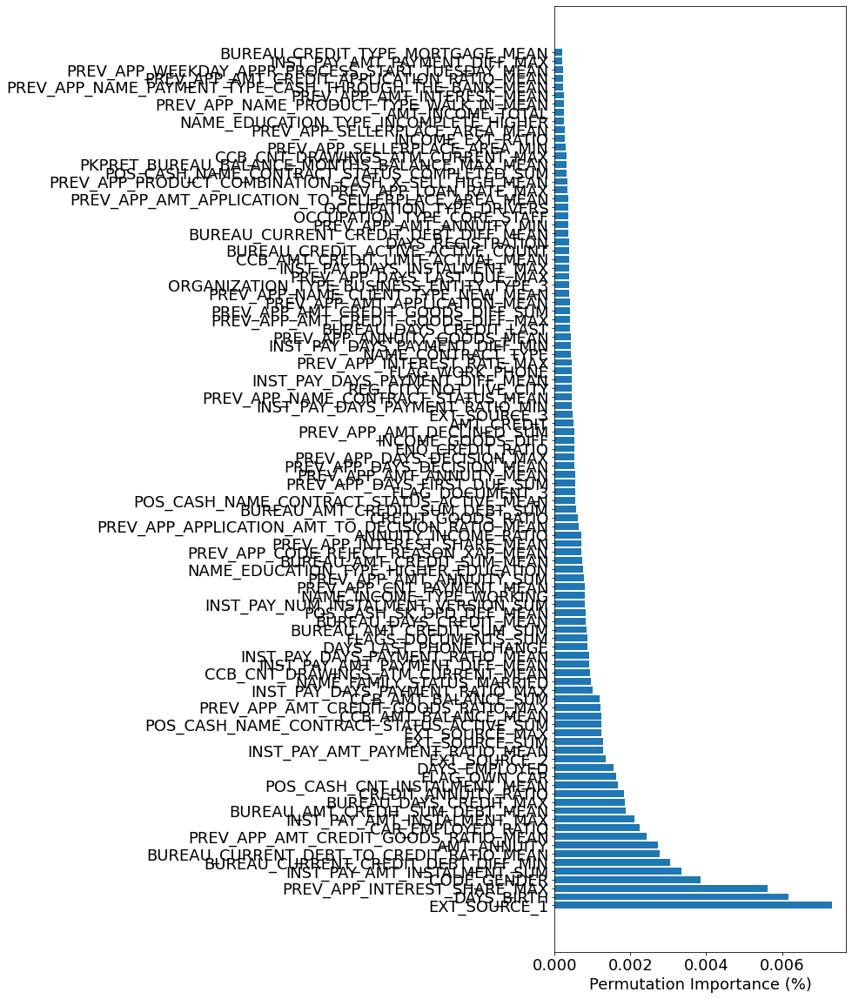

In [233]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sans_eli5_plot = \
    df_fs_perm_imp_sans_eli5.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sans_eli5_plot['Variables'].head(100),
         df_fs_perm_imp_sans_eli5_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [234]:
df_fs_perm_imp_sans_eli5 = pd.DataFrame(df_fs_perm_imp_sans_eli5['Variables'])
df_fs_perm_imp_sans_eli5.shape[0]

317

**Sauvegarde**

In [235]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_sans_eli5_lgbm = \
    'sauvegarde/features-selection/fs_perm_imp_sans_eli5.pickle'
with open(fic_sav_fs_perm_imp_sans_eli5_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sans_eli5, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [236]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_sans_eli5 = \
    'sauvegarde/features-selection/fs_perm_imp_sans_eli5.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sans_eli5, 'rb') as df_fs_perm_imp_sans_eli5:
    df_fs_perm_imp_sans_eli5 = pickle.load(df_fs_perm_imp_sans_eli5)
df_fs_perm_imp_sans_eli5.shape

(317, 1)

In [237]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sans_eli5,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'permutation-importance-eli5')

train_sans_set - permutation-importance-eli5 : 317 variables importantes conservées


**Train_imp1_set/test_imp1_set**</span>

**Préparation du dataframe de travail**

In [238]:
# Dataframes de travail
train_imp1_fs_perm = train_imp1_set.copy()
print(f'train_fs_perm : {train_imp1_fs_perm.shape}')

train_fs_perm : (307507, 622)


In [239]:
# Gestion des valeurs infinies
train_imp1_fs_perm = train_imp1_fs_perm.replace([np.inf, -np.inf], np.nan)
train_imp1_fs_perm = train_imp1_fs_perm.fillna(0)

In [240]:
# Sauvegarde des étiquettes
train_imp1_fs_perm_labels = train_imp1_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp1_fs_perm = train_imp1_fs_perm.drop(columns=['SK_ID_CURR'])
train_imp1_fs_perm = train_imp1_fs_perm.drop(columns=['TARGET'])

print(f'train_imp1_fs_perm : {train_imp1_fs_perm.shape}')

train_imp1_fs_perm : (307507, 620)


In [241]:
# Initialisation des variables
X = train_imp1_fs_perm
y = train_imp1_fs_perm_labels

In [242]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [243]:
# Split en jeux d'entraînement et de validation
X_train_imp1, X_test_imp1, y_train_imp1, y_test_imp1 = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train_imp1, y_train_imp1,
         early_stopping_rounds=100,
         eval_set=[(X_test_imp1, y_test_imp1)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.793508	valid_0's binary_logloss: 0.501544


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

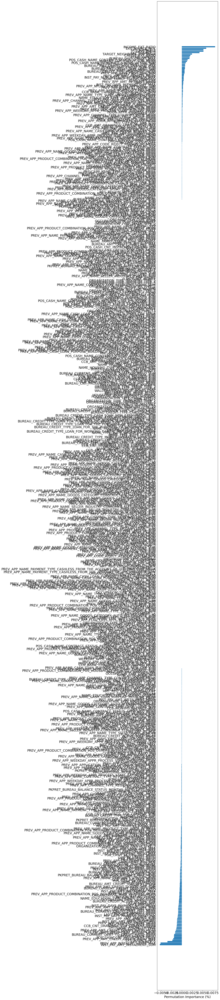

In [244]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn_imp1 = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test_imp1, y_test_imp1,
                                 figsize=(6, 100))

In [245]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn_imp1 = \
    pd.DataFrame({'Variables': X_test_imp1.columns,
                  'Importance': perm_imp_sklearn_imp1.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn_imp1
                                           .importances_mean)})

In [246]:
# Variables sans zéros importances
fs_perm_imp_sklearn_imp1 = df_fs_perm_imp_sklearn_imp1[
    df_fs_perm_imp_sklearn_imp1['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn_imp1.shape[0]} variables sans zéro importance')

381 variables sans zéro importance


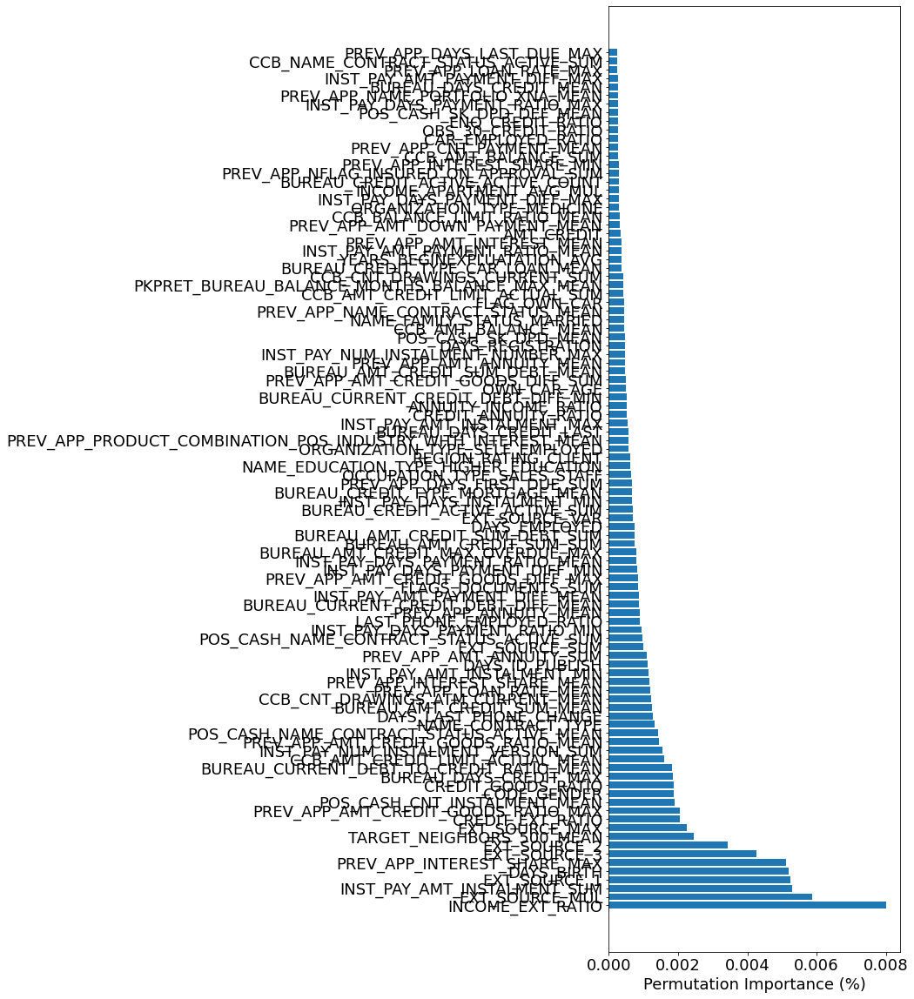

In [247]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot_imp1 = \
    df_fs_perm_imp_sklearn_imp1.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot_imp1['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot_imp1['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [248]:
df_fs_perm_imp_sklearn_imp1 = \
    pd.DataFrame(fs_perm_imp_sklearn_imp1['Variables'])
df_fs_perm_imp_sklearn_imp1.shape[0]

381

**Sauvegarde**

In [249]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm_imp1 = \
    'sauvegarde/features-selection/perm_imp_sklearn_imp1.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm_imp1, 'wb') as f:
    pickle.dump(perm_imp_sklearn_imp1, f, pickle.HIGHEST_PROTOCOL)

In [250]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm_imp1 = \
    'sauvegarde/features-selection/fs_perm_imp_sklearn_imp1.pickle'
with open(fic_sav_fs_perm_imp_sklearn_lgbm_imp1, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn_imp1, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [251]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sklearn_imp1 = \
    'sauvegarde/features-selection/fs_perm_imp_sklearn_imp1.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn_imp1,
          'rb') as df_fs_perm_imp_sklearn_imp1:
    df_fs_perm_imp_sklearn_imp1 = pickle.load(df_fs_perm_imp_sklearn_imp1)
df_fs_perm_imp_sklearn_imp1.shape

(381, 1)

In [252]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sklearn_imp1,
                                df_fs_train_imp1_set,
                                'train_imp1_set',
                                'permutation-importance-LightGbm')

train_imp1_set - permutation-importance-LightGbm : 381 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [253]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5_imp1 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm,
                                                          X_test_imp1,
                                                          y_test_imp1)

Weight,Feature
0.0081 ± 0.0007,INCOME_EXT_RATIO
0.0055 ± 0.0010,DAYS_BIRTH
0.0054 ± 0.0005,EXT_SOURCE_MUL
0.0049 ± 0.0006,EXT_SOURCE_1
0.0042 ± 0.0007,EXT_SOURCE_3
0.0030 ± 0.0008,TARGET_NEIGHBORS_500_MEAN
0.0020 ± 0.0005,CREDIT_EXT_RATIO
0.0017 ± 0.0008,BUREAU_DAYS_CREDIT_MAX
0.0015 ± 0.0004,CODE_GENDER
0.0015 ± 0.0005,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN


In [254]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5_imp1 = \
    pd.DataFrame({'Variables': X_test_imp1.columns,
                  'Importance': perm_imp_eli5_imp1.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5_imp1.feature_importances_)})

In [255]:
# Variables sans zéros importances
fs_perm_imp_eli5_imp1 = df_fs_perm_imp_eli5_imp1[df_fs_perm_imp_eli5_imp1[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5_imp1.shape[0]} variables sans zéro importance')

383 variables sans zéro importance


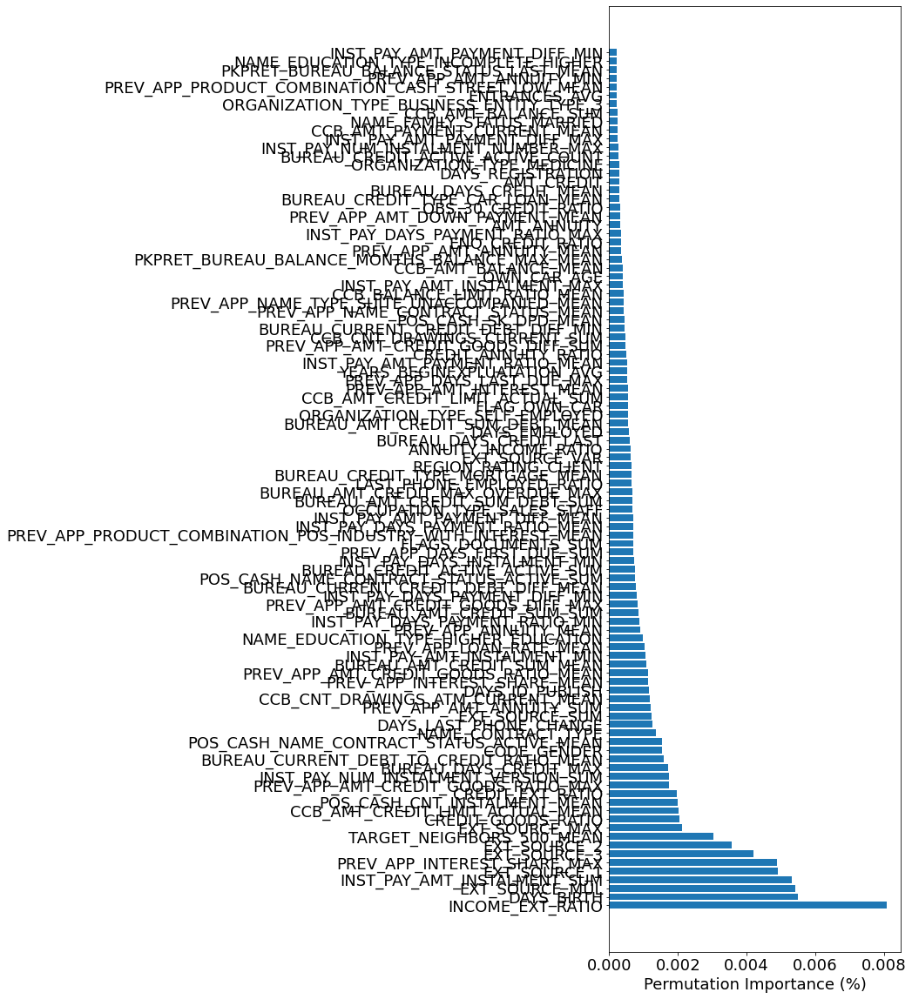

In [256]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot_imp1 = \
    df_fs_perm_imp_eli5_imp1.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot_imp1['Variables'].head(100),
         df_fs_perm_imp_eli5_plot_imp1['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [257]:
df_fs_perm_imp_eli5_imp1 = \
    pd.DataFrame(fs_perm_imp_eli5_imp1['Variables'])
df_fs_perm_imp_eli5_imp1.shape[0]

383

**Sauvegarde**

In [258]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm_imp1 = \
    'sauvegarde/features-selection/fs_perm_imp_eli5_imp1.pickle'
with open(fic_sav_fs_perm_imp_eli5_lgbm_imp1, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5_imp1, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [259]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_eli5_imp1 = \
    'sauvegarde/features-selection/fs_perm_imp_eli5_imp1.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5_imp1, 'rb') as df_fs_perm_imp_eli5_imp1:
    df_fs_perm_imp_eli5_imp1 = pickle.load(df_fs_perm_imp_eli5_imp1)
df_fs_perm_imp_eli5_imp1.shape

(383, 1)

In [260]:
# Sauvegarde du nombre de features importance
df_fs_train_imp1_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_eli5_imp1,
                                df_fs_train_imp1_set,
                                'train_imp1_set',
                                'permutation-importance-eli5')

train_imp1_set - permutation-importance-eli5 : 383 variables importantes conservées


**Train_imp2_set/test_imp2_set**</span>

**Préparation du dataframe de travail**

In [261]:
# Dataframes de travail
train_imp2_fs_perm = train_imp2_set.copy()
print(f'train_imp2_fs_perm : {train_imp2_fs_perm.shape}')

train_imp2_fs_perm : (307507, 617)


In [262]:
# Sauvegarde des étiquettes
train_imp2_fs_perm_labels = train_imp2_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_imp2_fs_perm = train_imp2_fs_perm.drop(columns=['SK_ID_CURR'])
train_imp2_fs_perm = train_imp2_fs_perm.drop(columns=['TARGET'])

print(f'train_imp2_fs_perm : {train_imp2_fs_perm.shape}')

train_imp2_fs_perm : (307507, 615)


In [263]:
# Initialisation des variables
X = train_imp2_fs_perm
y = train_imp2_fs_perm_labels

In [264]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [265]:
# Split en jeux d'entraînement et de validation
X_train_imp2, X_test_imp2, y_train_imp2, y_test_imp2 = \
    train_test_split(X, y, test_size=0.25, random_state=21)

# Entraînement en utilisant early stopping
lgbm.fit(X_train_imp2, y_train_imp2,
         early_stopping_rounds=100,
         eval_set=[(X_test_imp2, y_test_imp2)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.795018	valid_0's binary_logloss: 0.50094


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

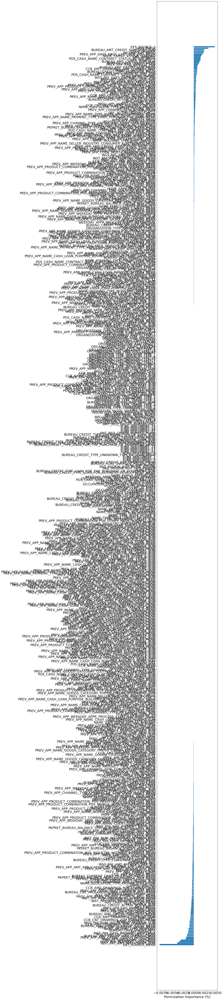

In [266]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn_imp2 = outils_preprocessing \
    .plot_permutation_importance(lgbm, X_test_imp2, y_test_imp2,
                                 figsize=(6, 100))

In [267]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn_imp2 = \
    pd.DataFrame({'Variables': X_test_imp2.columns,
                  'Importance': perm_imp_sklearn_imp2.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn_imp2
                                           .importances_mean)})

In [268]:
# Variables sans zéros importances
fs_perm_imp_sklearn_imp2 = df_fs_perm_imp_sklearn_imp2[
    df_fs_perm_imp_sklearn_imp2['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn_imp2.shape[0]} variables sans zéro importance')

392 variables sans zéro importance


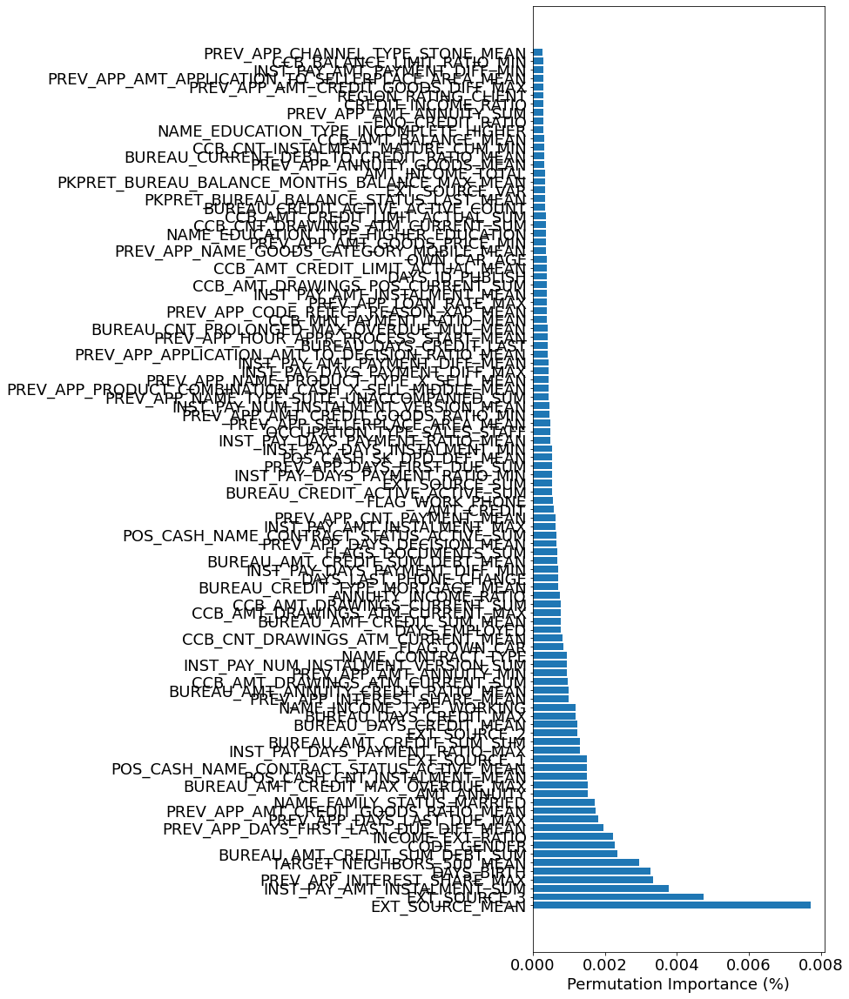

In [269]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot_imp2 = \
    df_fs_perm_imp_sklearn_imp2.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot_imp2['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot_imp2['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [270]:
df_fs_perm_imp_sklearn_imp2 = \
    pd.DataFrame(fs_perm_imp_sklearn_imp2['Variables'])
df_fs_perm_imp_sklearn_imp2.shape[0]

392

**Sauvegarde**

In [271]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm_imp2 = \
    'sauvegarde/features-selection/perm_imp_sklearn_imp2.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm_imp2, 'wb') as f:
    pickle.dump(perm_imp_sklearn_imp2, f, pickle.HIGHEST_PROTOCOL)

In [272]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm_imp2 = \
    'sauvegarde/features-selection/fs_perm_imp_sklearn_imp2.pickle'
with open(fic_sav_fs_perm_imp_sklearn_lgbm_imp2, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn_imp2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [273]:
# Chargement des features importance de sklearn perm imp
fic_sav_fs_perm_imp_sklearn_imp2 = \
    'sauvegarde/features-selection/fs_perm_imp_sklearn_imp2.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn_imp2, 'rb') as df_fs_permimpsklearn_imp2:
    df_fs_perm_imp_sklearn_imp2 = pickle.load(df_fs_permimpsklearn_imp2)
df_fs_perm_imp_sklearn_imp2.shape

(392, 1)

In [274]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_sklearn_imp2,
                                df_fs_train_imp2_set,
                                'train_imp2_set',
                                'permutation-importance-LightGbm')

train_imp2_set - permutation-importance-LightGbm : 392 variables importantes conservées


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [275]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5_imp2 = \
    outils_preprocessing.plot_permutation_importance_eli5(lgbm,
                                                          X_test_imp2,
                                                          y_test_imp2)

Weight,Feature
0.0045 ± 0.0006,EXT_SOURCE_3
0.0036 ± 0.0005,DAYS_BIRTH
0.0024 ± 0.0009,CODE_GENDER
0.0023 ± 0.0001,INCOME_EXT_RATIO
0.0023 ± 0.0004,BUREAU_AMT_CREDIT_SUM_DEBT_SUM
0.0019 ± 0.0004,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN
0.0017 ± 0.0009,EXT_SOURCE_1
0.0017 ± 0.0006,NAME_FAMILY_STATUS_MARRIED
0.0016 ± 0.0002,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN
0.0014 ± 0.0002,AMT_ANNUITY


In [276]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5_imp2 = \
    pd.DataFrame({'Variables': X_test_imp2.columns,
                  'Importance': perm_imp_eli5_imp2.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5_imp2.feature_importances_)})

In [277]:
# Variables sans zéros importances
fs_perm_imp_eli5_imp2 = df_fs_perm_imp_eli5_imp2[df_fs_perm_imp_eli5_imp2[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5_imp2.shape[0]} variables sans zéro importance')

392 variables sans zéro importance


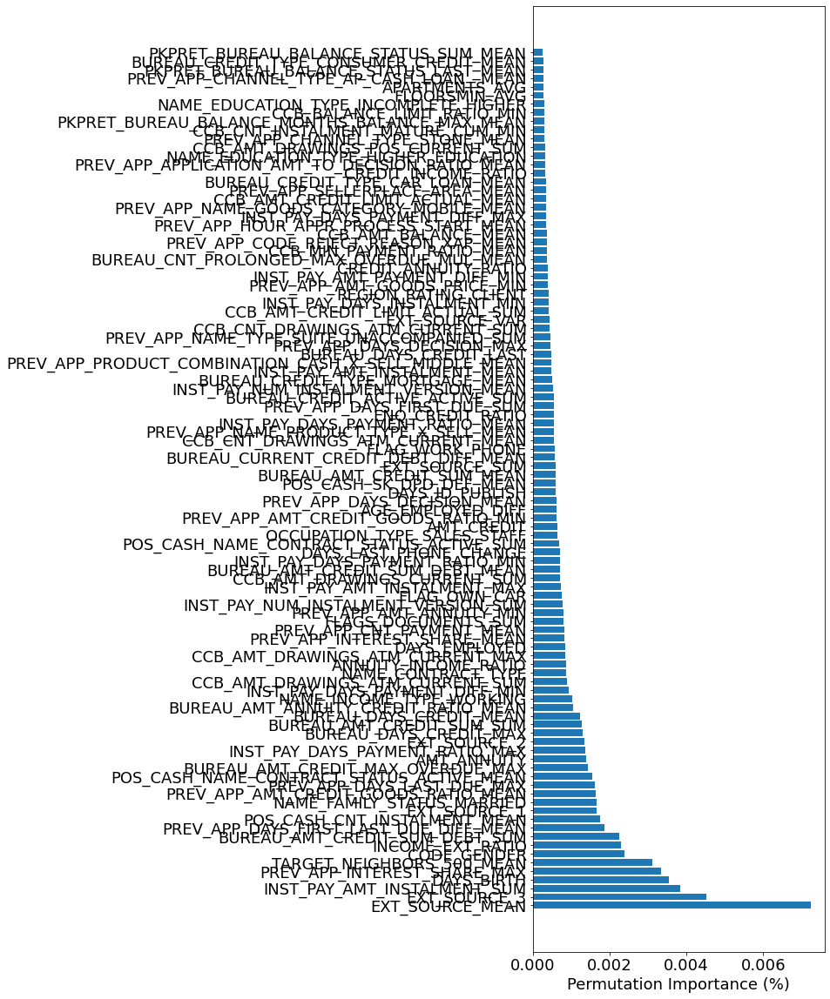

In [278]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot_imp2 = \
    df_fs_perm_imp_eli5_imp2.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot_imp2['Variables'].head(100),
         df_fs_perm_imp_eli5_plot_imp2['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [279]:
df_fs_perm_imp_eli5_imp2 = \
    pd.DataFrame(fs_perm_imp_eli5_imp2['Variables'])
df_fs_perm_imp_eli5_imp2.shape[0]

392

**Sauvegarde**

In [280]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm_imp2 = \
    'sauvegarde/features-selection/fs_perm_imp_eli5_imp2.pickle'
with open(fic_sav_fs_perm_imp_eli5_lgbm_imp2, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5_imp2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [281]:
# Chargement des features importance de eli5
fic_sav_fs_perm_imp_eli5_imp2 = \
    'sauvegarde/features-selection/fs_perm_imp_eli5_imp2.pickle'
# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5_imp2, 'rb') as df_fs_perm_imp_eli5_imp2:
    df_fs_perm_imp_eli5_imp2 = pickle.load(df_fs_perm_imp_eli5_imp2)
df_fs_perm_imp_eli5_imp2.shape

(392, 1)

In [282]:
# Sauvegarde du nombre de features importance
df_fs_train_imp2_set = outils_preprocessing \
    .tracer_features_importance(df_fs_perm_imp_eli5_imp2,
                                df_fs_train_imp2_set,
                                'train_imp2_set',
                                'permutation-importance-eli5')

train_imp2_set - permutation-importance-eli5 : 392 variables importantes conservées


### 3.5. Features selection : RFECV</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

In [283]:
# Estimateur de RFECV
estimator = lgb.LGBMClassifier(random_state=21)

In [288]:
y_train

198627    0
218390    1
171690    0
292536    0
256658    0
         ..
63856     0
81968     0
140036    0
202552    1
80841     0
Name: TARGET, Length: 230630, dtype: int8


Le nombre optimal de variables est : 214

Les variables sélectionnées sont:
['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_WORK_PHONE',
 'REGION_RATING_CLIENT',
 'HOUR_APPR_PROCESS_START',
 'REG_CITY_NOT_LIVE_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'LANDAREA_AVG',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_8',
 'CREDIT_INCOME_RATIO',
 'CREDIT_ANNUITY_RATIO',
 'ANNUITY_INCOME_RATIO',
 'CREDIT_GOODS_RATIO',
 'INCOME_GOODS_DIFF',
 'INCOME_EXT_RATIO',
 'LAST_PHONE_EMPLOYED_RATIO',
 'CAR_EMPLOYED_RATIO',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_VAR',
 'OBS_DEF_30_MUL',
 'OBS_30_CREDIT_RATIO',
 'FLAGS_DOCUMENTS_SUM',
 'EN

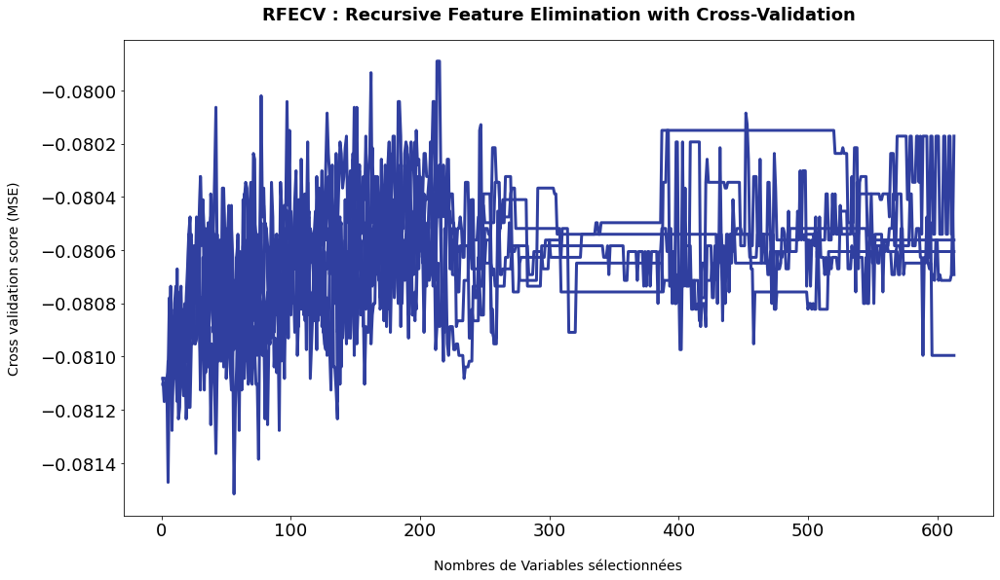


Les variables non indispensables :

Index(['FLAG_OWN_REALTY', 'CNT_CHILDREN', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_WORK_CITY',
       ...
       'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_SUM', 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_MEAN', 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_SUM', 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_MEAN', 'BUREAU_CREDIT_DAY_OVERDUE_MEAN', 'BUREAU_CREDIT_DAY_OVERDUE_MAX', 'BUREAU_CNT_CREDIT_PROLONG_MAX',
       'BUREAU_FLAG_OVERDUE_RECENT_SUM', 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM', 'BUREAU_CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN'],
      dtype='object', length=399)


ValueError: Length of values (214) does not match length of index (613)

In [284]:
fs_rfecv_train_set = \
    outils_preprocessing.calcul_plot_rfecv(estimator, X_train, y_train,
                                           figsize=(8, 50))

In [ ]:
fs_rfecv = ['
            TS_SUM',
            'ENQ_CREDIT_RATIO',
            'TARGET_NEIGHBORS_500_MEAN',
            'NAME_INCOME_TYPE_WORKING',
            'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
            'NAME_EDUCATION_TYPE_INCOMPLETE_HIGHER',
            'NAME_FAMILY_STATUS_MARRIED',
            'OCCUPATION_TYPE_CORE_STAFF',
            'OCCUPATION_TYPE_DRIVERS',
            'OCCUPATION_TYPE_SALES_STAFF',
            'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_3',
            'ORGANIZATION_TYPE_CONSTRUCTION',
            'ORGANIZATION_TYPE_MILITARY',
            'ORGANIZATION_TYPE_SELF_EMPLOYED',
            'ORGANIZATION_TYPE_TRANSPORT_TYPE_3',
            'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
            'CCB_AMT_BALANCE_MEAN',
            'CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM',
            'CCB_AMT_DRAWINGS_OTHER_CURRENT_SUM',
            'CCB_AMT_DRAWINGS_POS_CURRENT_SUM',
            'CCB_AMT_PAYMENT_CURRENT_MEAN',
            'CCB_AMT_PAYMENT_CURRENT_MAX',
            'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
            'CCB_CNT_DRAWINGS_CURRENT_SUM',
            'CCB_SK_DPD_SUM',
            'CCB_BALANCE_LIMIT_RATIO_MEAN',
            'CCB_BALANCE_LIMIT_RATIO_MIN',
            'CCB_CNT_DRAWING_SUM_MAX',
            'CCB_MIN_PAYMENT_RATIO_MEAN',
            'CCB_PAYMENT_MIN_DIFF_MIN',
            'CCB_AMT_INTEREST_RECEIVABLE_MIN',
            'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
            'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
            'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
            'INST_PAY_DAYS_INSTALMENT_MAX',
            'INST_PAY_DAYS_INSTALMENT_MIN',
            'INST_PAY_AMT_INSTALMENT_MEAN',
            'INST_PAY_AMT_INSTALMENT_SUM',
            'INST_PAY_AMT_INSTALMENT_MIN',
            'INST_PAY_AMT_INSTALMENT_MAX',
            'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
            'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
            'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
            'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
            'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
            'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
            'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
            'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
            'INST_PAY_AMT_PAYMENT_DIFF_MAX',
            'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
            'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
            'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_MEAN',
            'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_MEAN',
            'POS_CASH_CNT_INSTALMENT_MEAN',
            'POS_CASH_CNT_INSTALMENT_MIN',
            'POS_CASH_CNT_INSTALMENT_FUTURE_MIN',
            'POS_CASH_SK_DPD_MEAN',
            'POS_CASH_SK_DPD_DEF_MEAN',
            'POS_CASH_TOTAL_TERM_LAST',
            'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
            'PREV_APP_NAME_PAYMENT_TYPE_CASH_THROUGH_THE_BANK_MEAN',
            'PREV_APP_CODE_REJECT_REASON_HC_MEAN',
            'PREV_APP_CODE_REJECT_REASON_LIMIT_MEAN',
            'PREV_APP_CODE_REJECT_REASON_SCOFR_MEAN',
            'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_OTHER_A_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_OTHER_B_SUM',
            'PREV_APP_NAME_TYPE_SUITE_SPOUSE_PARTNER_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_MEAN',
            'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_MEAN',
            'PREV_APP_NAME_PORTFOLIO_XNA_MEAN',
            'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_MEAN',
            'PREV_APP_NAME_PRODUCT_TYPE_X_SELL_MEAN',
            'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__MEAN',
            'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_SUM',
            'PREV_APP_CHANNEL_TYPE_CREDIT_AND_CASH_OFFICES_MEAN',
            'PREV_APP_CHANNEL_TYPE_STONE_MEAN',
            'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_SUM',
            'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITH_INTEREST_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITHOUT_INTEREST_MEAN',
            'PREV_APP_AMT_ANNUITY_MEAN',
            'PREV_APP_AMT_ANNUITY_SUM',
            'PREV_APP_AMT_ANNUITY_MIN',
            'PREV_APP_AMT_APPLICATION_MEAN',
            'PREV_APP_AMT_APPLICATION_MIN',
            'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
            'PREV_APP_AMT_GOODS_PRICE_MIN',
            'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
            'PREV_APP_RATE_DOWN_PAYMENT_MEAN',
            'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
            'PREV_APP_DAYS_DECISION_MEAN',
            'PREV_APP_DAYS_DECISION_MAX',
            'PREV_APP_SELLERPLACE_AREA_MEAN',
            'PREV_APP_CNT_PAYMENT_MEAN',
            'PREV_APP_NAME_YIELD_GROUP_MEAN',
            'PREV_APP_DAYS_FIRST_DUE_SUM',
            'PREV_APP_DAYS_LAST_DUE_MAX',
            'PREV_APP_AMT_DECLINED_SUM',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
            'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN',
            'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
            'PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN',
            'PREV_APP_ANNUITY_MEAN',
            'PREV_APP_ANNUITY_GOODS_MEAN',
            'PREV_APP_LOAN_RATE_MAX',
            'PREV_APP_LOAN_RATE_MEAN',
            'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
            'PREV_APP_AMT_INTEREST_MEAN',
            'PREV_APP_INTEREST_SHARE_MEAN',
            'PREV_APP_INTEREST_SHARE_MAX',
            'PREV_APP_INTEREST_SHARE_MIN',
            'PREV_APP_INTEREST_RATE_MAX',
            'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
            'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
            'BUREAU_CREDIT_ACTIVE_SOLD_MEAN',
            'BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN',
            'BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN',
            'BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM',
            'BUREAU_CREDIT_TYPE_MICROLOAN_SUM',
            'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
            'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
            'BUREAU_DAYS_CREDIT_MEAN',
            'BUREAU_DAYS_CREDIT_MAX',
            'BUREAU_DAYS_CREDIT_LAST',
            'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
            'BUREAU_AMT_CREDIT_SUM_MEAN',
            'BUREAU_AMT_CREDIT_SUM_SUM',
            'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
            'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
            'BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN',
            'BUREAU_AMT_CREDIT_SUM_LIMIT_MAX',
            'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
            'BUREAU_AMT_CREDIT_SUM_OVERDUE_MAX',
            'BUREAU_AMT_ANNUITY_SUM',
            'BUREAU_AMT_ANNUITY_COUNT',
            'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
            'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN',
            'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
            'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
            'BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN']

In [ ]:
df_fs_rfecv = pd.DataFrame(fs_rfecv)
df_fs_rfecv.shape[0]

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec RFECV
fic_sav_fs_rfecv = \
    'sauvegarde/features-selection/fs_rfecv.pickle'
with open(fic_sav_fs_rfecv, 'wb') as f:
    pickle.dump(df_fs_rfecv, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [ ]:
# Chargement des features importance de RFECV
fic_sav_fs_rfecv = \
    'sauvegarde/features-selection/fs_rfecv.pickle'
# Chargement des features importance
with open(fic_sav_fs_rfecv, 'rb') as df_fs_rfecv:
    df_fs_rfecv = pickle.load(df_fs_rfecv)
df_fs_rfecv.shape

In [ ]:
# Sauvegarde du nombre de features importance
df_fs_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_rfecv,
                                df_fs_train_set,
                                'train_set',
                                'RFECV')

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

In [ ]:
# Estimateur de RFECV
estimator_sans = lgb.LGBMClassifier(random_state=21)

In [ ]:
fs_rfecv_sans_train_set = \
    outils_preprocessing.calcul_plot_rfecv(estimator_sans,
                                           X_train_sans,
                                           y_train_sans,
                                           figsize=(8, 50))

In [ ]:
fs_rfecv_sans = [
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'NONLIVINGAREA_AVG',
 'EMERGENCYSTATE_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_21',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'CREDIT_INCOME_RATIO',
 'CREDIT_ANNUITY_RATIO',
 'ANNUITY_INCOME_RATIO',
 'CREDIT_GOODS_RATIO',
 'INCOME_GOODS_DIFF',
 'INCOME_EXT_RATIO',
 'LAST_PHONE_EMPLOYED_RATIO',
 'CAR_EMPLOYED_RATIO',
 'FLAG_CONTACTS_SUM',
 'CNT_NON_CHILDREN',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_VAR',
 'OBS_DEF_30_MUL',
 'OBS_30_CREDIT_RATIO',
 'FLAGS_DOCUMENTS_SUM',
 'ENQ_CREDIT_RATIO',
 'NAME_TYPE_SUITE_CHILDREN',
 'NAME_TYPE_SUITE_OTHER_B',
 'NAME_INCOME_TYPE_BUSINESSMAN',
 'NAME_INCOME_TYPE_STATE_SERVANT',
 'NAME_INCOME_TYPE_WORKING',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'NAME_EDUCATION_TYPE_INCOMPLETE_HIGHER',
 'NAME_FAMILY_STATUS_CIVIL_MARRIAGE',
 'NAME_FAMILY_STATUS_MARRIED',
 'NAME_FAMILY_STATUS_SEPARATED',
 'NAME_FAMILY_STATUS_SINGLE_NOT_MARRIED',
 'NAME_HOUSING_TYPE_HOUSE_APARTMENT',
 'OCCUPATION_TYPE_ACCOUNTANTS',
 'OCCUPATION_TYPE_CLEANING_STAFF',
 'OCCUPATION_TYPE_CORE_STAFF',
 'OCCUPATION_TYPE_DRIVERS',
 'OCCUPATION_TYPE_LOW_SKILL_LABORERS',
 'OCCUPATION_TYPE_MANAGERS',
 'OCCUPATION_TYPE_MEDICINE_STAFF',
 'OCCUPATION_TYPE_SALES_STAFF',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_3',
 'ORGANIZATION_TYPE_CONSTRUCTION',
 'ORGANIZATION_TYPE_CULTURE',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_7',
 'ORGANIZATION_TYPE_KINDERGARTEN',
 'ORGANIZATION_TYPE_MEDICINE',
 'ORGANIZATION_TYPE_MILITARY',
 'ORGANIZATION_TYPE_REALTOR',
 'ORGANIZATION_TYPE_SCHOOL',
 'ORGANIZATION_TYPE_SELF_EMPLOYED',
 'ORGANIZATION_TYPE_TRADE_TYPE_3',
 'ORGANIZATION_TYPE_TRANSPORT_TYPE_3',
 'HOUSETYPE_MODE_SPECIFIC_HOUSING',
 'WALLSMATERIAL_MODE_MIXED',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'CCB_AMT_BALANCE_SUM',
 'CCB_AMT_BALANCE_MEAN',
 'CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM',
 'CCB_AMT_CREDIT_LIMIT_ACTUAL_MEAN',
 'CCB_AMT_DRAWINGS_ATM_CURRENT_SUM',
 'CCB_AMT_DRAWINGS_ATM_CURRENT_MAX',
 'CCB_AMT_DRAWINGS_POS_CURRENT_SUM',
 'CCB_AMT_INST_MIN_REGULARITY_MIN',
 'CCB_AMT_PAYMENT_CURRENT_MEAN',
 'CCB_AMT_PAYMENT_CURRENT_MIN',
 'CCB_AMT_PAYMENT_CURRENT_MAX',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MAX',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'CCB_CNT_DRAWINGS_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_MAX',
 'CCB_SK_DPD_SUM',
 'CCB_SK_DPD_DEF_SUM',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MIN',
 'CCB_CNT_DRAWING_SUM_MAX',
 'CCB_MIN_PAYMENT_RATIO_MEAN',
 'CCB_PAYMENT_MIN_DIFF_MIN',
 'CCB_AMT_INTEREST_RECEIVABLE_MIN',
 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'INST_PAY_AMT_INSTALMENT_MEAN',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MIN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MIN',
 'INST_PAY_AMT_PAYMENT_DIFF_MAX',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_APPROVED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_APPROVED_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_COMPLETED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_DEMAND_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_XNA_SUM',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'POS_CASH_CNT_INSTALMENT_MIN',
 'POS_CASH_CNT_INSTALMENT_FUTURE_MIN',
 'POS_CASH_SK_DPD_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'POS_CASH_TOTAL_TERM_LAST',
 'PREV_APP_NAME_CONTRACT_TYPE_CASH_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_CASH_LOANS_MEAN',
 'PREV_APP_NAME_CONTRACT_TYPE_CONSUMER_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_REVOLVING_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_REVOLVING_LOANS_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_TUESDAY_SUM',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_PAYMENTS_ON_OTHER_LOANS_MEAN',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_REPAIRS_MEAN',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_URGENT_NEEDS_MEAN',
 'PREV_APP_NAME_PAYMENT_TYPE_CASH_THROUGH_THE_BANK_MEAN',
 'PREV_APP_NAME_PAYMENT_TYPE_XNA_SUM',
 'PREV_APP_CODE_REJECT_REASON_CLIENT_SUM',
 'PREV_APP_CODE_REJECT_REASON_HC_SUM',
 'PREV_APP_CODE_REJECT_REASON_HC_MEAN',
 'PREV_APP_CODE_REJECT_REASON_LIMIT_SUM',
 'PREV_APP_CODE_REJECT_REASON_LIMIT_MEAN',
 'PREV_APP_CODE_REJECT_REASON_SCO_SUM',
 'PREV_APP_CODE_REJECT_REASON_SCO_MEAN',
 'PREV_APP_CODE_REJECT_REASON_SCOFR_MEAN',
 'PREV_APP_CODE_REJECT_REASON_VERIF_SUM',
 'PREV_APP_CODE_REJECT_REASON_VERIF_MEAN',
 'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_CHILDREN_SUM',
 'PREV_APP_NAME_TYPE_SUITE_FAMILY_SUM',
 'PREV_APP_NAME_TYPE_SUITE_FAMILY_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_GROUP_OF_PEOPLE_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_B_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_B_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_SPOUSE_PARTNER_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_SUM',
 'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_NEW_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_SUM',
 'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_XNA_SUM',
 'PREV_APP_NAME_CLIENT_TYPE_XNA_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_ADDITIONAL_SERVICE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_ADDITIONAL_SERVICE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_ANIMALS_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_AUTO_ACCESSORIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CLOTHING_AND_ACCESSORIES_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_CLOTHING_AND_ACCESSORIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_COMPUTERS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSTRUCTION_MATERIALS_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSTRUCTION_MATERIALS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICAL_SUPPLIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICINE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_OTHER_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_PHOTO_CINEMA_EQUIPMENT_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_PHOTO_CINEMA_EQUIPMENT_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_SPORT_AND_LEISURE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_TOURISM_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_VEHICLES_MEAN',
 'PREV_APP_NAME_PORTFOLIO_XNA_MEAN',
 'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_SUM',
 'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_MEAN',
 'PREV_APP_NAME_PRODUCT_TYPE_X_SELL_MEAN',
 'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__SUM',
 'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__MEAN',
 'PREV_APP_CHANNEL_TYPE_CHANNEL_OF_CORPORATE_SALES_MEAN',
 'PREV_APP_CHANNEL_TYPE_CONTACT_CENTER_SUM',
 'PREV_APP_CHANNEL_TYPE_CONTACT_CENTER_MEAN',
 'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_SUM',
 'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_MEAN',
 'PREV_APP_CHANNEL_TYPE_CREDIT_AND_CASH_OFFICES_MEAN',
 'PREV_APP_CHANNEL_TYPE_STONE_SUM',
 'PREV_APP_CHANNEL_TYPE_STONE_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_AUTO_TECHNOLOGY_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_SUM',
 'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_INDUSTRY_SUM',
 'PREV_APP_NAME_SELLER_INDUSTRY_INDUSTRY_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_HIGH_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_HIGH_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_MIDDLE_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_MIDDLE_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_MIDDLE_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITH_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_SUM',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITHOUT_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_MOBILE_WITHOUT_INTEREST_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_AMT_ANNUITY_SUM',
 'PREV_APP_AMT_ANNUITY_MIN',
 'PREV_APP_AMT_APPLICATION_MEAN',
 'PREV_APP_AMT_APPLICATION_MIN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_AMT_GOODS_PRICE_MIN',
 'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
 'PREV_APP_FLAG_LAST_APPL_PER_CONTRACT_MEAN',
 'PREV_APP_RATE_DOWN_PAYMENT_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_LAST',
 'PREV_APP_DAYS_DECISION_MEAN',
 'PREV_APP_DAYS_DECISION_MAX',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MIN',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_NAME_YIELD_GROUP_MEAN',
 'PREV_APP_NAME_YIELD_GROUP_LAST',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM',
 'PREV_APP_AMT_DECLINED_MEAN',
 'PREV_APP_AMT_DECLINED_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
 'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN',
 'PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN',
 'PREV_APP_ANNUITY_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'PREV_APP_LOAN_RATE_MAX',
 'PREV_APP_LOAN_RATE_MEAN',
 'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
 'PREV_APP_AMT_INTEREST_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_INTEREST_SHARE_MAX',
 'PREV_APP_INTEREST_SHARE_MIN',
 'PREV_APP_INTEREST_RATE_MAX',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
 'BUREAU_CREDIT_ACTIVE_SOLD_SUM',
 'BUREAU_CREDIT_ACTIVE_SOLD_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN',
 'BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM',
 'BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN',
 'BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM',
 'BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_BUSINESS_DEVELOPMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_PURCHASE_OF_SHARES_MARGIN_LENDING__SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_MEAN',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_MEAN',
 'BUREAU_CREDIT_TYPE_MICROLOAN_SUM',
 'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
 'BUREAU_CREDIT_TYPE_MOBILE_OPERATOR_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_MORTGAGE_SUM',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_MEAN',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'BUREAU_DAYS_CREDIT_MAX',
 'BUREAU_DAYS_CREDIT_LAST',
 'BUREAU_CREDIT_DAY_OVERDUE_MEAN',
 'BUREAU_CREDIT_DAY_OVERDUE_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'BUREAU_CNT_CREDIT_PROLONG_MAX',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_LIMIT_MAX',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MAX',
 'BUREAU_AMT_ANNUITY_SUM',
 'BUREAU_AMT_ANNUITY_COUNT',
 'BUREAU_FLAG_OVERDUE_RECENT_SUM',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM',
 'BUREAU_CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN']

In [ ]:
df_fs_rfecv_sans = pd.DataFrame(fs_rfecv_sans)
df_fs_rfecv_sans.shape[0]

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec RFECV
fic_sav_fs_rfecv_sans = \
    'sauvegarde/features-selection/fs_rfecv_sans.pickle'
with open(fic_sav_fs_rfecv_sans, 'wb') as f:
    pickle.dump(df_fs_rfecv_sans, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [ ]:
# Chargement des features importance de RFECV
fic_sav_fs_rfecv_sans = \
    'sauvegarde/features-selection/fs_rfecv_sans.pickle'
# Chargement des features importance
with open(fic_sav_fs_rfecv_sans, 'rb') as df_fs_rfecv_sans:
    df_fs_rfecv_sans = pickle.load(df_fs_rfecv_sans)
df_fs_rfecv_sans.shape

In [ ]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = outils_preprocessing \
    .tracer_features_importance(df_fs_rfecv_sans,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'RFECV')

### 3.6. Bilan - Jeux de données finaux</span>

**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn ou eli5 et RFECV pour le jeu de données train set sont :
- [x] df_fs_lightgbm,
- [x] df_fs_boruta,
- [x] df_fs_boruta_lgbm,
- [x] df_fs_boruta_lgbm2,
- [x] df_fs_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn,
- [x] df_fs_perm_imp_eli5,
- [x] df_fs_rfecv.

**Répétitions des variables conservées**

In [289]:
# Récupération des variables conservées pour chaque feature selection
liste_var = df_fs_lightgbm['feature'].to_list()
print(len(liste_var))
liste_var.extend(df_fs_boruta[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_boruta_lgbm[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_boruta_lgbm2[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_borshap_lgbm[0].to_list())
print(len(liste_var))
liste_var.extend(df_fs_perm_imp_sklearn['Variables'].to_list())
print(len(liste_var))
liste_var.extend(df_fs_perm_imp_eli5['Variables'].to_list())
print(len(liste_var))
#liste_var.extend(df_fs_rfecv[0].to_list())
#print(len(liste_var))

403
632
737
841
911
1264
1617


In [290]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var = Counter(liste_var)
len(dico_nbre_repet_var)

429

In [291]:

df_nbr_repet_var = pd.DataFrame.from_dict(dico_nbre_repet_var,
                                          orient='index',
                                          columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)

df_nbr_repet_var.style.hide_index()

Variables,Nbr_repetition
TARGET_NEIGHBORS_500_MEAN,7
INST_PAY_AMT_PAYMENT_DIFF_MEAN,7
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM,7
INST_PAY_DAYS_PAYMENT_DIFF_MIN,7
BUREAU_CREDIT_TYPE_MORTGAGE_MEAN,7
DEF_30_CNT_SOCIAL_CIRCLE,7
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN,7
INST_PAY_AMT_PAYMENT_RATIO_MEAN,7
CODE_GENDER,7
CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN,7


In [295]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
outils_data.distribution_variables_plages(df_nbr_repet_var,
                                          'Nbr_repetition',
                                          liste_bins)

Plage,nb_données,%_données
"(0, 1]",66,15.384615
"(1, 2]",33,7.692308
"(2, 3]",109,25.407925
"(3, 4]",111,25.874126
"(4, 5]",13,3.030303
"(5, 6]",30,6.993007
"(6, 7]",67,15.617716
"(7, 8]",0,0.000000


In [299]:
# Les variables présentes plus de 5 fois pour les 8 méthodes de feature
#  sélection seront conservées
var_cons_train_set = \
    df_nbr_repet_var[df_nbr_repet_var['Nbr_repetition'] > 5][
        'Variables'].to_list()
print(f'{len(var_cons_train_set)} variables conservées pour le train_set')
var_cons_train_set

97 variables conservées pour le train_set


['TARGET_NEIGHBORS_500_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'CODE_GENDER',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'EXT_SOURCE_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'REGION_RATING_CLIENT',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'CREDIT_INCOME_RATIO',
 'FLAG_OWN_CAR',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_CN

In [350]:
var_cons_train_set = [
 'TARGET_NEIGHBORS_500_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
 'DAYS_LAST_PHONE_CHANGE',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'EXT_SOURCE_MAX',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'REGION_RATING_CLIENT',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'FLAG_OWN_CAR',
 'NAME_FAMILY_STATUS_MARRIED',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'CODE_GENDER',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'ENQ_CREDIT_RATIO',
 'BUREAU_DAYS_CREDIT_MAX',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'CAR_EMPLOYED_RATIO',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'DAYS_EMPLOYED',
 'EXT_SOURCE_2',
 'DAYS_ID_PUBLISH',
 'PREV_APP_INTEREST_SHARE_MAX',
 'AMT_ANNUITY',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_1',
 'DAYS_BIRTH',
 'AMT_CREDIT',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'EXT_SOURCE_3',
 'ANNUITY_INCOME_RATIO',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'CREDIT_INCOME_RATIO',
 'REGION_POPULATION_RELATIVE',
 'CREDIT_GOODS_RATIO',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
 'CCB_MIN_PAYMENT_RATIO_MEAN',
 'REG_CITY_NOT_LIVE_CITY',
 'PREV_APP_AMT_ANNUITY_SUM',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'ORGANIZATION_TYPE_SELF_EMPLOYED',
 'PREV_APP_AMT_INTEREST_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'CCB_CNT_DRAWINGS_CURRENT_SUM',
 'OWN_CAR_AGE',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
 'FLOORSMAX_AVG',
 'CCB_AMT_BALANCE_MEAN',
 'FLAG_WORK_PHONE',
 'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
 'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
 'DAYS_REGISTRATION',
 'PREV_APP_INTEREST_RATE_MAX',
 'INCOME_GOODS_DIFF',
 'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
 'EXT_SOURCE_VAR',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'INST_PAY_AMT_INSTALMENT_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
 'PREV_APP_LOAN_RATE_MEAN',
 'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
 'CREDIT_ANNUITY_RATIO',
 'INCOME_EXT_RATIO',
 'PREV_APP_DAYS_DECISION_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
 'APARTMENTS_AVG']

In [351]:
# Sauvegarde des variables conservées pour le train_set
fic_sav_var_cons_train_set = \
    'sauvegarde/features-selection/var_cons_train_set.pickle'
with open(fic_sav_var_cons_train_set, 'wb') as f:
    pickle.dump(var_cons_train_set, f, pickle.HIGHEST_PROTOCOL)

In [352]:
# Chargement des variables conservées pour le train_set
fic_sav_var_cons_train_set = \
    'sauvegarde/features-selection/var_cons_train_set.pickle'
with open(fic_sav_var_cons_train_set, 'rb') as df_var_cons_train_set:
    var_cons_train_set = pickle.load(df_var_cons_train_set)
len(var_cons_train_set)

102

**Test en ne conservant que les variables les plus sélectionnées par feature selection**

In [304]:
# Les variables présentes plus de 6 fois pour les 8 méthodes de feature
#  sélection seront conservées
var_cons_train_set_small = \
    df_nbr_repet_var[df_nbr_repet_var['Nbr_repetition'] > 6][
        'Variables'].to_list()
print(f'{len(var_cons_train_set_small)} variables conservées pour le train_set')
var_cons_train_set_small

67 variables conservées pour le train_set


['TARGET_NEIGHBORS_500_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'CODE_GENDER',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'EXT_SOURCE_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'REGION_RATING_CLIENT',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'CREDIT_INCOME_RATIO',
 'FLAG_OWN_CAR',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_CN

In [353]:
var_cons_train_set_small=['TARGET_NEIGHBORS_500_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
 'DAYS_LAST_PHONE_CHANGE',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'EXT_SOURCE_MAX',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'REGION_RATING_CLIENT',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'FLAG_OWN_CAR',
 'NAME_FAMILY_STATUS_MARRIED',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'CODE_GENDER',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'ENQ_CREDIT_RATIO',
 'BUREAU_DAYS_CREDIT_MAX',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'CAR_EMPLOYED_RATIO',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'DAYS_EMPLOYED',
 'EXT_SOURCE_2',
 'DAYS_ID_PUBLISH',
 'PREV_APP_INTEREST_SHARE_MAX',
 'AMT_ANNUITY',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_1',
 'DAYS_BIRTH',
 'AMT_CREDIT',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'EXT_SOURCE_3',
 'ANNUITY_INCOME_RATIO',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'CREDIT_INCOME_RATIO',
 'REGION_POPULATION_RELATIVE',
 'CREDIT_GOODS_RATIO',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'POS_CASH_CNT_INSTALMENT_MEAN']

In [354]:
# Sauvegarde des variables conservées pour le train_set réduit
fic_sav_var_cons_train_set_small = \
    'sauvegarde/features-selection/var_cons_train_set_small.pickle'
with open(fic_sav_var_cons_train_set_small, 'wb') as f:
    pickle.dump(var_cons_train_set_small, f, pickle.HIGHEST_PROTOCOL)

In [355]:
# Chargement des variables conservées pour le train_set réduit
fic_sav_var_cons_train_set_small = \
    'sauvegarde/features-selection/var_cons_train_set_small.pickle'
with open(fic_sav_var_cons_train_set_small, 'rb') as df_var_cons_train_set_small:
    var_cons_train_set_small = pickle.load(df_var_cons_train_set_small)
len(var_cons_train_set_small)

68

**Constitution des dataframes train_set et test_set finaux**

In [356]:
# Constitution du train_set
print(f'{train_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_avec_target_id.extend(var_cons_train_set)
train_set = train_set[var_cons_train_set_avec_target_id]
print(f'{train_set.shape}')

(307507, 99)


KeyError: "['CCB_CNT_DRAWINGS_CURRENT_SUM', 'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM', 'PREV_APP_CODE_REJECT_REASON_XAP_MEAN', 'FLOORSMAX_AVG', 'CCB_AMT_BALANCE_MEAN', 'INST_PAY_NUM_INSTALMENT_NUMBER_MAX', 'INCOME_EXT_RATIO', 'APARTMENTS_AVG'] not in index"

In [308]:
# Constitution du test_set
print(f'{test_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_avec_id = ['SK_ID_CURR']
var_cons_train_set_avec_id.extend(var_cons_train_set)
test_set = test_set[var_cons_train_set_avec_id]
print(f'{test_set.shape}')

(48744, 614)
(48744, 98)


In [309]:
# Constitution du train_set réduit
train_set_small = train_set.copy()
print(f'{train_set_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_small_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_small_avec_target_id.extend(var_cons_train_set_small)
train_set_small = train_set_small[var_cons_train_set_small_avec_target_id]
print(f'{train_set_small.shape}')

(307507, 99)
(307507, 69)


In [310]:
# Constitution du test_set réduit
test_set_small = test_set.copy()
print(f'{test_set_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_small_avec_id = ['SK_ID_CURR']
var_cons_train_set_small_avec_id.extend(var_cons_train_set_small)
test_set_small = test_set_small[var_cons_train_set_small_avec_id]
print(f'{test_set_small.shape}')

(48744, 98)
(48744, 68)


**Sauvegarde**

In [416]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set = \
    'sauvegarde/features-selection/train_set.pickle'
with open(fic_sav_train_set, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [312]:
# Export en fichier .csv
train_set.to_csv('train_set.csv', index=False)

In [422]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set = \
    'sauvegarde/features-selection/test_set.pickle'
with open(fic_sav_test_set, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [314]:
# Export en fichier .csv
test_set.to_csv('test_set.csv', index=False)

In [419]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_small = \
    'sauvegarde/features-selection/train_set_small.pickle'
with open(fic_sav_train_set_small, 'wb') as f:
    pickle.dump(train_set_small, f, pickle.HIGHEST_PROTOCOL)

In [316]:
# Export en fichier .csv
train_set_small.to_csv('train_set_small.csv', index=False)

In [420]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_small = \
    'sauvegarde/features-selection/test_set_small.pickle'
with open(fic_sav_test_set_small, 'wb') as f:
    pickle.dump(test_set_small, f, pickle.HIGHEST_PROTOCOL)

In [318]:
# Export en fichier .csv
test_set_small.to_csv('test_set_small.csv', index=False)

**Chargement**

In [319]:
# Chargement du train_set
fic_sav_train_set_small = \
    'sauvegarde/features-selection/train_set_small.pickle'
with open(fic_sav_train_set_small, 'rb') as df_train_set_small:
    train_set_small = pickle.load(df_train_set_small)
train_set_small.shape

(307507, 69)

In [320]:
# Chargement du test_set
fic_sav_test_set_small = \
    'sauvegarde/features-selection/test_set_small.pickle'
with open(fic_sav_test_set_small, 'rb') as df_test_set_small:
    test_set_small = pickle.load(df_test_set_small)
test_set_small.shape

(48744, 68)

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn ou eli5 et RFECV pour le jeu de données train set sont :
- [x] df_fs_sans_lightgbm,
- [x] df_fs_sans_boruta_lgbm,
- [x] df_fs_sans_borshap_lgbm,
- [x] df_fs_perm_imp_sans_sklearn,
- [x] df_fs_perm_imp_sans_eli5,
- [x] df_fs_rfecv_sans.

### **Répétitions des variables conservées**

In [321]:
# Récupération des variables conservées pour chaque feature selection
liste_var_sans = df_fs_sans_lightgbm['feature'].to_list()
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_sans_boruta_lgbm[0].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_sans_borshap_lgbm[0].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_perm_imp_sans_sklearn['Variables'].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_perm_imp_sans_eli5['Variables'].to_list())
print(len(liste_var_sans))
#liste_var_sans.extend(df_fs_rfecv_sans[0].to_list())
#print(len(liste_var_sans))

398
506
583
900
1217


In [322]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_sans = Counter(liste_var_sans)
len(dico_nbre_repet_var_sans)

417

In [323]:

df_nbr_repet_var_sans = pd.DataFrame.from_dict(dico_nbre_repet_var_sans,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)

df_nbr_repet_var_sans.style.hide_index()

Variables,Nbr_repetition
CREDIT_ANNUITY_RATIO,5
PREV_APP_NAME_CONTRACT_STATUS_MEAN,5
FLAG_DOCUMENT_3,5
OCCUPATION_TYPE_CORE_STAFF,5
INST_PAY_DAYS_PAYMENT_DIFF_MIN,5
DAYS_LAST_PHONE_CHANGE,5
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN,5
PREV_APP_AMT_ANNUITY_MIN,5
CCB_BALANCE_LIMIT_RATIO_MEAN,5
INST_PAY_AMT_INSTALMENT_MIN,5


In [324]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3, 4, 5, 6]
outils_data.distribution_variables_plages(df_nbr_repet_var_sans,
                                          'Nbr_repetition',
                                          liste_bins)

Plage,nb_données,%_données
"(0, 1]",100,23.980815
"(1, 2]",19,4.556355
"(2, 3]",188,45.083933
"(3, 4]",35,8.393285
"(4, 5]",75,17.985612
"(5, 6]",0,0.000000


In [338]:
# Les variables présentes plus de 6 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans = \
    df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] >3][
        'Variables'].to_list()
dim_var = len(var_cons_train_set_sans)
print(f'{dim_var} variables conservées pour le train_set')
var_cons_train_set_sans

110 variables conservées pour le train_set


['CREDIT_ANNUITY_RATIO',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'FLAG_DOCUMENT_3',
 'OCCUPATION_TYPE_CORE_STAFF',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'DAYS_LAST_PHONE_CHANGE',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'ENQ_CREDIT_RATIO',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'EXT_SOURCE_SUM',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'REGION_RATING_CLIENT',
 'FLAG_OWN_CAR',
 'FLAGS_DOCUMENTS_SUM',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_M

In [339]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = \
    'sauvegarde/features-selection/var_cons_train_set_sans.pickle'
with open(fic_sav_var_cons_train_set_sans, 'wb') as f:
    pickle.dump(var_cons_train_set_sans, f, pickle.HIGHEST_PROTOCOL)

In [340]:
# Chargement des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = \
    'sauvegarde/features-selection/var_cons_train_set_sans.pickle'
with open(fic_sav_var_cons_train_set_sans, 'rb') as df_var_cons_train_set_sans:
    var_cons_train_set_sans = pickle.load(df_var_cons_train_set_sans)
len(var_cons_train_set_sans)

110

**Test avec les variables les plus sélectionnées par le feature selection**

In [341]:
# Les variables les plus présentes pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans_small = \
    df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 4][
        'Variables'].to_list()
dim_var_small = len(var_cons_train_set_sans_small)
print(f'{dim_var_small} variables conservées pour le train_set')
var_cons_train_set_sans_small

75 variables conservées pour le train_set


['CREDIT_ANNUITY_RATIO',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'FLAG_DOCUMENT_3',
 'OCCUPATION_TYPE_CORE_STAFF',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'DAYS_LAST_PHONE_CHANGE',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'ENQ_CREDIT_RATIO',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'EXT_SOURCE_SUM',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'REGION_RATING_CLIENT',
 'FLAG_OWN_CAR',
 'FLAGS_DOCUMENTS_SUM',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_M

In [342]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = \
    'sauvegarde/features-selection/var_cons_train_set_sans_small.pickle'
with open(fic_sav_var_cons_train_set_sans_small, 'wb') as f:
    pickle.dump(var_cons_train_set_sans_small, f, pickle.HIGHEST_PROTOCOL)

In [343]:
# Chargement des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = \
    'sauvegarde/features-selection/var_cons_train_set_sans_small.pickle'
with open(fic_sav_var_cons_train_set_sans_small, 'rb') as df_var_cons_train_set_sans_small:
    var_cons_train_set_sans_small = pickle.load(df_var_cons_train_set_sans_small)
len(var_cons_train_set_sans_small)

75

**Constitution des dataframes train_set et test_set finaux**

In [347]:
train_set_sans_var_magique

,SK_ID_CURR,TARGET,TARGET_NEIGHBORS_500_MEAN,INST_PAY_AMT_PAYMENT_DIFF_MEAN,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM,INST_PAY_DAYS_PAYMENT_DIFF_MIN,BUREAU_CREDIT_TYPE_MORTGAGE_MEAN,DEF_30_CNT_SOCIAL_CIRCLE,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN,INST_PAY_AMT_PAYMENT_RATIO_MEAN,CODE_GENDER,CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN,PREV_APP_AMT_ANNUITY_MEAN,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,BUREAU_AMT_CREDIT_SUM_SUM,NAME_INCOME_TYPE_WORKING,PREV_APP_SELLERPLACE_AREA_MEAN,BUREAU_AMT_CREDIT_SUM_DEBT_SUM,EXT_SOURCE_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX,REGION_RATING_CLIENT,PREV_APP_AMT_DOWN_PAYMENT_MEAN,CREDIT_INCOME_RATIO,FLAG_OWN_CAR,INST_PAY_DAYS_INSTALMENT_MAX,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_NAME_CONTRACT_STATUS_MEAN,PREV_APP_AMT_ANNUITY_MIN,INST_PAY_AMT_INSTALMENT_MIN,NAME_EDUCATION_TYPE_HIGHER_EDUCATION,PREV_APP_CNT_PAYMENT_MEAN,POS_CASH_SK_DPD_DEF_MEAN,CCB_BALANCE_LIMIT_RATIO_MEAN,ANNUITY_INCOME_RATIO,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN,ENQ_CREDIT_RATIO,DAYS_BIRTH,INST_PAY_AMT_INSTALMENT_SUM,EXT_SOURCE_3,CAR_EMPLOYED_RATIO,BUREAU_DAYS_CREDIT_MAX,PREV_APP_DAYS_LAST_DUE_MAX,DAYS_EMPLOYED,EXT_SOURCE_2,DAYS_ID_PUBLISH,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN,PREV_APP_INTEREST_SHARE_MAX,EXT_SOURCE_1,AMT_ANNUITY,EXT_SOURCE_SUM,INST_PAY_DAYS_PAYMENT_RATIO_MAX,INST_PAY_DAYS_PAYMENT_RATIO_MIN,INST_PAY_AMT_INSTALMENT_MAX,BUREAU_AMT_CREDIT_SUM_MEAN,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,BUREAU_DAYS_CREDIT_MEAN,CREDIT_GOODS_RATIO,INST_PAY_DAYS_INSTALMENT_MIN,POS_CASH_CNT_INSTALMENT_MEAN,REGION_POPULATION_RELATIVE,INST_PAY_DAYS_PAYMENT_RATIO_MEAN,AMT_CREDIT,DAYS_LAST_PHONE_CHANGE,INST_PAY_NUM_INSTALMENT_VERSION_SUM,PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN,NAME_FAMILY_STATUS_MARRIED,BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE_SELF_EMPLOYED,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,PREV_APP_DAYS_FIRST_DUE_SUM,BUREAU_CREDIT_TYPE_MICROLOAN_MEAN,PREV_APP_LOAN_RATE_MEAN,OWN_CAR_AGE,BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN,PREV_APP_AMT_INTEREST_MEAN,CCB_MIN_PAYMENT_RATIO_MEAN,PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX,PREV_APP_NAME_GOODS_CATEGORY_FURNITURE_MEAN,FLAG_WORK_PHONE,PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN,DAYS_REGISTRATION,YEARS_BEGINEXPLUATATION_AVG,CREDIT_ANNUITY_RATIO,INCOME_GOODS_DIFF,PREV_APP_INTEREST_RATE_MAX,INST_PAY_NUM_INSTALMENT_VERSION_MEAN,PREV_APP_AMT_ANNUITY_SUM,INST_PAY_DAYS_PAYMENT_DIFF_MEAN,PREV_APP_HOUR_APPR_PROCESS_START_MEAN,INST_PAY_DAYS_PAYMENT_DIFF_MAX,PREV_APP_DAYS_DECISION_MEAN,PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN,PREV_APP_ANNUITY_GOODS_MEAN,EXT_SOURCE_VAR,INST_PAY_AMT_INSTALMENT_MEAN
0,100002,1,0.2561,0.0000,19.0,12.0,0.0,2.0,1.0000,1.0000,1,0.2708,9251.7754,5043.645,8.6506e+05,1.0,500.0000,245781.0,0.2629,1.0000,2,0.0000,2.0078,1,-25.0,1.0000,49156.1992,0.2401,0.00,9251.7754,9251.7754,0.0,24.0000,0.0000,0.1918,0.1219,0.1092,2.4438e-06,-9461,2.1963e+05,0.1394,-0.0141,-103.0,-25.0,-637.0,0.2629,-2120,0.0,98388.5156,0.2401,0.0830,24700.5,0.4854,0.9624,0.5103,53093.7461,108131.9453,1.0000,-874.0,1.1582,-565.0,24.0000,0.0188,0.9014,406597.5,-1134.0,20.0,540.0,0.0,8.0,0,0.0,28.2500,-565.0,0.0,0.0517,9.0,0.2500,42987.6094,1137620.0,0.0,0.0000,0,9.0000,-3648.0,0.9722,16.4688,0.5771,0.2305,1.0527,9251.7754,20.4219,9.0000,31.0,-606.0,295.4703,7.4606e+03,0.0056,11559.2471
1,100003,0,0.0400,0.0000,26.0,2.0,0.0,0.0,0.9287,1.0000,0,0.2708,56553.9883,0.000,1.0174e+06,0.0,533.0000,0.0,0.6221,1.1510,1,3442.5000,4.7891,1,-536.0,0.9890,0.0000,0.1462,0.00,6737.3101,6662.9702,1.0,10.0000,0.0000,0.1918,0.1322,0.0000,0.0000e+00,-16765,1.6189e+06,0.5352,-0.0076,-606.0,-536.0,-1188.0,0.6221,-291,22248.0,254350.1250,0.1880,0.3113,35698.5,1.4688,0.9990,0.9790,560835.3750,254350.1250,1.0577,-1401.0,1.1455,-2310.0,10.1094,0.0035,0.9927,1293502.5,-828.0,26.0,220.0,1.0,4.0,0,0.0,33.0000,-3824.0,0.0,0.1263,9.0,0.2500,65321.5312,1137620.0,135882.0,0.3333,0,5.5703,-1186.0,0.9849,36.2188,0.2390,0.3813,1.0400,1696

In [345]:
var_cons_train_set_sans_avec_target_id

['SK_ID_CURR',
 'TARGET',
 'CREDIT_ANNUITY_RATIO',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'FLAG_DOCUMENT_3',
 'OCCUPATION_TYPE_CORE_STAFF',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'DAYS_LAST_PHONE_CHANGE',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'PREV_APP_AMT_ANNUITY_MIN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'ENQ_CREDIT_RATIO',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'NAME_INCOME_TYPE_WORKING',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'EXT_SOURCE_SUM',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'REGION_RATING_CLIENT',
 'FLAG_OWN_CAR',
 'FLAGS_DOCUMENTS_SUM',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'P

In [366]:
# Constitution du train_set
train_set_sans_var_magique = train_set.copy()
print(f'{train_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
train_set_sans_var_magique = \
    train_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{train_set_sans_var_magique.shape}')

(307507, 615)
(307507, 112)


In [367]:
# Constitution du test_set
test_set_sans_var_magique = test_set.copy()
print(f'{test_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
test_set_sans_var_magique = \
    test_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{test_set_sans_var_magique.shape}')

(48744, 614)
(48744, 111)


In [368]:
# Constitution du train_set réduit
train_set_sans_var_magique_small = train_set.copy()
print(f'{train_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
train_set_sans_var_magique_small = \
    train_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{train_set_sans_var_magique_small.shape}')

(307507, 615)
(307507, 77)


In [369]:
# Constitution du test_set réduit
test_set_sans_var_magique_small = test_set.copy()
print(f'{test_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
test_set_sans_var_magique_small = \
    test_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{test_set_sans_var_magique_small.shape}')

(48744, 614)
(48744, 76)


**Sauvegarde**

In [370]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique = \
    'sauvegarde/features-selection/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'wb') as f:
    pickle.dump(train_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [371]:
# Export en fichier .csv
train_set_sans_var_magique.to_csv('train_set_sans_var_magique.csv',
                                  index=False)

In [421]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique = \
    'sauvegarde/features-selection/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'wb') as f:
    pickle.dump(test_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [373]:
# Export en fichier .csv
test_set_sans_var_magique.to_csv('test_set_sans_var_magique.csv',
                                 index=False)

In [374]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique_small = \
    'sauvegarde/features-selection/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(train_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)

In [375]:
# Export en fichier .csv
train_set_sans_var_magique_small \
    .to_csv('train_set_sans_var_magique_small.csv', index=False)

In [376]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique_small = \
    'sauvegarde/features-selection/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(test_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)

In [377]:
# Export en fichier .csv
test_set_sans_var_magique_small \
    .to_csv('test_set_sans_var_magique_small.csv', index=False)

**Chargement**

In [378]:
# Chargement du train_set
fic_sav_train_set_sans_var_magique = \
    'sauvegarde/features-selection/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'rb') as df_train_setsansvar:
    train_set_sans_var_magique = pickle.load(df_train_setsansvar)
train_set_sans_var_magique.shape

(307507, 112)

In [379]:
# Chargement du test_set
fic_sav_test_set_sans_var_magique = \
    'sauvegarde/features-selection/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'rb') as df_train_setsansvar:
    test_set_sans_var_magique = pickle.load(df_train_setsansvar)
test_set_sans_var_magique.shape

(48744, 111)

In [380]:
# Chargement du train_set réduit
fic_sav_train_set_sans_var_magique_small = \
    'sauvegarde/features-selection/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    train_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
train_set_sans_var_magique_small.shape

(307507, 77)

In [381]:
# Chargement du test_set réduit
fic_sav_test_set_sans_var_magique_small = \
    'sauvegarde/features-selection/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    test_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
test_set_sans_var_magique_small.shape

(48744, 76)

**Train_imp1_set/test_imp1_set**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn pour le jeu de données train set avec l'imputatin n°1 sont :
- [x] df_fs_imp1_lightgbm,
- [x] df_fs_imp1_boruta,
- [x] df_fs_imp1_boruta_lgbm,
- [x] df_fs_imp1_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn_imp1,
- [x] df_fs_perm_imp_eli5_imp1.

In [382]:
# Gestion des valeurs infinies
train_imp1_set = train_imp1_set.replace([np.inf, -np.inf], np.nan)
train_imp1_set = train_imp1_set.fillna(0)

**Répétitions des variables conservées**

In [383]:
# Récupération des variables conservées pour chaque feature selection
liste_var_imp1 = df_fs_imp1_lightgbm['feature'].to_list()
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_imp1_boruta[0].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_imp1_boruta_lgbm[0].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_imp1_borshap_lgbm[0].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_perm_imp_sklearn_imp1['Variables'].to_list())
print(len(liste_var_imp1))
liste_var_imp1.extend(df_fs_perm_imp_eli5_imp1['Variables'].to_list())
print(len(liste_var_imp1))

395
634
737
805
1186
1569


In [384]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_imp1 = Counter(liste_var_imp1)
len(dico_nbre_repet_var_imp1)

438

In [385]:

df_nbr_repet_var_imp1 = pd.DataFrame.from_dict(dico_nbre_repet_var_imp1,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)

df_nbr_repet_var_imp1.style.hide_index()

Variables,Nbr_repetition
TARGET_NEIGHBORS_500_MEAN,6
INST_PAY_AMT_INSTALMENT_MIN,6
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN,6
PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,6
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,6
INST_PAY_DAYS_PAYMENT_DIFF_MIN,6
PREV_APP_AMT_DOWN_PAYMENT_MEAN,6
PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN,6
POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM,6
PREV_APP_AMT_ANNUITY_MIN,6


In [386]:
# Plage de nombre de répétitions
liste_bins_imp1 = [0, 1, 2, 3, 4, 5, 6]
outils_data.distribution_variables_plages(df_nbr_repet_var_imp1,
                                          'Nbr_repetition',
                                          liste_bins_imp1)

Plage,nb_données,%_données
"(0, 1]",49,11.187215
"(1, 2]",38,8.675799
"(2, 3]",130,29.680365
"(3, 4]",119,27.168950
"(4, 5]",34,7.762557
"(5, 6]",68,15.525114


In [387]:
# Les variables présentes plus de 5 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_imp1_set = \
    df_nbr_repet_var_imp1[df_nbr_repet_var_imp1['Nbr_repetition'] > 4][
        'Variables'].to_list()
var_imp1 = len(var_cons_train_imp1_set)
print(f'{var_imp1} variables conservées pour le train_set_imp1')
var_cons_train_imp1_set

102 variables conservées pour le train_set_imp1


['TARGET_NEIGHBORS_500_MEAN',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'PREV_APP_AMT_ANNUITY_MIN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'ENQ_CREDIT_RATIO',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'REGION_POPULATION_RELATIVE',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'EXT_SOURCE_MUL',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'NAME_INCOME_TYPE_WORKING',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
 'DAYS_BIRTH',
 'FLAG_OWN_CAR',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'NAME_FAMILY_STATUS_MARRIED',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'POS_CASH_SK_DP

In [388]:
# Sauvegarde des variables conservées pour le train_imp1_set
fic_sav_var_cons_train_imp1_set = \
    'sauvegarde/features-selection/var_cons_train_imp1_set.pickle'
with open(fic_sav_var_cons_train_imp1_set, 'wb') as f:
    pickle.dump(var_cons_train_imp1_set, f, pickle.HIGHEST_PROTOCOL)

In [389]:
# Chargement des variables conservées pour le train_imp1_set
fic_sav_var_cons_train_imp1_set = \
    'sauvegarde/features-selection/var_cons_train_imp1_set.pickle'
with open(fic_sav_var_cons_train_imp1_set, 'rb') as df_var_cons_train_imp1_set:
    var_cons_train_imp1_set = pickle.load(df_var_cons_train_imp1_set)
len(var_cons_train_imp1_set)

102

**Constitution des dataframes train_set et test_set finaux**

In [390]:
# Constitution du train_imp1_set
print(f'{train_imp1_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_imp1_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_imp1_set_avec_target_id.extend(var_cons_train_imp1_set)
train_imp1_set = train_imp1_set[var_cons_train_imp1_set_avec_target_id]
print(f'{train_imp1_set.shape}')

(307507, 622)
(307507, 104)


In [391]:
# Constitution du test_imp1_set
print(f'{test_imp1_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_imp1_set_avec_id = ['SK_ID_CURR']
var_cons_train_imp1_set_avec_id.extend(var_cons_train_imp1_set)
test_imp1_set = test_imp1_set[var_cons_train_imp1_set_avec_id]
print(f'{test_imp1_set.shape}')

(48744, 621)
(48744, 103)


**Sauvegarde**

In [392]:
# Sauvegarde du train_imp1_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_imp1_set = \
    'sauvegarde/features-selection/train_imp1_set.pickle'
with open(fic_sav_train_imp1_set, 'wb') as f:
    pickle.dump(train_imp1_set, f, pickle.HIGHEST_PROTOCOL)

In [393]:
# Export en fichier .csv
train_imp1_set.to_csv('train_imp1_set.csv', index=False)

In [394]:
# Sauvegarde du test_imp1_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_imp1_set = \
    'sauvegarde/features-selection/test_imp1_set.pickle'
with open(fic_sav_test_imp1_set, 'wb') as f:
    pickle.dump(test_imp1_set, f, pickle.HIGHEST_PROTOCOL)

In [395]:
# Export en fichier .csv
test_imp1_set.to_csv('test_imp1_set.csv', index=False)

**Chargement**

In [396]:
# Chargement des variables conservées pour le train_imp1_set
fic_sav_train_imp1_set = \
    'sauvegarde/features-selection/train_imp1_set.pickle'
with open(fic_sav_train_imp1_set, 'rb') as df_train_imp1_set:
    train_imp1_set = pickle.load(df_train_imp1_set)
train_imp1_set.shape

(307507, 104)

In [397]:
# Chargement du test_imp1_set
fic_sav_test_imp1_set = \
    'sauvegarde/features-selection/test_imp1_set.pickle'
with open(fic_sav_test_imp1_set, 'rb') as df_test_imp1_set:
    test_imp1_set = pickle.load(df_test_imp1_set)
test_imp1_set.shape

(48744, 103)

**Train_imp2_set/test_imp2_set**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn pour le jeu de données train set avec imputation n°2 sont :
- [x] df_fs_imp2_lightgbm,
- [x] df_fs_imp2_boruta,
- [x] df_fs_imp2_boruta_lgbm,
- [x] df_fs_imp2_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn_imp2,
- [x] df_fs_perm_imp_eli5_imp2.

**Répétitions des variables conservées**

In [398]:
# Récupération des variables conservées pour chaque feature selection
liste_var_imp2 = df_fs_imp2_lightgbm['feature'].to_list()
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_imp2_boruta[0].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_imp2_boruta_lgbm[0].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_imp2_borshap_lgbm[0].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_perm_imp_sklearn_imp2['Variables'].to_list())
print(len(liste_var_imp2))
liste_var_imp2.extend(df_fs_perm_imp_eli5_imp2['Variables'].to_list())
print(len(liste_var_imp2))

369
598
628
698
1090
1482


In [399]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_imp2 = Counter(liste_var_imp2)
len(dico_nbre_repet_var_imp2)

427

In [400]:

df_nbr_repet_var_imp2 = pd.DataFrame.from_dict(dico_nbre_repet_var_imp2,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)

df_nbr_repet_var_imp2.style.hide_index()

Variables,Nbr_repetition
TARGET_NEIGHBORS_500_MEAN,6
PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,6
CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN,6
PREV_APP_AMT_DOWN_PAYMENT_MEAN,6
INST_PAY_AMT_INSTALMENT_MAX,6
INST_PAY_AMT_PAYMENT_RATIO_MEAN,6
PREV_APP_INTEREST_SHARE_MEAN,6
PREV_APP_NAME_CONTRACT_STATUS_MEAN,6
CAR_EMPLOYED_RATIO,6
POS_CASH_CNT_INSTALMENT_MEAN,6


In [401]:
# Plage de nombre de répétitions
liste_bins_imp2 = [0, 1, 2, 3, 4, 5, 6]
outils_data.distribution_variables_plages(df_nbr_repet_var_imp2,
                                          'Nbr_repetition',
                                          liste_bins_imp2)

Plage,nb_données,%_données
"(0, 1]",31,7.259953
"(1, 2]",54,12.646370
"(2, 3]",119,27.868852
"(3, 4]",155,36.299766
"(4, 5]",42,9.836066
"(5, 6]",26,6.088993


In [402]:
# Les variables présentes plus de 5 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_imp2_set = \
    df_nbr_repet_var_imp2[df_nbr_repet_var_imp2['Nbr_repetition'] > 4][
        'Variables'].to_list()
var_imp2 = len(var_cons_train_imp2_set)
print(f'{var_imp2} variables conservées pour le train_set_imp2')
var_cons_train_imp2_set

68 variables conservées pour le train_set_imp2


['TARGET_NEIGHBORS_500_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'CAR_EMPLOYED_RATIO',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'DAYS_LAST_PHONE_CHANGE',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'ANNUITY_INCOME_RATIO',
 'EXT_SOURCE_3',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'PREV_APP_INTEREST_SHARE_MAX',
 'DAYS_BIRTH',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'EXT_SOURCE_2',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
 'DAYS_EMPLOYED',
 'AMT_ANNUITY',
 'ENQ_CREDIT_RATIO',
 'BUREAU_DAYS_CREDIT_MAX',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'PREV_APP_AMT_ANNUITY_MIN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'CREDIT_INCOME_RATIO',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'POS_CASH_SK_DPD

In [403]:
# Sauvegarde des variables conservées pour le train_imp2_set
fic_sav_var_cons_train_imp2_set = \
    'sauvegarde/features-selection/var_cons_train_imp2_set.pickle'
with open(fic_sav_var_cons_train_imp2_set, 'wb') as f:
    pickle.dump(var_cons_train_imp2_set, f, pickle.HIGHEST_PROTOCOL)

In [404]:
# Chargement des variables conservées pour le train_imp2_set
fic_sav_var_cons_train_imp2_set = \
    'sauvegarde/features-selection/var_cons_train_imp2_set.pickle'
with open(fic_sav_var_cons_train_imp2_set, 'rb') as df_var_cons_train_imp2_set:
    var_cons_train_imp2_set = pickle.load(df_var_cons_train_imp2_set)
len(var_cons_train_imp2_set)

68

**Constitution des dataframes train_set et test_set finaux**

In [405]:
# Constitution du train_imp1_set
print(f'{train_imp2_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_imp2_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_imp2_set_avec_target_id.extend(var_cons_train_imp2_set)
train_imp2_set = train_imp2_set[var_cons_train_imp2_set_avec_target_id]
print(f'{train_imp2_set.shape}')

(307507, 617)
(307507, 70)


In [406]:
# Constitution du test_imp2_set
print(f'{test_imp2_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_imp2_set_avec_id = ['SK_ID_CURR']
var_cons_train_imp2_set_avec_id.extend(var_cons_train_imp2_set)
test_imp2_set = test_imp2_set[var_cons_train_imp2_set_avec_id]
print(f'{test_imp2_set.shape}')

(48744, 618)
(48744, 69)


**Sauvegarde**

In [407]:
# Sauvegarde du train_imp2_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_imp2_set = \
    'sauvegarde/features-selection/train_imp2_set.pickle'
with open(fic_sav_train_imp2_set, 'wb') as f:
    pickle.dump(train_imp2_set, f, pickle.HIGHEST_PROTOCOL)

In [408]:
# Export en fichier .csv
train_imp2_set.to_csv('train_imp2_set.csv', index=False)

In [409]:
# Sauvegarde du test_imp2_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_imp2_set = \
    'sauvegarde/features-selection/test_imp2_set.pickle'
with open(fic_sav_test_imp2_set, 'wb') as f:
    pickle.dump(test_imp2_set, f, pickle.HIGHEST_PROTOCOL)

In [410]:
# Export en fichier .csv
test_imp2_set.to_csv('test_imp2_set.csv', index=False)

**Chargement**

In [411]:
# Chargement des variables conservées pour le train_imp2_set
fic_sav_train_imp2_set = \
    'sauvegarde/features-selection/train_imp2_set.pickle'
with open(fic_sav_train_imp2_set, 'rb') as df_train_imp2_set:
    train_imp2_set = pickle.load(df_train_imp2_set)
train_imp2_set.shape

(307507, 70)

In [412]:
# Chargement du test_imp2_set
fic_sav_test_imp2_set = \
    'sauvegarde/features-selection/test_imp2_set.pickle'
with open(fic_sav_test_imp2_set, 'rb') as df_test_imp2_set:
    test_imp2_set = pickle.load(df_test_imp2_set)
test_imp2_set.shape

(48744, 69)

***
Les jeux de données sont nettoyés, encodés, features engineering et features sélection effectués. Les données sont prêtes pour la partie Machine Learning traitée dans le notebook P7_01_05_MODELISATION.ipynb.
***